#  0. Introduction
- In this report,we will study a specific game comments data from the STEAM.The aim is to search for potential features,conduct feature engineering, and hypothesize which features can be relevant to our project target. 
  - First we draw the data useing API
  - Second we do some General analysis and visualization
  - Third we build up a Setiment analysis function and see the performance on this data
  - Forth we use TF-IDF model to study some potential features

# 1. Data collection using API

In [1]:
import numpy as np
import pandas as pd
import json
import spacy
import matplotlib.pyplot as plt
import datetime
import steamreviews

import bbcode
import string
import re

from spacy_langdetect import LanguageDetector

from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS

import nltk
from nltk.stem import WordNetLemmatizer

import wordcloud

import gensim

%matplotlib inline

In [2]:
#define params for steamreviews

request_params = dict()
request_params['filter'] = 'recent'     #recent for reviews written within day_range; updated for reviews updated within day_range
request_params['language'] = 'english'  #input language of choice
request_params['day_range'] = '365'     #get reviews up to 1 year back from current date

app_id = 779340     # Total War: Three Kingdoms appID

review_dict, query_count = steamreviews.download_reviews_for_app_id(app_id, chosen_request_params=request_params)  #writes to a /data/ folder in same dir as this ipynb

#Caveat: do not expect reliable performance during Steam sales. Steam API will throttle traffic, resulting in 502 Errors.
#After some discussion and testing with the author during Summer Sale (July 2019), he has added error handling features and verbosity option for error reporting

[appID = 779340] expected #reviews = 9755


In [3]:
#read in data as json file; replace this JSON with any JSON scraped for a steam game using Steam game's JSON
#Caveat: Do not expect many usable results from Free-To-Play (F2P) games. Most reviews on F2P games are essentially spam.
with open('./data/review_779340.json') as jsonfile:
    jayson = json.load(jsonfile)

In [4]:
review_data = [v for v in jayson['reviews'].values()]
author_key_list = list(review_data[0]['author'].keys())

In [5]:

steam_dict = {'recommendationid':[review_data[i]['recommendationid'] for i in range(len(review_data))],
              
              'author_steamid':[review_data[i]['author']['steamid'] for i in range(len(review_data))],
              
              'author_num_games_owned':[review_data[i]['author']['num_games_owned'] for i in range(len(review_data))],
              
              'author_num_reviews':[review_data[i]['author']['num_reviews'] for i in range(len(review_data))],
              
              'author_playtime_forever':[review_data[i]['author']['playtime_forever'] for i in range(len(review_data))], 
              #data recorded in minutes - independently verified: https://steamcommunity.com/id/mydogsnameissnowballball/recommended/730/ - 43586 divided by 724.6h on record = 60 min
              
              'author_playtime_last_two_weeks':[review_data[i]['author']['playtime_last_two_weeks'] for i in range(len(review_data))],
              
              'author_last_played':[review_data[i]['author']['last_played'] for i in range(len(review_data))],
              
              'review':[review_data[i]['review'] for i in range(len(review_data))],
              
              'timestamp_created':[review_data[i]['timestamp_created'] for i in range(len(review_data))],
              
              'timestamp_updated':[review_data[i]['timestamp_updated'] for i in range(len(review_data))],
              
              'voted_up':[review_data[i]['voted_up'] for i in range(len(review_data))],
              
              'weighted_vote_score':[review_data[i]['weighted_vote_score'] for i in range(len(review_data))],
              
              'steam_purchase':[review_data[i]['steam_purchase'] for i in range(len(review_data))],
              
              'received_for_free':[review_data[i]['received_for_free'] for i in range(len(review_data))],
              
              'written_during_early_access':[review_data[i]['written_during_early_access'] for i in range(len(review_data))]}

In [6]:
df_raw = pd.DataFrame(steam_dict)
df_raw.head()

,recommendationid,author_steamid,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_last_played,review,timestamp_created,timestamp_updated,voted_up,weighted_vote_score,steam_purchase,received_for_free,written_during_early_access
0,55838300,76561198025400075,36,3,427,0,1560198223,"For the first few hours, the game awes you wit...",1572192731,1572192731,False,0,True,False,False
1,55835837,76561198095476886,58,1,74,74,1572187108,Don't buy this if you like Total War.,1572186925,1572186925,False,0.473542600870132446,False,False,False
2,55830636,76561198041102575,549,9,770,770,1572195084,"A good back to form for total war, so far a ga...",1572173292,1572173292,True,0,False,False,False
3,55829074,76561197999901459,393,20,11,11,1572165981,Would be great for once that if they made game...,1572168638,1572168834,False,0,False,False,False
4,55820991,76561198381543251,16,1,41483,1060,1572158923,"Awesome game , but my only problem is the camp...",1572139324,1572139324,True,0,True,False,False


In [7]:
# The text variable is the focus of the project 
text = df_raw['review']
len(text)

9773

# 2. General analysis and visualization

- Some explaination on data
 - reviews
  - recommendationid - The unique id of the recommendation
  - author
    steamid - the user’s SteamID
    num_games_owned - number of games owned by the user
    num_reviews - number of reviews written by the user
    playtime_forever - lifetime playtime tracked in this app
    playtime_last_two_weeks - playtime tracked in the past two weeks for this app
    playtime_at_review - playtime when the review was written
    last_played - time for when the user last played
 - language - language the user indicated when authoring the review
 - review - text of written review
 - timestamp_created - date the review was created (unix timestamp)
 - timestamp_updated - date the review was last updated (unix timestamp)
 - voted_up - true means it was a positive recommendation
 - votes_up - the number of users that found this review helpful
 - votes_funny - the number of users that found this review funny
 - weighted_vote_score - helpfulness score
 - comment_count - number of comments posted on this review
 - steam_purchase - true if the user purchased the game on Steam
 - received_for_free - true if the user checked a box saying they got the app for free
 - written_during_early_access - true if the user posted this review while the game was in Early Access
 - developer_response - text of the developer response, if any
 - timestamp_dev_responded - Unix timestamp of when the developer responded, if applicable

In [8]:
df_raw.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9687 entries, 0 to 9686
Data columns (total 15 columns):
recommendationid                  9687 non-null object
author_steamid                    9687 non-null object
author_num_games_owned            9687 non-null int64
author_num_reviews                9687 non-null int64
author_playtime_forever           9687 non-null int64
author_playtime_last_two_weeks    9687 non-null int64
author_last_played                9687 non-null int64
review                            9687 non-null object
timestamp_created                 9687 non-null int64
timestamp_updated                 9687 non-null int64
voted_up                          9687 non-null bool
weighted_vote_score               9687 non-null object
steam_purchase                    9687 non-null bool
received_for_free                 9687 non-null bool
written_during_early_access       9687 non-null bool
dtypes: bool(4), int64(7), object(4)
memory usage: 870.4+ KB


In [9]:
# First we transform the bool value to int value
for u in df_raw.columns:
    if df_raw[u].dtype == bool:
        df_raw[u] = df_raw[u].astype('int')
        

In [10]:
df_raw.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9687 entries, 0 to 9686
Data columns (total 15 columns):
recommendationid                  9687 non-null object
author_steamid                    9687 non-null object
author_num_games_owned            9687 non-null int64
author_num_reviews                9687 non-null int64
author_playtime_forever           9687 non-null int64
author_playtime_last_two_weeks    9687 non-null int64
author_last_played                9687 non-null int64
review                            9687 non-null object
timestamp_created                 9687 non-null int64
timestamp_updated                 9687 non-null int64
voted_up                          9687 non-null int64
weighted_vote_score               9687 non-null object
steam_purchase                    9687 non-null int64
received_for_free                 9687 non-null int64
written_during_early_access       9687 non-null int64
dtypes: int64(11), object(4)
memory usage: 1.1+ MB


- The information shows that there is no null value.So there is no missing data

In [11]:
# See the basic statistics description
df_raw.describe() 

,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_last_played,timestamp_created,timestamp_updated,voted_up,steam_purchase,received_for_free,written_during_early_access
count,9687.000000,9687.000000,9687.000000,9687.000000,9.687000e+03,9.687000e+03,9.687000e+03,9687.000000,9687.000000,9687.000000,9687.0
mean,197.793538,9.873748,6028.961185,131.623000,1.566221e+09,1.561654e+09,1.561799e+09,0.849799,0.727057,0.011768,0.0
std,378.740123,23.502603,6865.137824,581.378335,4.345376e+06,3.488071e+06,3.540358e+06,0.357287,0.445495,0.107847,0.0
min,0.000000,1.000000,5.000000,0.000000,1.558599e+09,1.558595e+09,1.558596e+09,0.000000,0.000000,0.000000,0.0
25%,59.000000,2.000000,1882.000000,0.000000,1.562404e+09,1.558973e+09,1.559041e+09,1.000000,0.000000,0.000000,0.0
50%,125.000000,4.000000,4051.000000,0.000000,1.566087e+09,1.561787e+09,1.561801e+09,1.000000,1.000000,0.000000,0.0
75%,243.000000,10.000000,7737.500000,0.000000,1.570325e+09,1.562105e+09,1.562165e+09,1.000000,1.000000,0.000000,0.0
max,19451.000000,1251.000000,162066.000000,16828.000000,1.574317e+09,1.574286e+09,1.574313e+09,1.000000,1.000000,1.000000,0.0


- Attention:for some variable,the outlier is very obvious when we see the 75% and the max. When we are focus on these data, we will exclude the outlier first
  - author_num_games_owned: the 75% is only 248 while the max is 19451
  - author_num_reviews: the 75% is only 10 while the max is 1251
  - author_playtime_forever:the 75% is only 7660 while the max is 94396

# 2.1 The relationship between the numerical variable

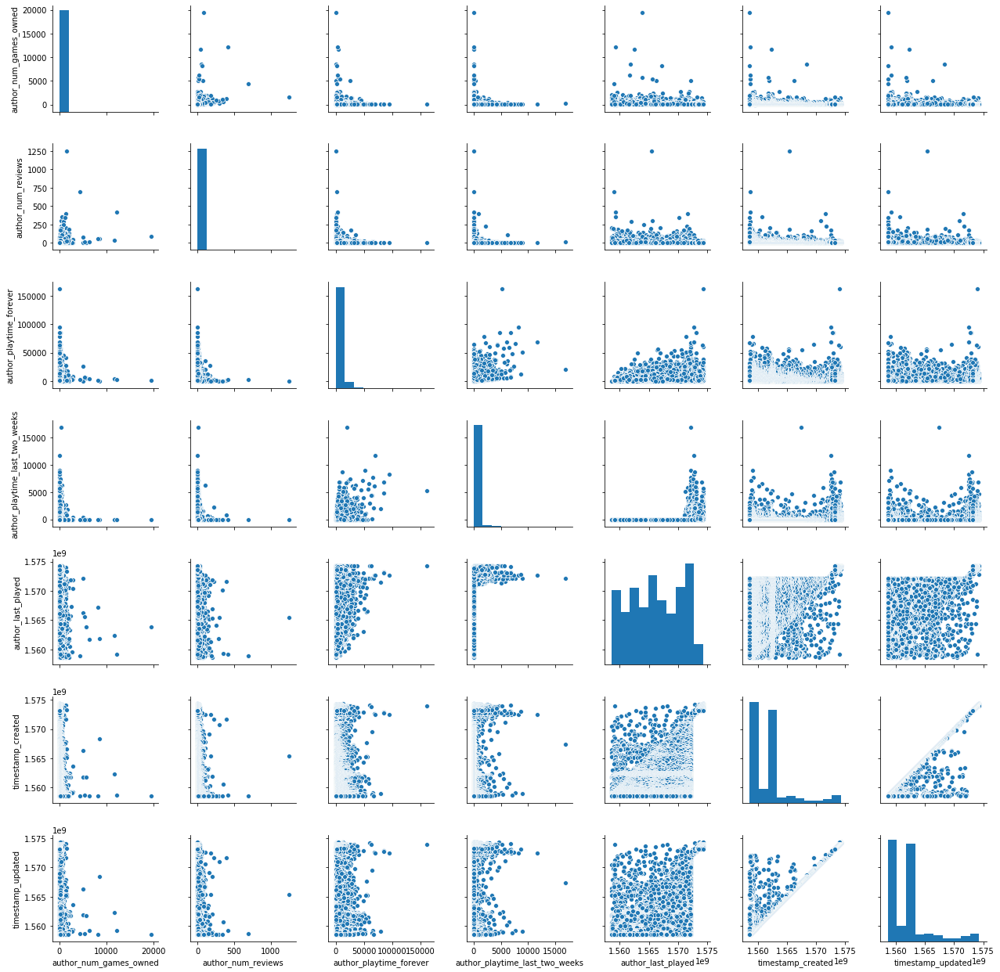

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
# plot charts inline
%matplotlib inline
num_data = df_raw[['author_num_games_owned','author_num_reviews','author_playtime_forever',
                   'author_playtime_last_two_weeks','author_last_played','timestamp_created',
                   'timestamp_updated']]
sns.pairplot(data=pd.get_dummies(num_data))


In [14]:
# To see the corralation between each numerical variable
num_data.corr()

,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_last_played,timestamp_created,timestamp_updated
author_num_games_owned,1.000000,0.287392,-0.074896,-0.031282,-0.085035,-0.033253,-0.030844
author_num_reviews,0.287392,1.000000,-0.080439,-0.013017,-0.067750,-0.055304,-0.021615
author_playtime_forever,-0.074896,-0.080439,1.000000,0.374205,0.384235,0.074799,0.089645
author_playtime_last_two_weeks,-0.031282,-0.013017,0.374205,1.000000,0.283315,0.207397,0.202133
author_last_played,-0.085035,-0.067750,0.384235,0.283315,1.000000,0.213381,0.225296
timestamp_created,-0.033253,-0.055304,0.074799,0.207397,0.213381,1.000000,0.938900
timestamp_updated,-0.030844,-0.021615,0.089645,0.202133,0.225296,0.938900,1.000000


- From the corralation matrix show above, we find that author_playtime_forever is positive relative to author_playtime_last_two_weeks and author_last_played.This makes sense. Because if a player have spent much time on such a game, then he or she may have a higher probability to play it in last two weeks.
- Also we find timestamp_created and timestamp_updated are highly positive relative.That indicates that when a person create a review, he will update it soon. The time spans are not long apart. At the same time, when we make a regression model on these two feature, we should pay attention to the variance caused by the linear dependency.

- We also draw  histergram for some variables

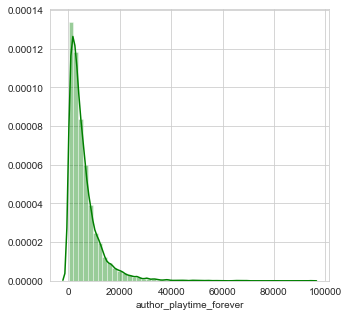

In [15]:
sns.set_style("whitegrid")
plt.figure(figsize=(5, 5))
sns.distplot(df_raw["author_playtime_forever"], color='g', bins=50);


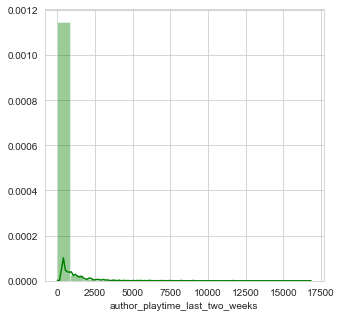

In [16]:
sns.set_style("whitegrid")
plt.figure(figsize=(5, 5))
sns.distplot(df_raw["author_playtime_last_two_weeks"], color='g', bins=20);

- From the histogram above, we find that the distribution of author_playtime_forever and author_playtime_last_two_weeks are similar.We can learn the relation between these variable later.Also,according to this nature, we can make a estimation basing on another one if we need.

# 2.2 Focus on the bool variable: steam_purchase. 
After analyze some distribution, correlation, next we want to see some Inspiration from steam_purchase
- Remind that: 
 - steam_purchase -  true if the user purchased the game on Steam
- We want to see from different group of people, are there any difference in numerical variable

- 2.2.1 Buy or not buy (basing on the variable steam_purchase)
 - For each group, we study:
   - author_num_games_owned  
   - author_num_reviews
   - author_playtime_forever  

In [171]:
# The datascience package was written for use in Berkeley’s DS 8 course 
# and contains useful functionality for investigating and graphically displaying data.
# http://data8.org/datascience/
from datascience import * 

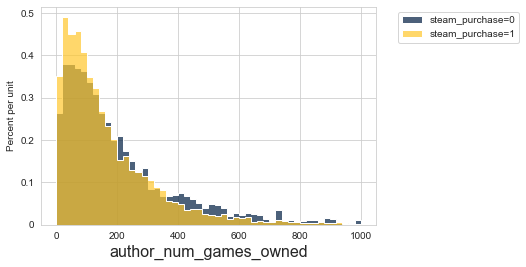

In [172]:
games_owned_buy_or_not_buy =  Table.from_df(df_raw[['author_num_games_owned','steam_purchase']], keep_index=False).where(0,are.below(1000))
games_owned_buy_or_not_buy.hist('author_num_games_owned', group = 'steam_purchase',bins= 50)

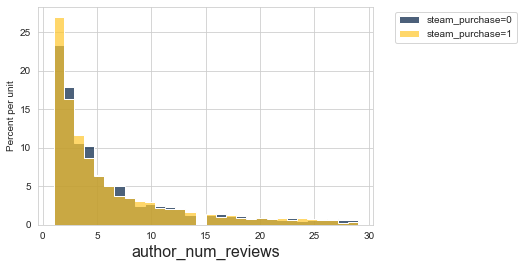

In [173]:
author_num_reviews_buy_or_not_buy = Table.from_df(df_raw[['author_num_reviews','steam_purchase']], keep_index=False).where(0,are.below(30))
author_num_reviews_buy_or_not_buy.hist('author_num_reviews', group = 'steam_purchase',bins= 30)

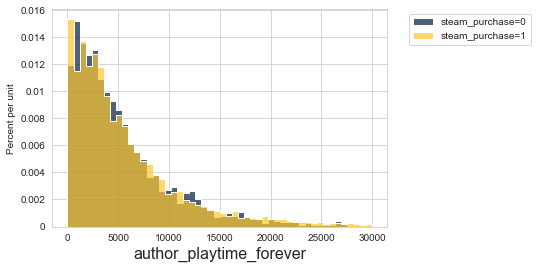

In [174]:
author_playtime_forever_buy_or_not_buy = Table.from_df(df_raw[['author_playtime_forever','steam_purchase']], keep_index=False).where(0,are.below(30000))
author_playtime_forever_buy_or_not_buy.hist('author_playtime_forever', group = 'steam_purchase',bins= 50)                                                                                                                                                    

From the hist curve above, we can't see too much difference between different group

- To exam this result, We can make a A/B test on this two variable:
  - $H_{0}$: group A and group B are from the same distribution
  - $H_{1}$: group A and group B are not from the same distribution
  - Statistic = $\mu_{0}$ - $\mu_{1}$

In [175]:
# The datascience package was written for use in Berkeley’s DS 8 course 
# and contains useful functionality for investigating and graphically displaying data.
# http://data8.org/datascience/
from datascience import * 

# A/B test
def difference_mean(tbl):
    mean_tbl = tbl.group('steam_purchase', np.average)
    mean = mean_tbl.column(1)
    return mean.item(1) - mean.item(0)
    



def AB_test(tbl,n):
    observed = difference_mean(tbl)
    label = tbl.column('steam_purchase')
    differences = make_array()
    for i in range(n):
        shuffled_labels = tbl.sample(with_replacement=False).column(0)
        original_and_shuffled = Table().with_columns('new',shuffled_labels,'steam_purchase',label)
        new_difference = difference_mean(original_and_shuffled)
        differences = np.append(differences, new_difference)
    empirical_P = np.count_nonzero(differences <= observed) / n
    Table().with_column('Difference Between Group Averages', differences).hist()
    
    print('Observed value:', observed)
    print('p value:', empirical_P)

Observed value: -40.211385555467245
p value: 0.0


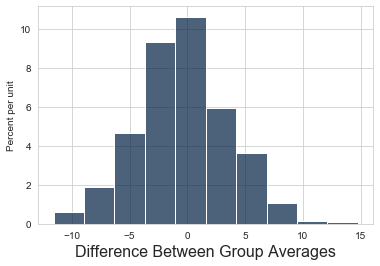

In [176]:
# A/B test on author_num_games_owned 
AB_test(games_owned_buy_or_not_buy,500)

Observed value: -0.25645377730389907
p value: 0.034


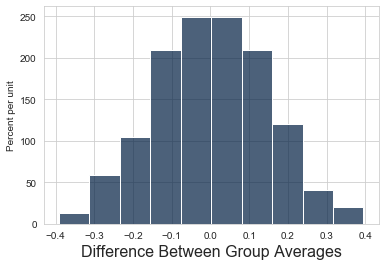

In [177]:
# A/B test on author_num_reviews 
AB_test(author_num_reviews_buy_or_not_buy,500)

Observed value: 219.78640426897618
p value: 0.948


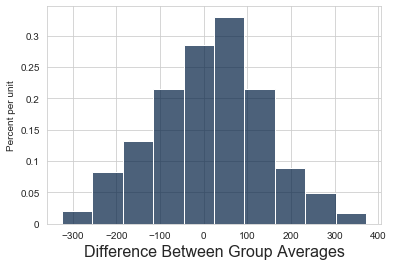

In [178]:
# A/B test author_playtime_forever
AB_test(author_playtime_forever_buy_or_not_buy,500)

# Conclusion
- From the result of A/B test,we find that people of different group of steam_purchase aren't affected by games_owned_buy and author_num_reviews .So for the steam company, these two variable are not very valuable when they want to analysis whether the customers would buy the game.However,the author_playtime_forever is meaningful because the p value is 0.968 shows that these two group are really different.For the steam company,they should pay attention to the author_playtime_forever and target the customers who are more likely to buy the product.

# 3. Setiment analysis 

- Motivation:Try the naive approach based on positive/negative keywords to determine sentiment and analyze its performance.
- For each document
  - We use our tokenize function on each document.
  Define a function "**tokenize**" as follows: 
   - takes a string as an input
   - converts the string into lower case
   - tokenizes the lower-cased string into tokens. A token is defined as follows:
      - a token has at least 2 characters
      - a token must start with an alphabetic letter (i.e. a-z or A-Z), 
      - a token can have alphabetic letters, "\-" (hyphen), "." (dot), "'" (single quote), or "\_" (underscore) in the middle
      - a token must end with an alphabetic letter (i.e. a-z or A-Z) 
   - removes stop words from the tokens (use English stop words list from NLTK) 
   - returns the resulting token list as the output
   
  - Counts positive words and negative words in the tokens using the positive/negative words lists. With a list of negation words (i.e. not, no, isn't, wasn't, aren't, weren't, don't didn't, cannot, couldn't, won't, neither, nor), the final positive/negative words are defined as follows:
    - Positive words:
      * a positive word not preceded by a negation word 
      * a negative word preceded by a negation word
    - Negative words:
      * a negative word not preceded by a negation word
      * a positive word preceded by a negation word
    - determined the sentiment of the string as follows:
       - 2: number of positive words > number of negative words
       - 1: number of positive words <= number of negative words
- Remind that: 
 - voted_up - true means it was a positive recommendation

In [180]:
import nltk
from nltk.corpus import stopwords
import csv
from scipy.spatial import distance
import pandas as pd
import numpy as np
from sklearn.preprocessing import normalize
def tokenize(text):
    
    tokens = None
    text_lower = text.lower()
    stop_words = set(stopwords.words('english'))
    pattern = r'[a-zA-Z]+[-\._\']*[a-zA-Z]+'
    token1 = nltk.regexp_tokenize(text_lower,pattern)
    tokens = [i for i in token1 if i not in stop_words]
    return tokens

def sentiment_analysis(text, positive_words, negative_words):
    
    negations=["not", "no", "isn't", "wasn't", "aren't", \
               "weren't", "don't", "didn't", "cannot", \
               "couldn't", "won't", "neither", "nor"]
    sentiment = None
    tokens = tokenize(text)
    length = len(tokens)
    i = 1
    number_of_positive_words = 0
    number_of_negative_words =0
    while i < length:
        if tokens[i] in positive_words:
            # A positive word not preceded by a negation word
            if tokens[i-1] not in negations:
                number_of_positive_words += 1
            # A positive word preceded by a negation word
            elif tokens[i-1] in negations:
                 number_of_negative_words += 1
        
        elif tokens[i] in negative_words:
            # A negative word not preceded by a negation word
            if tokens[i-1] not in negations:
                number_of_negative_words += 1
            # A negative word preceded by a negation word
            elif tokens[i-1] in negations:
                number_of_positive_words += 1
        i += 1
    if number_of_positive_words > number_of_negative_words:
        sentiment = 2
    else:
        sentiment = 1      
    return sentiment

with open("positive-words.txt",'r') as f:
    positive_words=[line.strip() for line in f]
        
with open("negative-words.txt",'r') as f:
    negative_words=[line.strip() for line in f]
text = df_raw['review']

In [181]:
# Calculate the sentiment 
sentiment = [sentiment_analysis(t, positive_words, negative_words) for t in text]

In [182]:
sentiment_T_or_F = [i == 2 for i in sentiment]
percentage_of_positive = np.count_nonzero(sentiment_T_or_F)/len(sentiment_T_or_F)
print('About %.2f of reviewers think this is game is good basing on the comments' % percentage_of_positive)

About 0.53 of reviewers think this is game is good basing on the comments


Check the accuracy of our sentiment_analysis
 - Since we have a feature of 'voted_up',true means it was a positive recommendation while false means a negative. We can use this column to check if our sentiment_analysis function work

In [183]:
True_sentiment = df_raw['voted_up'] # true means it was a positive recommendation
accuracy_sentiment = np.count_nonzero(True_sentiment == sentiment_T_or_F)/len(sentiment_T_or_F)
print('The accuracy of our sentiment_analysis is %.2f' % accuracy_sentiment)

The accuracy of our sentiment_analysis is 0.58


# Conclusion
The accuracy of our sentiment_analysis is not very idealy.In the later work we will improve our sentiment_analysis function. 

# 4. TF-IDF model on prediction of steam_purchase and voted_up
So much analysis on variable steam_purchase have been made before such as A/B test.Now we are focusing on the text and see what we can get from the TF-IDF model

In [184]:
import pandas as pd
import numpy as np
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve,auc,precision_recall_curve,average_precision_score
from matplotlib import pyplot as plt
from sklearn.model_selection import cross_validate,cross_val_score,StratifiedKFold
from sklearn.naive_bayes import MultinomialNB

First we draw the TF-IDF matrix:

In [185]:
from sklearn.feature_extraction.text import TfidfVectorizer
text = df_raw['review']
label_1 = df_raw['steam_purchase']
label_2 = df_raw['voted_up']
tfidf_vect = TfidfVectorizer(stop_words="english") 
# generate tfidf matrix
dtm= tfidf_vect.fit_transform(text)

print("type of dtm:", type(dtm))
print("size of tfidf matrix:", dtm.shape)

type of dtm: <class 'scipy.sparse.csr.csr_matrix'>
size of tfidf matrix: (9363, 17512)


We use linear SVM algorithm as an example:
- First we make the classification on steam_purchase
- Second we make the classification on voted_up
- After that,we see the performance on each classifier


In [186]:
# On steam_purchase
# Use SVM algorithm
from sklearn.svm import LinearSVC
# import method for split train/test data set
from sklearn.model_selection import train_test_split

# import method to calculate metrics
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import classification_report

# split dataset into train (70%) and test sets (30%)
X_train, X_test, y_train, y_test = train_test_split(dtm, label_1, test_size=0.3, random_state=0)

# train a multinomial naive Bayes model using the testing data
clf = LinearSVC().fit(X_train, y_train)

# predict the news group for the test dataset
predicted=clf.predict(X_test)
y_score = clf.decision_function(X_test)
# get the list of unique labels
labels=['0','1']
print(classification_report(y_test, predicted, target_names=labels))

              precision    recall  f1-score   support

           0       0.29      0.10      0.15       801
           1       0.71      0.90      0.80      2008

    accuracy                           0.67      2809
   macro avg       0.50      0.50      0.47      2809
weighted avg       0.59      0.67      0.61      2809



In [187]:
# On voted_up
# Use SVM algorithm
from sklearn.svm import LinearSVC
# import method for split train/test data set
from sklearn.model_selection import train_test_split

# import method to calculate metrics
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import classification_report

# split dataset into train (70%) and test sets (30%)
X_train, X_test, y_train, y_test = train_test_split(dtm, label_2, test_size=0.3, random_state=0)

# train a multinomial naive Bayes model using the testing data
clf = LinearSVC().fit(X_train, y_train)

# predict the news group for the test dataset
predicted=clf.predict(X_test)
y_score = clf.decision_function(X_test)
# get the list of unique labels
labels=['0','1']
print(classification_report(y_test, predicted, target_names=labels))

              precision    recall  f1-score   support

           0       0.76      0.57      0.65       405
           1       0.93      0.97      0.95      2404

    accuracy                           0.91      2809
   macro avg       0.85      0.77      0.80      2809
weighted avg       0.91      0.91      0.91      2809



# Conclusion
From the result above,we find that TF-IDF model work well on voted_up but not so good on steam_purchase.This is because voted_up is more suitable than steam_purchase in this classification case.It makes sense.Because voted_up is the variable that reflect the customer whether satisfied with the product.At the same time,the text of reviews also can reflect the same thing.So this is about information retrieval.However for the steam_purchase,we can't get this imformation from what the customers say,or the relationship between these two variable is small.

# The below are after the midterm project

###  - Before carry on the rest of the analysis, we want to see if the reviews are all come from different people. 

In [112]:
# The whole number of reviews are 9773,
# We want to see the number of distinct author_steamid
df_raw['author_steamid'].value_counts()

76561198136128734    1
76561198079776589    1
76561198893354059    1
76561198026491581    1
76561198001530917    1
                    ..
76561198162061124    1
76561198207097551    1
76561197982901119    1
76561198007557318    1
76561198071962956    1
Name: author_steamid, Length: 9773, dtype: int64

### - And the result shows us that the reviews are all coming from different people, that is, no one makes comment over twice.

# 5. Sentiment analysis improvement

### Because of the bad accuracy, we used another method-vader to classify the two sentiment

In [430]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from nltk.corpus import wordnet as wn
from sklearn.metrics import accuracy_score
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk import tokenize
# The text variable is the focus of the project 
text = df_raw['review']
time = df_raw['author_playtime_forever']
vote = df_raw["voted_up"]

#### 1.we used total reviews to classify them into three sentiments: positive, negative and neutral

In [431]:
text = list(text)
time = list(time)
vote = list(vote)
for i in range(len(vote)):
    if vote[i] == True:
        vote[i] = 1
    else:
        vote[i] = 0
sentences = text
Pos_text = []
Neg_text = []
Neu_text = []
Pos_vote = []
Neg_vote = []
Pos = []
Neg = []
s1 = []
s2 = []
s3 = []

sid = SentimentIntensityAnalyzer()
dic = {}
J = {}
for i in range(len(text)):
    dic[i] = time[i]

for sentence in sentences:
    print(sentence)
    ss = sid.polarity_scores(sentence)
    for k in sorted(ss):
        print('{0}: {1}, '.format(k, ss[k]))
    if(ss['compound'] >= 0.0):
        if(ss['compound'] > 0.0):
            Pos_text.append(sentence)
        else:
            Neu_text.append(sentence)
    else:
        Neg_text.append(sentence)
dic2 = sorted(dic.items(), key=lambda e:e[1], reverse=True)
a = int((len(dic2))/3)
b = int(a*2+1)
d1 = dic2[0:a+1]
d2 = dic2[a+1:b+1]
d3 = dic2[b+1:]
for i in range(len(d1)):
    d1[i] = d1[i][0]
for i in range(len(d1)):
    s1.append(text[d1[i]])
for i in range(len(d2)):
    d2[i] = d2[i][0]
for i in range(len(d2)):
    s2.append(text[d2[i]])
for i in range(len(d3)):
    d3[i] = d3[i][0]
for i in range(len(d3)):
    s3.append(text[d3[i]])

#calculate accuracy
for i in range(len(text)):
    J[i] = (vote[i],text[i])
for i in range(len(J)):
    if J[i][1] in Pos_text:
        Pos_vote.append(J[i][0])
    if J[i][1] in Neg_text:
        Neg_vote.append(J[i][0])
for i in range(len(Pos_vote)):
    Pos.append(1)
for i in range(len(Neg_vote)):
    Neg.append(0)
acc_Pos = accuracy_score(Pos_vote,Pos)
# acc_Pos_N = accuracy_score(Pos_vote,Pos,normalize = False)



For the first few hours, the game awes you with seemingly deep mechanics on the campaign map.

But it's still the same confusing system introduced with Shogun 2. Produce food, specialize some settlements, struggle with money, watch the AI churn out twice as many armies as you...

Total war games are tedious to play. 3 kingdoms is no different.
compound: -0.7845, 
neg: 0.157, 
neu: 0.807, 
pos: 0.037, 
Don't buy this if you like Total War.
compound: -0.34, 
neg: 0.315, 
neu: 0.484, 
pos: 0.202, 
A good back to form for total war, so far a game im enjoying, ill update if things change
compound: -0.1027, 
neg: 0.258, 
neu: 0.5, 
pos: 0.242, 
Would be great for once that if they made games such as this and the Warhammer franchise more compatible with a more general standard of  systems requirements , not just for the high res five percent ; methinks of going back to the likes of Shogun 2 and the such...it didn't say fu@k!ng engaged on the door!!
compound: 0.7592, 
neg: 0.038, 
neu: 0.833, 

compound: 0.9913, 
neg: 0.128, 
neu: 0.723, 
pos: 0.15, 
amazing game ! love it !!
compound: 0.8713, 
neg: 0.0, 
neu: 0.253, 
pos: 0.747, 
excellent
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
The review bombing from chinese users shouldn't detract you from purchasing this quality game, especially if it's on sale. It's bang for your buck product and the upcoming updates to characters for the main three kingdoms campaign are definitely worth looking forward to! NANMAN ARE COMING!!!! Other than that, the diplomacy in total war is finally effective and most importantly the battles aren't a slog like Rome 2 (closer to Medieval 2 if you've actually played the game recently). Good job CA :)

Edit: Also, have to talk about the BS mod censorship people keep harping on about. You waifu loving individuals are creeps and the mods that tried to make characters like Sun Ren into this sexed up figure are just sad. Beat your meat to something more appropriate ffs
compound: 0.6704, 
neg: 0.117

compound: -0.9119, 
neg: 0.132, 
neu: 0.744, 
pos: 0.124, 
I see now why people are review bombing this game. And I have to say i agree with every single one of them. I have been playing total war franchise since rome 1 and this is the first time im truly dissapointed in CA and have to say that they might not get a single penny more from me because of this i dont support anti-consumer greedy companies. As Rome once fell CA will too dont be the next cao cao.
compound: 0.2509, 
neg: 0.074, 
neu: 0.816, 
pos: 0.11, 
I really hate when some people start whining about something unnecessary and developers think that is opinion of all player base. Towers are worthless, defense battles are just auto resolve for me. When attacking, i just charge, i do not need to worry about towers anymore, i do not like constant "balance" changes. Do these in multi player if you need to.
compound: -0.8749, 
neg: 0.229, 
neu: 0.68, 
pos: 0.09, 
As it shows above i have played over 900 hours of this game. Howeve

compound: 0.8294, 
neg: 0.086, 
neu: 0.8, 
pos: 0.115, 
Censorship of mods being main feature
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
This is the last Total War game i buy, my love for this series has fizzled out the a giant thud on this game. These games just have no improved like other games have over the decades its been around. The peak AI in this series was mid 2000's and each game i buy is plagued with problems that takes time out of my life to fix.

This game is boring, unrealistic and just plain inaccessable. The map is just move fight, move fight against copy paste factions; To pretend that every faction in the romance of the 3 kingdoms is just lazy.

pick it up on sale for about £10 for a few hours of fun. But thats the best i can recommend.
compound: 0.7351, 
neg: 0.138, 
neu: 0.703, 
pos: 0.16, 
I can't believe you guys became a vassal for China so hard... censoring mods just to please your Chinese Emperor? I personally hope Lü Bu himself barges into your HQ and ro

pos: 0.0, 
As a Dynasty Warriors fanboy I love it.
compound: 0.6369, 
neg: 0.0, 
neu: 0.543, 
pos: 0.457, 
Some good ideas with a fair amount of missteps and a bit of a half-hearted effort on key mechanics.

Diplomacy is the main thing I feel is universally improved for the series in Three Kingdoms, but it still has the issue of artificial and arbitrary AI hostility that has been present in the series since the beginning of time. No matter how you politically maneuver, you will always end up with just about everyone hating you thanks to a gradually growing malus to relations; you'll sometimes even find yourself to be public enemy number 1 much faster than you expect, regardless of how many warlords are more powerful than you. Makes sense, given it's 'Total War' not 'Total Peace', but why push for greater diplomacy when the end result is always backstabs and universal conflict?

The hero system is a really good idea on paper, but for whatever reason CA really half-assed a lot of it. Gen

compound: -0.3281, 
neg: 0.115, 
neu: 0.767, 
pos: 0.118, 
Poor graphics and poor mechanics.  Reminds me of the first Shogun Total War only with less immersion and much worse interactivity.
compound: -0.9217, 
neg: 0.437, 
neu: 0.563, 
pos: 0.0, 
this is a good game
compound: 0.4404, 
neg: 0.0, 
neu: 0.508, 
pos: 0.492, 
Total War: Three Kingdoms is a wonderful game. But if CA is partnering with netease, then even as an American I feel a need to review it negatively. This game is obviously a love letter to China that already has thousands of Chinese players. They deserve better then netease.
compound: 0.7845, 
neg: 0.07, 
neu: 0.736, 
pos: 0.194, 
We hope that your company will terminate cooperation with Netease, otherwise this difference evaluation will exist under all the Total War series games and DLCs forever.We are so sorry for that.
compound: -0.4101, 
neg: 0.154, 
neu: 0.766, 
pos: 0.079, 
由于贵司近期与网易进行了合作，所以作为中国玩家，很遗憾，只能给予贵司游戏差评
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Gr

compound: 0.9537, 
neg: 0.084, 
neu: 0.717, 
pos: 0.199, 
Best historical Total War game to date
compound: 0.0772, 
neg: 0.298, 
neu: 0.382, 
pos: 0.321, 
I'm a novel fan, I don't play games but I bought a new computer for this. BUT, after a few hours play, I was pretty frustrated and disappointed. 
This game inherits only the Three-Kingdoms characters' names, appearances, city names, that's all. Neither it is based on history, novel, nor even real logic. For example:
- Liu Bei can recruit Xiahou Yuan! I don't think Liu Bei could or even wanted to recruit Xiahou Family at all! Because Xiaohou == Cao Cao.
- Liu Bei can recruit Ma Teng, What? Then where are Ma Teng's sons: Ma Chao and Ma Dai? I want them too!
- Nameless officials can fight famed general. Please! The general should kill them in one round!
- Why can't I summon a general alone without buying his troops? I paid his salary!
- Why can't I switch troops between generals?
- Why should player even care about 'gold'? Even true his

compound: -0.945, 
neg: 0.091, 
neu: 0.853, 
pos: 0.056, 
Mods do not work on the Mac OS.
They are listed on the launcher but not applied in the actual game.
It is hard to get in touch with the support team.

compound: 0.4497, 
neg: 0.046, 
neu: 0.853, 
pos: 0.101, 
Great game. I played lots of TW:Warhammer I&II but this is the first Total War game were I finished a campaign. And the reason for that is diplomacy. The Warhammer games become boring after about 40 rounds cause it is just so repetative which Three Kindoms does better there is more stuff to do endgame.

But this game lacks different types of units unlike the Warhammer games which makes sense couse you can't have dragons, orks etc like a fantasy game if it is just based on chinas history. 8/10

Combine Warhammer and Three Kindoms and you have the perfect Total War game.


compound: 0.1901, 
neg: 0.113, 
neu: 0.752, 
pos: 0.135, 
This is a review after achieving a victory in co-op campaign on hard difficulty. (An important no

neg: 0.09, 
neu: 0.66, 
pos: 0.249, 
great fun!
compound: 0.8268, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
I love the gameplay but hate the constant crashes. hours and hours spent in campaigns I cannot finish because the game is unstable. I will recommend it when they iron it out a bit more.
compound: -0.5346, 
neg: 0.202, 
neu: 0.656, 
pos: 0.142, 
9/10
a steep learning curve but definitely enthralling even for newcomers.

compound: 0.5499, 
neg: 0.0, 
neu: 0.717, 
pos: 0.283, 
Awesome historical Total War game. The politics system is extraordinary with 5,000 options to influence deals, including threatening them with a butt-whoopin'.
Combat is fun and I like how vital your archers are in this game dealing loads of damage, but for the most part having very little ammunition.
compound: -0.1027, 
neg: 0.152, 
neu: 0.703, 
pos: 0.145, 
I really love this game's aesthetic. That being said, they didn't playtest this game for 15 minutes. Quickbattles not only has a decade old QB bug from total war

neg: 0.056, 
neu: 0.944, 
pos: 0.0, 
One of the best Total War titles to date
compound: 0.0772, 
neg: 0.258, 
neu: 0.464, 
pos: 0.278, 
Enjoying the game, can;t wait for more DLC to complete this game.
compound: 0.5267, 
neg: 0.0, 
neu: 0.764, 
pos: 0.236, 
Great improvements on the classic TW formula, big recommendation!
compound: 0.7712, 
neg: 0.0, 
neu: 0.511, 
pos: 0.489, 
I spent days in a row on this. Romance mode is awesome. If you like any strategy game you'll like this.
compound: 0.9239, 
neg: 0.0, 
neu: 0.529, 
pos: 0.471, 
Its good
compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
I have played all the Total war games except the original Shogun and Medieval and this is the first one i actually finished a grand campaign in! 

Pros:
+ Since every faction is using almost the same units, the game only ever feels as unfair as your starting location/strength

+ I love the romance mode, it really adds flavour to what could otherwise be quite a bland game (Though Shogun 2 is g

compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
Fun game if you are looking to kill some time. The dynamic diplomacy and character interactions throughout game is interesting and adds a new element to consider. Otherwise its your standard Total War strat with different unit/army generation.

Worth the  buy if you have the time for it.
compound: -0.0258, 
neg: 0.143, 
neu: 0.682, 
pos: 0.175, 
Good fun.
compound: 0.7351, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
It's ok
compound: 0.296, 
neg: 0.0, 
neu: 0.312, 
pos: 0.688, 
Good!Very good!
compound: 0.5399, 
neg: 0.0, 
neu: 0.223, 
pos: 0.777, 
Great game. Love the diplomacy element of the game. Being of Chinese descent, I really appreciate the cultural element of the game. The importance of "guanxi" is really shown in the complex diplomacy system. Additionally, the ability to offer and accept marriage is true historically where marriage was sometimes used as a tool to solidify the relationship between two factions.

I really like the i

compound: -0.1991, 
neg: 0.085, 
neu: 0.831, 
pos: 0.084, 
Had to pay for blood DLC yet again.


compound: -0.1027, 
neg: 0.167, 
neu: 0.833, 
pos: 0.0, 
Noice
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Hours of fun,
compound: 0.5106, 
neg: 0.0, 
neu: 0.377, 
pos: 0.623, 
Amazing game. I love the total war series as a whole but this game is one of my favorites by far just for the fact that it's based off of the three kingdoms
compound: 0.7391, 
neg: 0.064, 
neu: 0.708, 
pos: 0.228, 
Great game
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Very good, much wow
compound: 0.8051, 
neg: 0.0, 
neu: 0.216, 
pos: 0.784, 
Good game
compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
I am new to total war, and I was not sure if I would enjoy it but I really do. I can`t stop playing this game, It is really a game for me.
compound: -0.4266, 
neg: 0.213, 
neu: 0.658, 
pos: 0.129, 
Hands down the best Total War yet! :)
compound: 0.5562, 
neg: 0.238, 
neu: 0.305, 
pos: 0.457, 
Pre

Pretty dope. Best campaign in TW to date.
compound: 0.8126, 
neg: 0.0, 
neu: 0.448, 
pos: 0.552, 
Its fun
compound: 0.5106, 
neg: 0.0, 
neu: 0.233, 
pos: 0.767, 
The battles become very repetitive in my opinion
compound: -0.5984, 
neg: 0.449, 
neu: 0.551, 
pos: 0.0, 
Been a Total War fan for a long time, as well as a Dynasty Warriors fan. I feel they did right 👍
compound: 0.2023, 
neg: 0.165, 
neu: 0.551, 
pos: 0.284, 
send help


my favorite total war game
compound: 0.2023, 
neg: 0.287, 
neu: 0.294, 
pos: 0.419, 
Literally one of the best strategy games I've ever played. As much as I would want to make a full-scale review out of this(I'm mostly just doing it for the steam summer sale thing :]), there's not much need. If you like the period, buy the game. If you like strategy games, buy the game. If you like badass characters riding solo into a horde of enemies and decimating them, buy the game. If you like the opposite of that, there's a mode to keep the heros in check.

It has everyt

10/10 would tarde half of  my holdings for rice again.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
This is a very solid total war game. Unfortunately, I personally cant get into the setting, having been spoiled by the insane variety found in the Warhammer games. It was worth the purchase, since it does everything right, and I am planning on playing some more, but Warhammer 2 keeps pulling me away. Nothing against this game, just major props to CA for the stuff they've been putting out
compound: -0.4282, 
neg: 0.088, 
neu: 0.85, 
pos: 0.062, 
One of the best Total War games at launch in a long while!
compound: 0.1511, 
neg: 0.212, 
neu: 0.544, 
pos: 0.244, 
Best game in the series!
compound: 0.6696, 
neg: 0.0, 
neu: 0.471, 
pos: 0.529, 
Zhang Fei just routed an entire army by himself. 

10/10 for literary accuracy.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Played a lot of total war over the years my personal favourites of the series were shogun 1 & 2 and Warhammer 1 & 2. If 

pos: 0.0, 
Really good
compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
Solid game. the campaign map is amazing and breathtaking. wish there was more faction variety
compound: 0.8779, 
neg: 0.0, 
neu: 0.498, 
pos: 0.502, 
I can't wait for more factions.  It would be cool to have Lu Bu as one of them.
compound: 0.3182, 
neg: 0.0, 
neu: 0.874, 
pos: 0.126, 
Great game!
compound: 0.6588, 
neg: 0.0, 
neu: 0.185, 
pos: 0.815, 
A pretty solid entry in the Total War series.
compound: -0.0258, 
neg: 0.285, 
neu: 0.365, 
pos: 0.35, 
Amazing Game 10/10 would defo recoment for anybody who loves stratergy war games good for both total war veterans and newbies
compound: 0.3818, 
neg: 0.228, 
neu: 0.468, 
pos: 0.304, 
Super fun game. Always a fan of total war
compound: 0.6808, 
neg: 0.224, 
neu: 0.23, 
pos: 0.546, 
Just love it
compound: 0.6369, 
neg: 0.0, 
neu: 0.323, 
pos: 0.677, 
Do Not Pursue Lu Bu
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
One of the best total war instalment till 

compound: 0.5456, 
neg: 0.176, 
neu: 0.6, 
pos: 0.224, 
Cao Cao  approves.
compound: 0.4019, 
neg: 0.0, 
neu: 0.426, 
pos: 0.574, 
Beautiful UI, AI diplomacy and interaction is awesome, Love the Romance mode where your commanders become single unit juggernauts, the map is beautifully crafted and it's one of the first total wars not to be riddled with bugs and frame rate issues at launch so well done CA! 


compound: 0.9635, 
neg: 0.054, 
neu: 0.611, 
pos: 0.336, 
New king of Total War games.  I am glad they finally got back to the historic style games in the series.  It turned out great.  You can play the most fantasy version with almost super hero generals, or you can play a more traditional version where the armies determine victory.

The AI and diplomacy outside of the battles has been improved greatly.  I feel like alliances and relationships actually matter in this game.

Overall, it is a strong yes from me, but I love all the Total War games!
compound: 0.9169, 
neg: 0.09, 
neu: 0

compound: 0.7201, 
neg: 0.146, 
neu: 0.667, 
pos: 0.188, 
Im really enjoying the game alot
compound: 0.5709, 
neg: 0.0, 
neu: 0.575, 
pos: 0.425, 
After Going to China and then playing Three Kingdoms i was completely blown away by the pleasing aesthetics of this beautiful game. Then to get into gameplay, as compared to the previous Total War games this one is completely on par with Warhammer 2 which is great but also has a lot of the features of older games such as Shogun and this combination makes it very exciting to play. And now that they have added blood and gore Three Kingdoms has become sublime. 
9.3/10
compound: 0.9293, 
neg: 0.026, 
neu: 0.792, 
pos: 0.182, 
I like it.
compound: 0.3612, 
neg: 0.0, 
neu: 0.286, 
pos: 0.714, 
always loved the total war franchise and the three kingdoms story. this is a great combination of the two. just wish there were more playable campaigns.
compound: 0.7783, 
neg: 0.11, 
neu: 0.59, 
pos: 0.301, 
Best Total War
compound: 0.0772, 
neg: 0.429, 
ne

compound: 0.7003, 
neg: 0.12, 
neu: 0.646, 
pos: 0.234, 
What a game.  Would war again.  Totally.
compound: -0.5994, 
neg: 0.438, 
neu: 0.562, 
pos: 0.0, 
Good game, very fun, summer sale is good too
compound: 0.8553, 
neg: 0.0, 
neu: 0.39, 
pos: 0.61, 
A brilliant addition to the Total War franchise and I cannot recommend it enough. It is definitely the hardest Total War game due to some of the hero-based changes, but it is engaging and addicting.
compound: -0.1293, 
neg: 0.164, 
neu: 0.685, 
pos: 0.151, 
Summon the Merchants! I wish to browse their goods.
compound: 0.4574, 
neg: 0.0, 
neu: 0.701, 
pos: 0.299, 
First TW game. Good game and will come back to it when mod support happens. Dislike they sell you $3 blood dlc... in a war game.
compound: -0.2263, 
neg: 0.196, 
neu: 0.634, 
pos: 0.169, 
tl:dr best tw to come out in awhile
compound: 0.6369, 
neg: 0.0, 
neu: 0.625, 
pos: 0.375, 
zhao yun is cute
compound: 0.4588, 
neg: 0.0, 
neu: 0.5, 
pos: 0.5, 
Best TW release thanks to the d

compound: 0.9973, 
neg: 0.109, 
neu: 0.737, 
pos: 0.155, 
Pretty neat
compound: 0.7351, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Little tough to get used to the UI but a really fun installment to the franchise.
compound: 0.699, 
neg: 0.058, 
neu: 0.684, 
pos: 0.257, 
Sun Ren is my Waifu
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
pick yellow turbs and live out the socialist dream 5/5 good game
compound: 0.5994, 
neg: 0.0, 
neu: 0.671, 
pos: 0.329, 
All the good stuff from Warhammer I and II minus the army of agents on the map.
compound: 0.4404, 
neg: 0.0, 
neu: 0.838, 
pos: 0.162, 
best total war
compound: 0.0772, 
neg: 0.429, 
neu: 0.11, 
pos: 0.462, 
Another fantastic addition to the Total War series. Its truly an epic experience.
compound: 0.3818, 
neg: 0.191, 
neu: 0.49, 
pos: 0.319, 
Best total war yet
compound: 0.0772, 
neg: 0.386, 
neu: 0.198, 
pos: 0.416, 
nice
compound: 0.4215, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
good game, just waiting for more DLC
compound: 0.4404, 
neg: 0.0, 
n

neg: 0.0, 
neu: 0.606, 
pos: 0.394, 
Chinese Generals: Gotta catch 'em all!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
This is an incredible game. If you are like me and will play any new total war that will come out, then this should be easy for you. Why are you still reading this? Buy it.
Everyone else? Like china? Battles? Risk? Buy it. Don't like any of that? Don't buy it.
compound: 0.6322, 
neg: 0.13, 
neu: 0.663, 
pos: 0.207, 
High quality game. I love reconquering china in the name of my family.
compound: 0.6369, 
neg: 0.0, 
neu: 0.724, 
pos: 0.276, 
Best game of the Total war Series :)
compound: 0.5106, 
neg: 0.242, 
neu: 0.311, 
pos: 0.447, 
I like the fact, that the battlefields are much bigger and not that arbitrary restricted, than in total war: Warhammer. Otherwise it's an okay total war title in a setting I still know next to nothing about even after playing through the game, which is kinda sad. It least managed to get me interested to find out more about the time.


compound: 0.0772, 
neg: 0.386, 
neu: 0.198, 
pos: 0.416, 
Good stuff.
compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
comeback series totalwar , this game so cool , i love it
compound: 0.8161, 
neg: 0.0, 
neu: 0.484, 
pos: 0.516, 
One of the best in the Total War series.
compound: 0.0772, 
neg: 0.258, 
neu: 0.464, 
pos: 0.278, 
The campaign and battle layers make what is happening on-screen much more apparent than previous Total War games.
Duel general system that Greats!!!!!

compound: -0.8257, 
neg: 0.267, 
neu: 0.733, 
pos: 0.0, 
"OK"
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Do not pursue Lu Bu!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Really good!
compound: 0.54, 
neg: 0.0, 
neu: 0.223, 
pos: 0.777, 
Are you a fan of Strategy games?
Are you a fan of playing Battles?
Is it your dream to become Emperor?

If you anwsered yes on all of these, you should buy it for sure.

Now, over to the more serious review.

Total War games have always been a fun experience for

compound: 0.7822, 
neg: 0.113, 
neu: 0.765, 
pos: 0.123, 
One of the best Total War game that i've ever played,
I love it!
compound: 0.8016, 
neg: 0.163, 
neu: 0.375, 
pos: 0.462, 
First time getting into the TW game, so far so good. I'm still learning the ropes of the game so I can't get into great depth into the review. But overall, the graphics, game play is great and it is similar with Civ, so I don't think its a very hard game to get into it if you have played Civ before.
compound: 0.1506, 
neg: 0.118, 
neu: 0.756, 
pos: 0.126, 
The best TW game in years.  The leaders have actual personalities, there is depth to the diplomacy, and the game has the feel of the actual story it's based on (note:  This is based on the story, not on the time period, though you can play it as straight history).

This is a rare improvement in the series in my eyes.  The series has a horrible history of really bad feature creep.  The feature balance in TWTK feels incredibly well done.  It felt familiar to

pos: 0.0, 
good stuff whallah
compound: 0.4404, 
neg: 0.0, 
neu: 0.408, 
pos: 0.592, 
Great Game!!!
compound: 0.7163, 
neg: 0.0, 
neu: 0.167, 
pos: 0.833, 
Amazing game! Love the feel, Art and also the music is amazing! If your looking for a game that is fun and challenges the mind but also sucks up all of your time look no further!
compound: 0.5463, 
neg: 0.133, 
neu: 0.614, 
pos: 0.254, 
Best Three Kingdoms game ever made!!!
compound: 0.7249, 
neg: 0.0, 
neu: 0.496, 
pos: 0.504, 
Found it a bit difficult to identify and relate to the game at first but after a few hours I've become really fond of the time era. :)
compound: 0.8196, 
neg: 0.053, 
neu: 0.696, 
pos: 0.251, 
Honestly the best Total War game ever made, imo. My previous favorite being Shogun 2 for reference.

Far more emphasis on diplomacy and the strategic map than their more recent games, and I love the romance style Generals smashing troops ala TW: Warhammer.

There is definitely less unit variety overall, but each factio

compound: 0.765, 
neg: 0.0, 
neu: 0.542, 
pos: 0.458, 
If you've played one total war, you've played them all. Slight changes here and there, overall a good game.
compound: 0.4215, 
neg: 0.152, 
neu: 0.547, 
pos: 0.301, 
Great game all time xD
compound: 0.836, 
neg: 0.0, 
neu: 0.275, 
pos: 0.725, 
Really Good!!!
compound: 0.6211, 
neg: 0.0, 
neu: 0.197, 
pos: 0.803, 
Good game.
compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
its guud
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Excellent game but the territory map is too small. If adding more of West China would be great.
compound: 0.8402, 
neg: 0.0, 
neu: 0.667, 
pos: 0.333, 
best in the serie !
compound: 0.6696, 
neg: 0.0, 
neu: 0.4, 
pos: 0.6, 
Murder
compound: -0.6908, 
neg: 1.0, 
neu: 0.0, 
pos: 0.0, 
One of the best Total War games in a while. They did a really good job capturing the Romance of the Three Kingdoms period, and on top of that the game is just really well done. A lot of Total War mechanics like diplomacy,

neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
good
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Total war BEST GAME! BEST GAME
compound: 0.8052, 
neg: 0.229, 
neu: 0.176, 
pos: 0.595, 
Very Good
compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
good for weekend
compound: 0.4404, 
neg: 0.0, 
neu: 0.408, 
pos: 0.592, 
Great game!
compound: 0.6588, 
neg: 0.0, 
neu: 0.185, 
pos: 0.815, 
is  0kay
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Best total war game by. I have been playing Total war since I got a demo disc as a teenager. Love this freaking game
compound: -0.2144, 
neg: 0.313, 
neu: 0.397, 
pos: 0.289, 
nice
compound: 0.4215, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
As a fan of the Total War series and of Dynasty Warriors, this is the best Total War game yet. It has two game mode you can play as depending on your tastes: Historical and Romance. Historical has your commander embedded in a unit like the other historical TW games, and there's no spell-like abilities. But since I came to

compound: -0.4767, 
neg: 0.383, 
neu: 0.617, 
pos: 0.0, 
An excellent game, good graphics, easy to understand even when u've never played a Total war before
compound: 0.8912, 
neg: 0.079, 
neu: 0.428, 
pos: 0.492, 
Best diplomacy gameplay out of all Total War games set in a very interesting period. Highly recommended!
compound: 0.6886, 
neg: 0.153, 
neu: 0.471, 
pos: 0.376, 
Good Total war game
compound: -0.25, 
neg: 0.443, 
neu: 0.227, 
pos: 0.33, 
I've tried out many Total War games but never really dedicated the time needed to get the full experience. I played the Dynasty Warriors games a lot growing up and grew to love the Romance of the Three Kingdoms, so this seemed like a great opportunity to really dig in. I've done that and I'm really glad I did. 

Total War: Three Kingdoms is a treat for the eyes and the campaign is a blast to play, though I am hoping the developers release some updates that fix late game play and player resources. Despite small issues in that regard, this is

neg: 0.088, 
neu: 0.698, 
pos: 0.214, 
Thought the Warhammer games were okay, but the world map had some issues. I love the changes that Three Kingdoms did for the series and I cannot wait to see what else they add to the game.
compound: 0.8047, 
neg: 0.0, 
neu: 0.82, 
pos: 0.18, 
Perfect blend of RTS/Family structure, all your favorite heroes, you can level them up, train them how you want, equip them and marry them, having children living their legacies on and on, to keep fighting for decades!

Only downside is they continue to release Blood packs for DLC.. this should be part of the games main content.. shameful.
compound: 0.5983, 
neg: 0.11, 
neu: 0.726, 
pos: 0.165, 
Overall, I enjoyed the game thoroughly and feel this game is an excellent addition to the total war series. Here are some pros and cons I've gathered based on my 100+ hours of playtime:

The good: 
-Excellent duel animations (though more variety is always welcome)
-Best diplomacy system of the series.
-Character drive

compound: 0.9952, 
neg: 0.068, 
neu: 0.694, 
pos: 0.238, 
If you're a fan of Romance of the Three Kingdoms, you'll enjoy this game. Otherwise, I'm not too sure if it adds too many new features to be a "must buy" for Total War players. Having hero type units is a very fun addition to the game, especially if you have a favorite historical character. Watching Lu Bu just run people over is very satisfying.
compound: 0.9495, 
neg: 0.073, 
neu: 0.646, 
pos: 0.281, 
Pros: 

- CA learned from Rome 2. The game runs smooth, they didn't rush it. 

- Diplomacy is more fun, feels meaningful.

- Game looks amazing

Cons:

- Day 1 DLC(content ready of release, but they take it out of the base game to then sell it to you for more money)

- Blood DLC(imagine having to pay for a feature that games 30+ years ago had). 

- The battle AI is still garbage beyond belief. 

- Vassals system is just horrible and broken. They drag you to war with everyone and the AI vassalize half the map within 40-50turns. It'

neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
A lot of money for this game with a lot of issues i think! i don't understand why they have decreased the movement distance so much like playing dong zhuo is impossible with their faction perk being intimidation which you have to raze, attack and win battles to keep up and by doing so keeps your public order up and income, by not keeping it up you lose so much income and get lots of public order so its just shit. Second the regeneration of your armys is a joke now, i played 45 turns into a camp with my friend and my army after its first battle was never full strength again because it takes like 12 turns its mad and finally the big fucking issue is the archers! omg the archers, they fire so fast it makes no sense and the same goes for crossbow men, a crossbow is not easy to pull back again to put the next bolt in and these guys just fire like 5 bolts every 5 seconds! ruined the game for me and i won't be playing it anymore i imagine! Oh and the AI is fuc

compound: 0.9704, 
neg: 0.099, 
neu: 0.684, 
pos: 0.217, 
이 게임을 스피드 게임으로 생각하고 달려들면 초보자들은 지루함. 코에이 게임과 비교해서 훨씬 좋다고 느끼는건 전투. 그리고 키 컨트롤이 마음에 안드는게 좀 있음. 지금 구입하면 몇년은 패치하면서 나아 질테니 전혀 아깝지는 않은 게임. 기타 잘잘한 버그로 안좋아요 그런 리뷰는 하지 말자구요. 지금 사면 후회는 안함.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Pros:

Diplomacy

Graphics and art style

Very well optimized

Con:

UI can be a bit confusing sometimes. Though gets better after some time playing

Overall, this is my favorite Total War game since Shogun 2. For sure falls in  my top 3 along with that and Rome 1.
compound: 0.8648, 
neg: 0.096, 
neu: 0.614, 
pos: 0.29, 
Really fun game and even better total war game. I was always more historic total war fan then fantasy as such i did not get into warhammer games as much but this game brought me back into total war like in good old days.  Really fun map though south of the map is too easy to take over as there is not many major factions there. Really good campaign and the diplomacy is way better then recent

compound: 0.6369, 
neg: 0.0, 
neu: 0.819, 
pos: 0.181, 
One of the best games I have ever played.
compound: 0.765, 
neg: 0.0, 
neu: 0.476, 
pos: 0.524, 
A great and immersive game. Runs like a charm and doesn't sacrifice looks for playability.
compound: 0.8519, 
neg: 0.0, 
neu: 0.518, 
pos: 0.482, 
Excellent Start of a new era of Total War - 8/10 
Please continuing developing and supporting this game!

TW:TK is a grand strategy game with a strong RTS element. The game has a huge diplomacy and succession system, upgrade systems to your society and cities that manage resources, spying and subterfuge, and courtly management. All to unite China. 

The GOOD: 
- All of these systems do something towards the goal of unifying China either through direct rule or through vassalage. 
- The game's combat system is really good. It flows very well compared to older games. It doesn't feel clunky at all.
- Easily an addicting Grand Strategy Game.
- The art style is very nice.
- I love the idea of the 

compound: 0.431, 
neg: 0.044, 
neu: 0.832, 
pos: 0.123, 
I've played just about every Total War game, and have enjoyed most of them. With some small exception in the Warhammer games, the diplomacy has always felt a little shallow, or kind of random. There was some odd kind of distance or fogginess between your faction and the others, so that diplomacy was kind of there, but not central.

That's not true in Three Kingdoms. While everyone starts the game on their own, there is a definite flow as the community of China's warlords start to make alliances, claim vassals, and even develop friendships between characters that give real depth to the other factions. There is meat in diplomacy this time, so much so that you can't even choose to ignore it.

By mid-game, everyone has chosen a side, so you don't just get to build a couple of max stacks and attack your neighbor. I mean, you CAN, but there will be consequences that you get to see as a list of modifiers to every relationship you have. 

compound: 0.9587, 
neg: 0.06, 
neu: 0.72, 
pos: 0.22, 
Multiple steps in the right direction.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Playing in romance mode makes this as much a "fantasy" game as total war warhammer.
its well optimized and incredibly fun/beautiful. Any total war fan will be happy with this
compound: 0.7717, 
neg: 0.172, 
neu: 0.464, 
pos: 0.364, 
I wanted to like this game due to the lack of anything decent since Rome II Total War but i just can't give this a thumbs up. It is more about character management now and the generals just ruin the battles running around like something out of Tekken killing everyone.  In addition, it may just be me, but during battles it just becomes a bit of a mess, the colour scheme is too much with yellow glaring through the screen which makes it difficult to make out whats going on unless you zoom right in. This may be the game some people have been waiting for but for me its is gone too far into managing individual characters a

i hate it and i love it. i hate it cause its like you are addicted..to drugs.. and i love it cause this is fun!
compound: 0.7959, 
neg: 0.201, 
neu: 0.407, 
pos: 0.393, 
lol at the people who say "legendary difficulty is hard"

No shit, really?

Other than that, fun game, long late game

Yuan Shao vassal mechanic op though, would still go to war against everyone

10/10

Get guud noobs
compound: -0.7506, 
neg: 0.267, 
neu: 0.613, 
pos: 0.121, 
The best Total War game, performance wise, that I've played. Came maxed out as I launched it and hasn't noticeably dipped or given issues as I usually expect. Fun twists and keeps a lot of the Three Kingdoms charm going, Different campaigns feel notably unique enough to keep going through. 

Not sure if they're cheating, but the overworld AI seems ridiculously stacked against you, and it's actually kinda fun.
compound: 0.6462, 
neg: 0.117, 
neu: 0.688, 
pos: 0.195, 
Well.
its a good game.

Pros:
-better than ever (but stil exploitable) AI.
-Script

compound: 0.8983, 
neg: 0.085, 
neu: 0.726, 
pos: 0.189, 
This game is pretty good, still prefer Romance of the Three Kingdoms 13 over this but I like the Total War twist to the Han Dynasty era. I still love the Cooperative Campaign mode where you can fight against or alongside your friends. If you are one of those people who love the Three Kingdoms era or are an Asian History Enthusiast, then there's no doubt that you'll like this game.
compound: 0.952, 
neg: 0.144, 
neu: 0.546, 
pos: 0.31, 
Great Game
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
This is a fantastic total war game, not my favorite, but it sure does come close. Recruitment system is great, buildings and tech are streamlined without losing depth. Diplomacy is mechanically well done, all the options are there, modifiers to behavior are clear, but more on that later. Battles operate as usual. The characters are unique with excellent progression systems. The choice between fantasy (romance) and historic (records

compound: 0.9803, 
neg: 0.066, 
neu: 0.795, 
pos: 0.139, 
Far and away the best Total War game. Well worth picking up even at full price. If you had even an ounce of fun with Shogun 2, this game will feel like the natural extension in terms of mechanics and theme. Differing faction mechanics and unique abilities means considerable replayability, and the depth added to the political theatre is a welcome change. Creative Assembly even livens up the late game to stop it from simply being a foregone slog. Performance is loads better than in Warhammer 2, with turn timers passing in less than a minute. AI seems much smarter as well. In general, it's a solid game. Check out some videos of gameplay online, and see if it appeals to you.
compound: 0.9747, 
neg: 0.043, 
neu: 0.72, 
pos: 0.238, 
Three Kingdom - Checked
Total War - Checked
'Romance' Mode - Checked
'History' Mode - Checked

Everything I wanted in this game.
compound: -0.5994, 
neg: 0.196, 
neu: 0.804, 
pos: 0.0, 
Do not buy until th

compound: -0.9862, 
neg: 0.173, 
neu: 0.709, 
pos: 0.118, 
Surprisingly good. Actually well worth the money, got lots of complexity both in and outside combat. Definitely worth the money if you like turnbased strategy and the total war-style battles.

Does need some improvements but all in all a good game.
compound: 0.8625, 
neg: 0.071, 
neu: 0.585, 
pos: 0.345, 
Very good. Love the new role playing features, equipping generals with different weapons and armours and such. I don't like the Romance mode where your generals are terminators and can single-handedly wreck entire armies but I do enjoy the traditional strategy game mode. The campaign side of the game now has more depth which is great if you enjoy staring at maps like I do and the battles are as fun as they always were in TW games.

Still haven't forgiven CA for botching Rome 2 though. That should've been the magnum opus of the Total War franchise, not this.
compound: 0.7452, 
neg: 0.169, 
neu: 0.635, 
pos: 0.196, 
The first To

neg: 0.014, 
neu: 0.786, 
pos: 0.2, 
Made in China
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Pros: 
-Beautiful Art Design
-Runs like an absolute dream
-Personally love the Romance version of the campaign (Although some characters can get ridiculously powerful)
-More diplomacy options than many other in the series

Cons
-Tech tree is visually a little messy
-Arrow Towers are almost more powerful than many Romance heros easily racking up a ton of kills
-Recruiting units is tied to generals so if you can't find a general type you will miss out on more elite units of a type
        Late game during my last campaign every sentinel was dead or taken so I couldn't get a higher tier swordsman to save my life.
compound: 0.9478, 
neg: 0.107, 
neu: 0.659, 
pos: 0.234, 
Solidarity for my chinese comrades.

The game itself is great.

Don't buy it. If you have a shroud of honour. And if not, then consider this: Maybe it is china getting fucked today, but tomorrow it will be you. Gamers stick 

neg: 0.106, 
neu: 0.68, 
pos: 0.214, 
Amazing game thats all i can say
compound: 0.5859, 
neg: 0.0, 
neu: 0.568, 
pos: 0.432, 
lose every battle until you figure out this is not shogun 2 and you cant win every encounter with ashigaru spears
compound: -0.8112, 
neg: 0.33, 
neu: 0.67, 
pos: 0.0, 
Fun game. Much improved diplomacy and characters compared to previous titles
compound: 0.7506, 
neg: 0.0, 
neu: 0.584, 
pos: 0.416, 
damn,i bought this game but this game have not cativated
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
great game. if you like total war then you'll love this game.
compound: 0.7845, 
neg: 0.172, 
neu: 0.352, 
pos: 0.476, 
Do Not pursue Lu Bu!!!!!!!! :P
compound: 0.6487, 
neg: 0.0, 
neu: 0.538, 
pos: 0.462, 
Long time Total War fan here, thousands of hours in the other games in the series. This one is shaping up to be one of the best.
compound: 0.3818, 
neg: 0.113, 
neu: 0.698, 
pos: 0.189, 
Nobody:
Liu Bei: "I've fought my wife - that's a compliment!"
compound:

compound: 0.0719, 
neg: 0.101, 
neu: 0.786, 
pos: 0.113, 
No matter how many promising bits are in a product/game, if it's bogged down by too many details that end-up slowing down the fun bits (i.e. combat in particular in a game about conquest and war), then it actively handicaps itself.

This game looks beautiful, the voice acting (both the English version & the Chinese version) plus the music fit the setting, and the combat - once you're in the thick of it - is fast paced and engaging.

Unfortunately the same can not be said of the day-to-day administration of your budding empire. Unlike past Total War entries, replenishing/recharging your military units is a slow, tedious process. Recruiting new units does not grant you a new unit at full strength - you have to stand around and wait for the troops to muster over 3-4 turns. While this may be more realistic, it's also dreadfully dull and results in a significantly slower tactical flow. You will be forced to choose between routinely s

If you played this series before, then it will be easy to jump and play. if you have not, then I recommend just jumping in anyways and learning from your experiences.
compound: 0.9018, 
neg: 0.083, 
neu: 0.728, 
pos: 0.19, 
I've played all of the Total War titles to date and this is probably one the best of them. Everything is so good about it, it runs great, the campaign is great, character development is awesome. Diplomacy actually plays a role and your decisions and everything you do seems to have an effect. It takes some getting used to but once you get the hang of it, you won't want to stop playing. Great job Creative Assembly, releasing a complete game at launch is a rarity nowadays. I would highly recommend this to anybody who enjoys strategy games.
compound: 0.9864, 
neg: 0.031, 
neu: 0.654, 
pos: 0.315, 
 I've got 53 hours in Total War: Three Kingdoms now. Total War is my favorite video game franchise. The AI is decent (especially with regards to Diplomacy). With a solid decad

compound: -0.1796, 
neg: 0.144, 
neu: 0.741, 
pos: 0.115, 
"I'd rather Betray the World, then let the World Betray Me"
compound: -0.8555, 
neg: 0.483, 
neu: 0.517, 
pos: 0.0, 
Been a long time total war fan with so many hours in the other games. I was looking forward to getting my hands on this game. This game is a massive improvement everything about the game is better then the others. With the two ways to play the game as well covers both groups. Either play your classic total war style of play in Records mode or play Romance mode where you generals are a powerful single unit leading there Army.
compound: 0.9382, 
neg: 0.079, 
neu: 0.656, 
pos: 0.265, 
Best TW game since Shogun 2. (Probably better)

Plenty of old and new mechanics and I feel like I have barely scratched the surface at 25 hours (only in the middle of my second campaign). I particularly welcome the RPG-like stats/equipment/retinue. Nothing like capping a base or their general with just your RAWR heroes to turn the tide

compound: 0.98, 
neg: 0.0, 
neu: 0.596, 
pos: 0.404, 
Good RTS game, but not a good Threekingdom game
compound: -0.2867, 
neg: 0.281, 
neu: 0.543, 
pos: 0.176, 
Best total war game since shogun 2, love the romance mode 1v1 fights, makes me feel like im playing dynasty warriors again, brings back alot of great childhood memories. happy that CA made a game for this era!! 10/10 a must have for any RTS lovers
compound: 0.9701, 
neg: 0.096, 
neu: 0.495, 
pos: 0.409, 
New players listen up, dont expect any tutorial, sure there is one! But its bad.
Its absurd that this game doesnt explain anything, everything its just there and its up to you to figure it out.
Every other game is telling me that i move with "w,a,s,d" this game does nothing, its horrible frustrating.
Im sure its a good game, but not if you are new to the franchise.
compound: 0.602, 
neg: 0.031, 
neu: 0.842, 
pos: 0.127, 
Honestly speaking this has to be my favorite Total War in recent years second only to medieval total war 2. 

pos: 0.728, 
Fantastic game, extremely different from Warhammer II but it a good way (no silly magic decimating an army before anyone even engages not that it was a problem), quite challenging even on normal difficulty.
Would highly recommend this to anyone that enjoys RTS games.

To all the people complaining about not getting the Yellow Turban DLC, don't complain that you didn't receive it after buying from a key selling site you are just making yourself look and sound stupid and bringing the rating down for a great game because of your stupid decision.
compound: 0.92, 
neg: 0.122, 
neu: 0.638, 
pos: 0.24, 
Good game, Each character is interesting, Easy to play, even for a newbie like me 8/10
compound: 0.9081, 
neg: 0.0, 
neu: 0.427, 
pos: 0.573, 
By far a work of art and a must play for anyone that loves grand stradegy.
compound: 0.8442, 
neg: 0.0, 
neu: 0.547, 
pos: 0.453, 
WEIRD, VERY WEIRD. It is the feeling after my Journey with Cao Cao and Liu Bei. 

As a middle age Chinese pla

compound: 0.5563, 
neg: 0.0, 
neu: 0.358, 
pos: 0.642, 
A quick first impressions review after 20 hours.

It is a great game, no doubt, but there are two major issues for me that are frustrating.

Firstly, the turns/time scale is bad. 5 turns per year, in a character-centric game is too few. You can barley move any distance in one turn, recruitment/replenishment is slow and buildings take a long time to construct. At the current pace of my game, it seems like all the key characters that make the three kingdoms period memorable, will die of old age before being able to create an empire. All these factors need improving, or there needs to be 5 turns per season, and 25 turns per year.

Secondly, there are many great new features in the game, but they are very badly explained and hidden behind a confusing UI. The advisor talks a lot, but isnt much help. The game has a much steeper learning curve than previous titles, resulting in a lot of time spent online trying to figure stuff out, rathe

neg: 0.159, 
neu: 0.611, 
pos: 0.23, 
AI factions are way too overpowered. 

Armies reinforcing each other only works some of the time.

Enemy will hit you from all sides with high level armies early game.

Armies speed is tied to size, so your large army will never run down a small army capturing non city regions. 

Autoresolve always seems to devastate your troops no mater the odds.

Romance mode hero's are pretty weak at the start.

Battles come down to who has the bigger/stronger blob (hint, the AI will)


Will not be playing until some updates get pushed through.
compound: -0.8439, 
neg: 0.157, 
neu: 0.78, 
pos: 0.063, 
don't wait for sales
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
So far, it's been an awesome experience.

Began a multiplayer campaign with a friend, and everything has been going fine and peacefull  until we get into a coalition, this coalition develops into an alliance , Yuan Shao (me), Gongsun Zan ( my friend) + liu bei, cao cao and many others are at full

compound: 0.9791, 
neg: 0.069, 
neu: 0.815, 
pos: 0.116, 
My oh my that diplomacy system is epic! CA really listened to the fans. This is one of the best Total War games to date.

Can't wait for Warhammer 3, and to see what they'd do with it!
compound: 0.2225, 
neg: 0.087, 
neu: 0.806, 
pos: 0.107, 
作为一款全战游戏还是很不错的，全战特征很突出，没有太多重复的微操作。攻城战没有云梯？我是OK但是鲁班同志可能有话要说。随机事件很有趣。随机武将名字很奇怪，慕容拓拔之辈横行感觉五胡乱华提早了一百年。宋公国吴公国之类。。。干脆再加一个吉恩公国好了。大量女性武将感觉很出戏。部队数量选择最大后战斗读取中经常会崩溃，很贴心的防沉迷设计。
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Would recommend.
compound: 0.3612, 
neg: 0.0, 
neu: 0.286, 
pos: 0.714, 
Some of elements from previous titles were simplified or dropped entirely, and I like it. I don't have a problem with battles lasting less then 10 minutes, and the games still offers a good total war experience for people who work full time and don't have that much free time.

Edit: a couple more hours of gameplay later, imho this is probably the best TW game so far, or at least on the same level as Shogun 2.

compound: 0.1527, 
neg: 0.097, 
neu: 0.802, 
pos: 0.1, 
Diplomacy in this game is great, definitely the best out of all total wars. Character system is like a far better war hammer 2 with you being able to give your generals weapons and armor, etc. Campaign map is pretty looking and refreshing. The battles completely went down hill, though. Halberd infantry are op, and trebuchets are a bit underwhelming especially since the AI almost always go into loose formation when you use them making them kind of useless. If you're like me and you like to zoom in during the battles to see the units killing each other, you might be disappointed. A majority of the time the soldiers don't even hit each other they swing in the air 10 feet apart and die randomly. 

Do I recommend this? yes, I think this is the best total war game besides warhammer 2. The battles let me down but I still very much enjoyed this game.

compound: 0.4825, 
neg: 0.143, 
neu: 0.702, 
pos: 0.155, 
It's alright.
compound: 0.25, 

compound: 0.8933, 
neg: 0.146, 
neu: 0.677, 
pos: 0.177, 
Best Historical Total War game since Shogun 2. Reminds me of why I fell in love with Total War games to begin with. Three Kingdoms is the honey moon we needed to save the marriage. Right on
compound: 0.5859, 
neg: 0.155, 
neu: 0.615, 
pos: 0.23, 
At times I feel like this game wants you to be everywhere at once. But you can't be because you need extra armies. But you can't get extra armies because your prestige isn't high enough. But you can't get your prestige high enough because you don't have enough armies scoop up the million different nondescript farmlands and teahouses before the AI does. But you can't even afford the extra armies you need in the first place because nothing gives you enough money. And you can't get enough money to get armies to get the territories that would give you the money that you can use to make the money you need to conquer and increase your prestige to get more armies which you can't do because you

compound: 0.607, 
neg: 0.109, 
neu: 0.765, 
pos: 0.126, 
Never liked a Total War game until now. I did not even realize this game was releasing because I do not follow Total war games. Until I saw AngryJoe post a video. I have tried them in the past, but never could get into Total war games till this one.

 Amazing game, well worth your money.
compound: 0.9509, 
neg: 0.026, 
neu: 0.68, 
pos: 0.294, 
Best Three Kingdoms game ever, even better than dynasty warriors.
compound: 0.7964, 
neg: 0.0, 
neu: 0.53, 
pos: 0.47, 
I come in to the game and the first thing i notice is that it dosent feel right. It feels to soft and to Cartoony. End then there is way to much new stuff it feels over complicated and not intuitiv at all. There is nothing on the battelfield new compared to Rome or Attila there is even less variety.And that there is the DLC politik as usual.

I dont know it it is the setting or becourse i played Warhammer befor but it just feels lame .... like a game for 6 year olds ( or m

compound: 0.9973, 
neg: 0.107, 
neu: 0.705, 
pos: 0.188, 
Love it Damn fun,  quite well Optimize!
compound: 0.8993, 
neg: 0.147, 
neu: 0.109, 
pos: 0.744, 
Campaign map gameplay is the best it's ever been in total war. Battle map wise, not so much. Early game battle map gameplay is extremely boring, and gets better from there. It does feel better than Atilla/Rome 2 however despite losing a touch of visual flair in the animation department. 

The main point of this entry are the characters. They definitely feel unique and their mortality allow you to feel invested in their duels. This is what warhammer lacked. Characters have needs, loyalty, and relationships with one another. 

Overall, this is another great total war game.

Edit: After some more time with this game. The game definitely gets stale. There is no reason to revisit the game after 2-3 sessions. The game plays out the same every time.
compound: 0.9245, 
neg: 0.112, 
neu: 0.686, 
pos: 0.202, 
Makes me feel not so alone
compou

compound: 0.9907, 
neg: 0.09, 
neu: 0.774, 
pos: 0.136, 
mulittiplayer didnt work on day one and still doesnt work.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
It's a pretty solid Total War game. Launcher is finally fixed. 7/10
compound: -0.0258, 
neg: 0.234, 
neu: 0.479, 
pos: 0.287, 
Yes
compound: 0.4019, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
This might be the best Total War yet.
compound: 0.0772, 
neg: 0.277, 
neu: 0.426, 
pos: 0.298, 
Enjoyable game with a steep learning curve and a deeper strategic layer than any Total War title.  

This is a game for those wishing for Paradox levels of strategy with Total War battles.  Speaking of the battles, they are not perfect especially coming from Warhammer.  With the massive amounts of unit diversity in that game.  But they are still enjoyable with the hero duels and improved battle AI.  

The music and sound design, and the optimization are the best CA has ever done.  And along with the improved campaign mechanics I have to recommend thi

Very smooth, very beautiful, every character feels unique and fun to play, Multiplayer works like a charm also. Best total war in years.
compound: 0.9399, 
neg: 0.101, 
neu: 0.39, 
pos: 0.509, 
The first one I really enjoy since Shogun 2 and now I wish Shogun had mechanics like this...
compound: 0.8268, 
neg: 0.0, 
neu: 0.58, 
pos: 0.42, 
Lu Bu threatened me to buy this game, so here I am, held captive begging for one more turn.

Just like the Dynasty Warrior Series, he claims all land.
compound: -0.0609, 
neg: 0.094, 
neu: 0.819, 
pos: 0.087, 
When Dynasty Warriors and Total War had a child then Dynasty Warriors decided to get a divorce and Total War had to raise the child alone, resulted to Total War: Three Kingdoms.

Absolute Gem of a game. Definitely runs better then Dynasty Warriors 9.
compound: -0.8442, 
neg: 0.252, 
neu: 0.645, 
pos: 0.103, 
Just had my first campaign on very hard campaign/legendary battle and for the first time in series I actually lost it. Computer is merciles

compound: -0.9789, 
neg: 0.12, 
neu: 0.816, 
pos: 0.064, 
Don't pursue Lu Bu!
But what if Lu Bu pursues you???

Among men, Lu Bu.
Among horses, Diaochan. ( ͡° ل͜ ͡°)
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Gameplay is awful if you didn't like Brittania.
compound: -0.6261, 
neg: 0.46, 
neu: 0.54, 
pos: 0.0, 
Absolutely fantastic. A nice balance between fantasy and history.
compound: 0.7889, 
neg: 0.0, 
neu: 0.463, 
pos: 0.537, 
Overall a solid release (which is a major milestone for these guys). 

Pros - 
The game itself runs smoothly on max settings for me with three year old hardware.
The aesthetic style is awesome with a great narrator.
I'm not too far in at this point but the ai in both the macro and micro level seems better compared to my experiences with Warhammer which is a big plus.
City battles are back to being more complex.
Diplomacy has been expanded and faction management is present in a way that feels more sensible.

Cons -
The UI doesn't do as great of a job of c

compound: 0.9162, 
neg: 0.123, 
neu: 0.492, 
pos: 0.385, 
CA have exceeded themselves here.  Just when I was losing faith in the franchise and the genre in general, they threw a curve ball that is very, very polished and I just have to reiterate how insanely OPTIMIZED this game is.  Best running total war possibly ever.
compound: 0.6408, 
neg: 0.116, 
neu: 0.694, 
pos: 0.191, 
Many pros but also many cons which I won't complain too much about because I know the game will get better like Rome II did...
However, what happened to variation in units? I'm not talking about types of units as much as I am the men in the unit itself. TW Attlia had lots of variation and it made it realistic but ever since Warhammer every man in a unit is ABSOLUTELY IDENTICAL. 
It really takes away the immersive experience.

Also I wish they brought back the ability to hide the mini map and unit cards like on Rome II and Attila.
compound: 0.955, 
neg: 0.018, 
neu: 0.807, 
pos: 0.175, 
there are no factions anymo

pos: 0.16, 
shut up and take my money!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
I have played total war games for years and this is one of my most favorite yet. It combines the aspects which I love from the historical and warhammer games and makes a very well designed game.
Pros:
-really fun and unique campaign
-two campaign modes which change how you play
-good battles (there are some cons)
-the music is incredible it sounds and feel great listening to it
-graphics are incredible and are so vibrant and colorful, compared to other total war games where it is gloomy and dark. I have a gtx970 and runs very well on high graphical settings and look great at the same time.
-EXTREMELY OPTIMIZED. I have no clue what CA have done but this is one of the most if not the most optimized total war games every (this game runs faster than attila and warhammer by a longshot)

cons:
There are not many cons but the main one which really sticks out to me are some minor ui issues or preferences wh

compound: 0.99, 
neg: 0.04, 
neu: 0.721, 
pos: 0.239, 
Very Good Generals are really important here.
compound: 0.647, 
neg: 0.0, 
neu: 0.486, 
pos: 0.514, 
There is only one word to describe this work of art.
A masterpiece

compound: 0.6249, 
neg: 0.0, 
neu: 0.728, 
pos: 0.272, 
I'm a Big Fan of ROTX and TotalWar since i was a litle kid.
This make me Goose bump its so good. Thanks to Dev team to make my Dream come true.
compound: 0.9189, 
neg: 0.0, 
neu: 0.631, 
pos: 0.369, 
use liubei guanyu zhangfei war tiill end gg
compound: -0.4019, 
neg: 0.322, 
neu: 0.496, 
pos: 0.182, 
Great game, very fun. Sun Jian is best, of course.
compound: 0.9168, 
neg: 0.0, 
neu: 0.371, 
pos: 0.629, 
Finally a great TW that isn't a fantasy setting. Very good campaign with much more depth than usual. Records/romance is a great addition that brings out the unique qualities of the Three Kingdoms.
compound: 0.908, 
neg: 0.0, 
neu: 0.703, 
pos: 0.297, 
its not a bad game, but i find it to complex for my taste,

compound: 0.9925, 
neg: 0.052, 
neu: 0.668, 
pos: 0.28, 
Just told my boss I need to save ancient China!
compound: 0.5411, 
neg: 0.0, 
neu: 0.696, 
pos: 0.304, 
The best in Total War series so far. Recommend it
compound: 0.4728, 
neg: 0.218, 
neu: 0.392, 
pos: 0.39, 
yooooo this 1 good
compound: 0.4404, 
neg: 0.0, 
neu: 0.408, 
pos: 0.592, 
So much better than Britannia :)
compound: 0.7334, 
neg: 0.0, 
neu: 0.393, 
pos: 0.607, 
Hi CREATIVE ASSEMBLY.  As a Chinese player who  played your game since almost 20 years ago back when i was only 10 years old, i have only one thing want to say——Thank you for making this game!!!!!!!  (i will buy all the DLCs without waiting for the discount)
compound: 0.8177, 
neg: 0.0, 
neu: 0.832, 
pos: 0.168, 
Absolutely solid and great game. All of the campaign mechanics are truly inspired and smooth. An excellent game for both beginners and veterans to the Total War franchise.
compound: 0.9033, 
neg: 0.093, 
neu: 0.524, 
pos: 0.383, 
The campaign is finally

compound: 0.8303, 
neg: 0.13, 
neu: 0.73, 
pos: 0.139, 
I launched trade wars in China to make China great again!
compound: 0.3164, 
neg: 0.218, 
neu: 0.424, 
pos: 0.357, 
Amazing optimization. Very, very well done. It is just the best Total War game I have played thus far. Kudos. So much kudos.
compound: 0.9562, 
neg: 0.096, 
neu: 0.346, 
pos: 0.557, 
Playing as the Yellow Turban rebellion, my people were crushed in the mainland of China. We fled to the coast and traveled to Taiwan, where we reestablished control and built a great city. Twenty years later, my leader and his close friend (He Man) invaded the mainland to bring peace and prosperity to the people of China. Yellow flags now fly over a large portion of China. The rebels, once thought defeated, rebuilt their strength and liberated the masses of China.
-------------------------------------------------------
Pros: 
*Optimization
*Campaign mechanics like Crusader Kings 2
*Art and Music
*Battles look amazing
*Duels are very cine

neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
I wasn't sure if I will buy this at first but after all the reviews couldn't wait.
And few things I have to say.
This game works far better then TW:WH2, I run almost the same settings and get 5-10 more fps.
Also this game really an improvement in the Total War franchise. I will want to see the late game but so far 10\10
compound: 0.4379, 
neg: 0.095, 
neu: 0.769, 
pos: 0.136, 
So glad they brought back alot of the civil aspects and city management that's been missing from TW for awhile. So far the only real change I would make is to bring back the unit stats window from Warhammer. I can't be bothered to memorize the over a dozen symbols or hover over each one. I would rather see the word with a numeric number and meter.

Other than that, I'm very pleased with this installment in the TW franchise! Well done CA!
compound: 0.8493, 
neg: 0.025, 
neu: 0.831, 
pos: 0.144, 
yes yes yes
compound: 0.7964, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great from what I've pl

neg: 0.119, 
neu: 0.608, 
pos: 0.274, 
Head will really hurt. Really diplomacy is powerful, building development powerful, Tree reform powerful ...
You want to get a hostile city...you need supplies  for the whole army...  So.. you want a new army...you need BIG CASH and you need supplies  for the whole army...  You want a duel with a hostile general...check what your general lvl is and whether he is a fighter or a strategist ... so...a strategist he fights with an abacus :)  If your head does not hurt yet...You can start playing  :)
compound: 0.4948, 
neg: 0.147, 
neu: 0.636, 
pos: 0.217, 
I've been waiting for a game like this since 1996 when I must have put in over 2000 hours into Romance of the Three Kingdoms 4: Wall Of Fire on PS1 as a kid.

This game follows that ones gameplay almost to the T, and it's been bringing waves and waves of nostalgia.

12/10, would recommend to random people on the street.
compound: 0.7351, 
neg: 0.036, 
neu: 0.833, 
pos: 0.13, 
TIME TO UNIFY CHINA!
co

compound: 0.6588, 
neg: 0.0, 
neu: 0.185, 
pos: 0.815, 
I've only played about an hour of this and yet i am already in love with the music and the gameplay. I think it is missing a few things however i think in time they will fix these issues.
compound: 0.6597, 
neg: 0.054, 
neu: 0.784, 
pos: 0.162, 
Been playing it for two hours so far with some friends and we've been having a lot of run. If you like the previous Total War games, you'll like this one as well for sure!
compound: 0.8268, 
neg: 0.086, 
neu: 0.594, 
pos: 0.321, 
Ok let me be real with yall...

The game is VERY well optimized...
BUT...

It does appear kind of cartoony... like the campaign map on max graphics looks like a cartoon in my opinion. I would honestly recommend watching videos on it first.
compound: 0.9303, 
neg: 0.0, 
neu: 0.689, 
pos: 0.311, 
Exceeded my expectations. Game is quite good. Currently 162k playing on launch day. Must be the biggest number yet. Good job CA!    and that's coming from a Warhammer fan w

compound: 0.8048, 
neg: 0.098, 
neu: 0.765, 
pos: 0.136, 
Best total war I've played, don't know what people are complaining about ! Slight issue with multiplayer not showing lobbies but I'm sure it will get fixed soon. Great game !
compound: 0.8918, 
neg: 0.095, 
neu: 0.57, 
pos: 0.334, 
CERTAINLY NOT THE BEST TOTAL WAR shogun 2 is still the best and empire and medival 2 but this is a good game and i appreciate the animations they put in thanks to total war fans, i dont like the way they have changed the unit icons and levelling up generals i really dident care for i preffered shogun 2 methods but i will get to learn this game more tommorow i wish arrow were also permanent you cans ee some arrows still though... i do love the facitons you can even select outcasts or bandits which i love ..... P.S IF YOU BOUGHT THIS GAME FROM THIRD PARTY MAKE SURE TO BUY THE DLC TO BECAUSE IT DOES NOT COME WITH IT
compound: 0.9878, 
neg: 0.086, 
neu: 0.623, 
pos: 0.291, 
I like how it looks, runs smoot

compound: 0.8169, 
neg: 0.0, 
neu: 0.739, 
pos: 0.261, 
Not a fan of the new recruit system on top of that it runs rather poorly
compound: -0.0418, 
neg: 0.117, 
neu: 0.776, 
pos: 0.107, 
Little bugs. New mechanics. Looks great. Recommend
compound: 0.765, 
neg: 0.0, 
neu: 0.431, 
pos: 0.569, 
the game is great
that all
now go play it guys
compound: 0.7579, 
neg: 0.0, 
neu: 0.581, 
pos: 0.419, 
Loving the new diplomacy and espionage systems, likewise really enjoying the battles. 

Also have to give the developer some praise for taking on feedback, delaying the game, and adding in options and fixing some of the issues. For example increased unit sizes, alternate unit cards, a Records mode that is more akin to traditional historical TW titles. 

If you've enjoyed previous total war games I'd say it's pretty certain you'll like this one.
compound: 0.9488, 
neg: 0.073, 
neu: 0.666, 
pos: 0.262, 
Bro the only problem is that l don't know why but l just can't stop.
compound: 0.1235, 
neg: 0.1

Roses are red, violets are blue,
Do not pursue Lu Bu!

This game looks absolutely stunning and really brings a fascinating era of history to life. It reminds me of Shogun 2 in terms of how unified the art style, UI, music, and general flavor of the game are. The campaign mode is deeper than ever before, and the battles occupy a nice middle ground between the over-the-top fantasy of Warhammer and previous historical titles in Romance mode. The Chinese voice acting is also superb, and I'd encourage anyone playing to switch to it immediately.

To top it all off, this game runs like a charm. I get a higher FPS on ultra with extreme unit sizes than I did with Warhammer 2.  I'm not sure if this is my favorite Total War title yet, but it's definitely a strong contender.
compound: 0.9711, 
neg: 0.037, 
neu: 0.746, 
pos: 0.217, 
This is a very polished game - well done CA!  Anyone who loves TW must buy this game, anyone new, the game teaches you how to play gives you a good start to learn contr

neg: 0.0, 
neu: 0.781, 
pos: 0.219, 
Where is all the cool siege equipment!
Other then that game has been great!
compound: 0.7896, 
neg: 0.0, 
neu: 0.632, 
pos: 0.368, 
Brilliant Game. Total War finally going to the level of detail that has been missing. Unfortunately ruining other Total War games for me.
compound: -0.8625, 
neg: 0.409, 
neu: 0.483, 
pos: 0.108, 
total war did a great job with this one
compound: 0.0516, 
neg: 0.279, 
neu: 0.429, 
pos: 0.293, 
Best game ever!
compound: 0.6696, 
neg: 0.0, 
neu: 0.308, 
pos: 0.692, 
uh..sure
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Will buy all DLC's as soon as I finish the campaign. Fun to play! No regrets.
compound: 0.3164, 
neg: 0.217, 
neu: 0.507, 
pos: 0.276, 
good
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Its dope
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 

compound: 0.0, 
neg: 0.0, 
neu: 0.0, 
pos: 0.0, 
This is hands down the most polished entry in the Total War franchise.  If you like the period of the lat

compound: 0.9984, 
neg: 0.105, 
neu: 0.695, 
pos: 0.2, 
this game is just another amazingly good game from the total war line. if you have played past total wars play this one.
compound: -0.1298, 
neg: 0.224, 
neu: 0.537, 
pos: 0.239, 
Thumbs up
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Very Good, one of the better Total War Games
compound: 0.2944, 
neg: 0.244, 
neu: 0.375, 
pos: 0.381, 
Most of my time on Three Kingdoms doesn't seem to have been counted since I've recently moved to a very rural area and mostly play offline, but this game is definitely WORTH the buy. I am a huge fan of the Total War series and they've managed to continue to release better and better versions with every game. Three Kingdoms plays smooth and its easy to get swept up in the drama for the throne.
compound: 0.9684, 
neg: 0.069, 
neu: 0.634, 
pos: 0.298, 
This game is ridiculously buggy.

It crashes multiple times, sometimes meaning I have to restart the game. Apparently, none of this has been dealt w

compound: 0.9603, 
neg: 0.029, 
neu: 0.846, 
pos: 0.126, 
Awsome
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
It's a well polished game, problem is total war Warhammer is just so much better I can't get into this. Every faction seems the same and for me personally the time in history doesn't interest me. Maybe if I read the book I would like it more. The game just get's so boring I exit the campaign after 10 turns.
compound: -0.6477, 
neg: 0.178, 
neu: 0.707, 
pos: 0.115, 
Could be a slight downgrade in terms of mechanics and uniqueness, but the graphism and the overall look is smooth and beautiful.
compound: 0.7469, 
neg: 0.0, 
neu: 0.789, 
pos: 0.211, 
Top Game
compound: 0.2023, 
neg: 0.0, 
neu: 0.357, 
pos: 0.643, 
one of the best RTS games i ever played, coming from a Red Alert 2 veteran/Generals/C&C,Age Of Empires, Age of Mythology... Battle realms...
compound: 0.7351, 
neg: 0.095, 
neu: 0.584, 
pos: 0.321, 
Phenomenal entry in the TW series.
compound: 0.0, 
neg: 0.0, 
neu: 1.

#####  It's the result of the classification for total reviews

In [446]:
print("The quantity of positive sentiment is",len(Pos_text))
print("The quantity of neutral sentiment is",len(Neu_text))
print("The quantity of negative sentiment is",len(Neg_text))
print("The accuracy of the our sentiment analysis is %.2f" % acc_Pos)

The quantity of positive sentiment is 6829
The quantity of neutral sentiment is 935
The quantity of negative sentiment is 2009
The accuracy of the our sentiment analysis is 0.92


##### The accuracy have increased significantly. The previous one is 0.58 but now it come to 0.92

<Figure size 432x648 with 0 Axes>

Text(0.5, 1.0, 'Total sentiment accounts for all reviews')

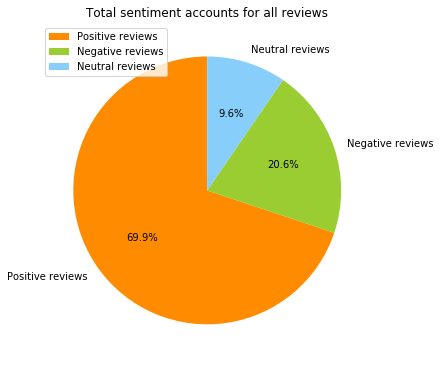

In [433]:
plt.figure(figsize=(6,9))
labels = [u'Positive reviews',u'Negative reviews',u'Neutral reviews']
sizes = [len(Pos_text),len(Neg_text),len(Neu_text)]
colors = ['darkorange','yellowgreen','lightskyblue']
patches,l_text,p_text = plt.pie(sizes,labels=labels,colors=colors,
                                labeldistance = 1.1,autopct = '%3.1f%%',shadow = False,
                                startangle = 90,pctdistance = 0.6)
plt.title('Total sentiment accounts for all reviews')
plt.legend()
plt.show()

**We use the quantity of the positive sentiment according to the vote_up value and the  estimation for positive sentiment, we can calculate the accuracy. Maybe because of the introduction of the more professional algorithm - vader, we can find that the accuracy has a great improvement.**

**From the chart, we can find that the positive reviews take most account of total review(70.5%), negative reviews take about 20% percentage(19.9%) of the total reviews, and the neutral reviews take least account of total reviews(9.7%). The situation could basically match the reality, because most players would write a review after they won or lost. At that time, most people will write a review in positive emotions (most are winners) and negative emotions (most are losers).**

### In addition, in order to know more specifically about the effectiveness, we need to know the account of three types of people according to the total play-time, because some people who play more time just due to the interest of the game, in that case, their review could more trusty.

## Part1(First one third of reviews from more play-time players):

In [434]:
Pos_text1 = []
Neg_text1 = []
Neu_text1 = []
for sentence in s1:
    print(sentence)
    ss = sid.polarity_scores(sentence)
    for k in sorted(ss):
        print('{0}: {1}, '.format(k, ss[k]))
    if(ss['compound'] >= 0.0):
        if(ss['compound'] > 0.0):
            Pos_text1.append(sentence)
        else:
            Neu_text1.append(sentence)
    else:
        Neg_text1.append(sentence)

An extremely stable game, hasn't crashed after >2500 hrs of playtime.
compound: 0.3597, 
neg: 0.0, 
neu: 0.8, 
pos: 0.2, 
descent total war game...cheaped out on the video cut scenes, but they've been doing that for years.
compound: -0.4588, 
neg: 0.211, 
neu: 0.789, 
pos: 0.0, 
The added mechanics make the game even more immersive. And this for an era and place that I know nothing about. I'm glad to see CA back in the historical strategy business. I also enjoy the characters in romance mode-something from the Warhammer games which I hope to see more of in future Total War
games.
compound: 0.5139, 
neg: 0.1, 
neu: 0.749, 
pos: 0.151, 
Three kingdoms total war saga i believe has revolutionized Creative assemblies video games. Now they seem to continue its new generations of games creating Troy total war coming 2020, definitely excited to see whats next in their legacy. I recommend this game and almost all of their previous games to all who like strategy games.
compound: 0.6597, 
neg: 0.

neu: 0.652, 
pos: 0.199, 
    A review after having played for 175 hours as a native culture background player:

    Overall:9.2/10

    Art: .9.5/10      
    Music: 9.8/10
    Strategy: 9/10
    Gameplay 9/10   
    
      
     Pros: Beautiful and precisely accurate design of art, fascinating background music and sound effect, attractive game system, and great experience in a war battle.
     Cons: Lacking portraiture in contrast with other games with the same kind, and the 3D models of them don't fit their portrait, and more they look ugly to some extent.   The gender for Da Qiao and Xiao Qiao is wrong, they are famous for their beauty in the Three Kingdoms period, but in the game, they are male and look lame. In addition, Chinese people do not look like the appearance in the game, it fell a little weird, for this part please find references from Koei game.  In the end , the game is getting a little boring as you enter the late game, for there are a massive cities to management and

neg: 0.0, 
neu: 0.109, 
pos: 0.891, 
Its cool

AI is still broken tho
compound: -0.2023, 
neg: 0.298, 
neu: 0.481, 
pos: 0.221, 
one of the best RTS games i ever played, coming from a Red Alert 2 veteran/Generals/C&C,Age Of Empires, Age of Mythology... Battle realms...
compound: 0.7351, 
neg: 0.095, 
neu: 0.584, 
pos: 0.321, 
Absolutely amazing game. I have been playing Total War since Medieval 1 and I can say this is the most refreshingly new take on the series that I have played in a long time. Cannot recommend enough, I think this game has something to offer for both fans of the older, historical games as well as those that are fans of the Warhammer series. Top notch, and well done!
compound: 0.7632, 
neg: 0.08, 
neu: 0.728, 
pos: 0.193, 
Three Kingdoms Alteration Simulator

you know it when you see many characters in different factions
(Especially you, Sima Yi)
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Do you recommend this game? Yes
compound: 0.6369, 
neg: 0.0, 
neu: 0.435,

compound: 0.9686, 
neg: 0.081, 
neu: 0.648, 
pos: 0.271, 
The most engaging Total War game yet. I hope they do a European version- That would be epic.
compound: 0.1102, 
neg: 0.183, 
neu: 0.571, 
pos: 0.246, 
Good game but i would like the workshop now so i can get some of those good mods. What annoys me is the vanilla units and generals looks and i'm sure people will mod that and make the factions/characters more unique.

Improvements to this game could be the vassals, it annoys me that they can drag you into wars. They shouldn't have any say in wars. Also where are the achievements for winning with each faction. Its a small detail but i enjoyed going through Rome 2 ticking off the different faction.

 Its a great game in the series and i do think there are many improvements to be made but im happy they are addressing them from what i heard.

Buy this game now if you must play it or wait a few months or a year for a better version of the game.
compound: 0.9787, 
neg: 0.108, 
neu: 0.64

compound: -0.9468, 
neg: 0.101, 
neu: 0.829, 
pos: 0.07, 
this is a great game!!

compound: 0.6892, 
neg: 0.0, 
neu: 0.39, 
pos: 0.61, 
my girlfriend disapproves
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
It's ok
compound: 0.296, 
neg: 0.0, 
neu: 0.312, 
pos: 0.688, 
I'm playing non stop since launch. You should get it if you like TW serires :)
compound: 0.6249, 
neg: 0.102, 
neu: 0.558, 
pos: 0.34, 
it's amazing game, just when you lose hope when throne of britonia is out, it proved as long as CA wanted, they can still deliever a good game.
compound: 0.7845, 
neg: 0.076, 
neu: 0.652, 
pos: 0.272, 
The best TW game ever!
compound: 0.6696, 
neg: 0.0, 
neu: 0.471, 
pos: 0.529, 
By far the best TW experience on Launch that I have ever experienced. Ever. I say this having played since Shogun 1.

This is purely amazing and appeals to fantastical and strategic players.
compound: 0.9286, 
neg: 0.0, 
neu: 0.664, 
pos: 0.336, 
liked the replay ability

compound: 0.6249, 
neg: 0.0, 
neu: 0

compound: -0.6151, 
neg: 0.127, 
neu: 0.772, 
pos: 0.101, 
yes yes yes
compound: 0.7964, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
good game
compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
6/5
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
What an amazing game. I was not even interested in this time period, but I am in love with this game.
compound: 0.8211, 
neg: 0.063, 
neu: 0.619, 
pos: 0.317, 
best total war game since shogun 2
compound: 0.0772, 
neg: 0.322, 
neu: 0.331, 
pos: 0.347, 
Enjoyable.Immersive
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
---{Graphics}---
☐ You forget what reality is
☑ Beautiful
☐ Good
☐ Decent
☐ Bad

---{Gameplay}---
☑ Very good
☐ Good
☐ It‘s just gameplay
☐ Bad

---{Audio}---
☐ Eargasm
☑ Very good
☐ Good
☐ Not too bad
☐ Bad

---{Audience}---
☐ Kids
☑ Teens
☑ Adults

---{PC Requirements}---
☐ Check if you can run paint
☐ Potato
☐ Decent
☑ Fast
☐ Very Fast

---{Difficulity}---
☐ Just press ‚A‘
☐ Easy
☐ Significant brain usage
☐ Easy to learn / Hard t

compound: 0.981, 
neg: 0.084, 
neu: 0.775, 
pos: 0.141, 
Easily my favorite Total War game in the series.
compound: 0.128, 
neg: 0.255, 
neu: 0.392, 
pos: 0.353, 
If you like strategy and good battle play, buy this.
If you like Romance of the Three Kingdoms and need something aside from Koei's, buy this.
If you like tedious micro managing and controlling every single unit/general/move, buy this.
If you like long campaign where everyone (maybe except Liu Bei) is secretly out for your blood, buy this.
If you like to pretend that you rewrite history of conquering the impossible, buy Yellow Turban DLC (lol) and this.
If you are still reading, you probably ain't tempted to buy it enough but still, buy it :D
compound: 0.9354, 
neg: 0.028, 
neu: 0.785, 
pos: 0.187, 
Sun Tzu once said:

"If you know the enemy and know yourself, you need not fear the result of a hundred battles.
If you know yourself, but not the enemy, for every victory gained you will also suffer a defeat.
If you know neither 

compound: 0.9558, 
neg: 0.13, 
neu: 0.72, 
pos: 0.15, 
The apex of Creative Assembly's ambitions! Perhaps the least anticipated, most surprising, and simply greatest work of art they have produced yet. Consider this customer (a fan since the ago of 8 with the original Shogun TW) loyal and committed to your product line, questionable DLC policies aside.
compound: 0.9467, 
neg: 0.036, 
neu: 0.642, 
pos: 0.322, 
As much as I love the warhammer titles no total war game has really hit the perfect sweet spot for me since shogun 2, but this game delivers. I am having an absolute blast with it
compound: 0.4646, 
neg: 0.101, 
neu: 0.723, 
pos: 0.176, 
Noice
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
A very good addition to the franchise.
compound: 0.4927, 
neg: 0.0, 
neu: 0.61, 
pos: 0.39, 
F@u@c@@ki@ng as@s@ho@le sh@itt@@y crashed tech tree
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
awesome!!!!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Absolutely great game. 
All the new dip

compound: -0.1877, 
neg: 0.138, 
neu: 0.738, 
pos: 0.124, 
One of the best games i have ever played
compound: 0.765, 
neg: 0.0, 
neu: 0.476, 
pos: 0.524, 
needs work but great total war trust me own them all
compound: 0.6956, 
neg: 0.228, 
neu: 0.341, 
pos: 0.431, 
I have been playing Attila and Shogun 2, and not Warhammer. So for me, it takes a while to get use to the new setup. But I love every minute of playing it. I find it weird how you can only build one building only per district you control. Maybe there might be a update patch.
compound: 0.7269, 
neg: 0.03, 
neu: 0.832, 
pos: 0.138, 
A nice in between from Dynasty Warriors and Romance of the Three Kingdoms.  Fans of those series will also like this.  It's the only Total War game I've played, but I really enjoyed it.  It lacks a character creator and you're handcuffed to very few scenarios, but you can still get a good amount of play out of it.
compound: 0.9436, 
neg: 0.036, 
neu: 0.682, 
pos: 0.283, 
One of the best Total War g

compound: 0.4114, 
neg: 0.0, 
neu: 0.706, 
pos: 0.294, 
love this game
compound: 0.6369, 
neg: 0.0, 
neu: 0.323, 
pos: 0.677, 
I have played every Total War game since the first one hit the shelves.  This, by far, is my favorite.  

The game itself is beautiful.  I love the art style.  Everything from the units to the tech tree has a unique look.  

Its fun to play.  I have played a few hours of just about every faction (think I have a couple to go) and they all seem fairly balanced.  Even the ones that start in the "very hard" areas are fun to play, though it might take you a few reloads to figure out what makes them very hard.  

My favorite feature is the general duels on the battlefield. Such an awesome addition.  

Buy it, play it, you will like it.
compound: 0.9825, 
neg: 0.068, 
neu: 0.664, 
pos: 0.269, 
very good. Quality is on par with other Total war titles.
compound: -0.1796, 
neg: 0.242, 
neu: 0.559, 
pos: 0.198, 
Great game and new style of total war!
compound: 0.126, 
neg

compound: 0.8443, 
neg: 0.121, 
neu: 0.684, 
pos: 0.195, 
great compain have its own problems but very good one but multiplayer is my jem and its bullshit here its soooo brooken that nobody deserve this lvl of shitfest ,in ranked game max generals is six you know what but i can bring 6 of them and everyone of them have ability to insta Rout enemy forces and wheres my avatar conquest ,shogun 2 i miss you soo mach.

but only for the compain that i spend more the 100 hours this game deseves my upvote
compound: -0.6008, 
neg: 0.141, 
neu: 0.759, 
pos: 0.1, 
This is the first Total War game that I really dived into and it's great. I was really impressed with the economy and diplomacy aspects of the game. When most people think of TW games they probably think of the sick battles.

This game also does an impressive job at telling the story of the Three Kingdoms and including the most famous characters and some of the events. There is a lot of historical flavor like using the Wu Xing as basis 

compound: 0.2023, 
neg: 0.079, 
neu: 0.806, 
pos: 0.115, 
One of the best TW game since Shogun 2

Pros:
-The campaign and battle maps are very beautiful
-The characters add interesting gameplay 
-The diplomacy is the deepest ever in the history of TW

Cons:
-Each battle play out the same
-Battle AI are as bad as ever
compound: 0.4927, 
neg: 0.177, 
neu: 0.611, 
pos: 0.212, 
Having played over 1000 hours combined on total war games, this is by far the best creation from CA.
compound: 0.5859, 
neg: 0.141, 
neu: 0.543, 
pos: 0.315, 
Best deplomecy and trade system I have experenced yet, battles are what you can expect from total war. All together a great Strat game

compound: 0.4215, 
neg: 0.198, 
neu: 0.549, 
pos: 0.253, 
Best Total War launch. The CA created a masterpiece imo. I'm adoring this game.
compound: 0.875, 
neg: 0.151, 
neu: 0.31, 
pos: 0.539, 
Yuan Shao is tooooo Strong!!
compound: 0.5972, 
neg: 0.0, 
neu: 0.507, 
pos: 0.493, 
basically the general in romance mood is still un

neg: 0.211, 
neu: 0.433, 
pos: 0.357, 
Even better with the Blood Pack.
compound: 0.4404, 
neg: 0.0, 
neu: 0.633, 
pos: 0.367, 
This game is super fun! By far my favorite total war title besides Shogun 2. It is totally different from the other total war games, but the difference is refreshing. I love the Romance mode and it's emphasis on characters. I hope the future patches make legendary Heroes look more unique. I was playing the historical battles and Lu Meng was just an ordinary vanguard. Also Diao Chan looks like an ordinary strategist, she's suppose to be a fire looking piece of dime bae. I hope in the future they have a whole fleshed out roster of legendary heroes. I would also love to see more woman characters like Yue Ying, Da Qiao, and Xiao Qiao. I was so sad when I was playing as the Wu faction I couldn't make Sun Ce and Zhou Yu marry Da Qiao and Xiao Qiao :( I also wish that there were more unit diversity and more unit types between different regions and factions. China is 

compound: 0.9826, 
neg: 0.101, 
neu: 0.724, 
pos: 0.175, 
One of the best Total War games, nice art and environments, great fights, interesting heroes, good diplomatic options
compound: 0.9246, 
neg: 0.18, 
neu: 0.273, 
pos: 0.546, 
my life is now this game. loving it!
compound: 0.636, 
neg: 0.0, 
neu: 0.625, 
pos: 0.375, 
Surely among the best entries in the Total War franchise!
compound: 0.5411, 
neg: 0.213, 
neu: 0.383, 
pos: 0.404, 
Great game. Great optimization better than other total wars. sad that the workshop isn't out dlcs are beautiful and i love it.
compound: 0.9442, 
neg: 0.161, 
neu: 0.313, 
pos: 0.525, 
Worth the wait. Amazing game
compound: 0.6908, 
neg: 0.0, 
neu: 0.345, 
pos: 0.655, 
A total war game with a much stronger emphasis on diplomacy. Also romance mode is like a mix between old total war games and total war warhammer.
compound: -0.6124, 
neg: 0.305, 
neu: 0.469, 
pos: 0.227, 
its good
compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
This game is a drea

compound: 0.7911, 
neg: 0.102, 
neu: 0.784, 
pos: 0.114, 
What can i say, should i mention the improvement within the AI compared to other totalwar games( still exploitable though), the much easier to understand interactions with the npc factions, the beautifull landscapes, the really dumb but really cool general 1 on 1 duel system.

Its all great in my opinion (not perfect though could use improvements in some areas the story events though fun is kind of my biggest gripe with the game(an example would be when liu bei when tai qing dies you get his land but when playing anyone else when tai qing dies it still remains as a seperate faction))
compound: 0.9783, 
neg: 0.019, 
neu: 0.751, 
pos: 0.23, 
LOVE IT
compound: 0.6369, 
neg: 0.0, 
neu: 0.192, 
pos: 0.808, 
Just bought the game. first launching seems an amazing game. Fantastic graphic and love the details of the game.
compound: 0.9118, 
neg: 0.0, 
neu: 0.58, 
pos: 0.42, 
Very fun game. Makes me feel like shogun did. Some complaints h

compound: 0.9909, 
neg: 0.016, 
neu: 0.822, 
pos: 0.162, 
I found it amusing that the developer think they have the right to teach players to play a game in a morally correct way. CA should be ashamed for yourself to try to establish yourself as some sort of judging institution that eliminates freedom. CA, political correctness is destroying your creativity and become a shield of cowardness to protect your fragile sense of presence. You are not court, nor Jesus.
compound: 0.7717, 
neg: 0.084, 
neu: 0.737, 
pos: 0.18, 
You know when you've been burned by a developer before (Thrones of Britannia)? I took a gamble on this and pre-ordered purely for Dynasty Warriors nostalgia. Safe to say though, absolutely not disappointed.

8/10
compound: 0.6939, 
neg: 0.0, 
neu: 0.835, 
pos: 0.165, 
I started from Rome (the first one, not the disaster that is Rome 2). I played every single Total War from then (perhaps over 8 thousands hour of gameplay accumulated).

I was extremely sceptical about 3 kin

compound: -0.8057, 
neg: 0.476, 
neu: 0.524, 
pos: 0.0, 
Much more fun than warhammer, better diplomacy, graphics, and optimized performance.
compound: 0.8588, 
neg: 0.0, 
neu: 0.457, 
pos: 0.543, 
Updated as of 8Princes:

Probably the best Total War so far in the historical line. Even compared to TW:Warhammer series, this is probably better.

Right away, you can pick if you want a historical approach (Records option) which has generals perform as traditional TW generals, or a TW:Warhammer (Romance) approach, where generals are the second coming of Grimgor and Archaeon. So, that's nice to have, because it means you can make the experience closer to the TW:W style or the historical style.

Beyond that, there are plenty of abilities, general types, and units in terms of variety.

So, it's light-years better than the last historical game (ToB, which is a 'saga', but still).

In fact, I only have a few small complaints at all, really, and they are inter-related:

#1 - Unit availability is 

compound: 0.9578, 
neg: 0.0, 
neu: 0.698, 
pos: 0.302, 
Very fun game especially if you are a Romance of  the Three Kingdoms fan (like myself).  I've never super got into Total War games (they were ok for me and mainly played Shogun 2 of them all) but the world has immersed me and I've spent many hours in the game.

My only complaints are random crashes (seems worst when selecting a faction in new game) and little quality of life things they could improve (for example having to go through all your troops to reequip better weapons, armor etc... a screen know what all was equipped for each would be nice).
compound: -0.5149, 
neg: 0.145, 
neu: 0.712, 
pos: 0.143, 
First allow me to say that this game is no where as bad as the fans are saying with their negative review.
Yes CA is making many mistakes, and the actions of a few are reflecting badly on what can be a perfect game, yet its nowhere near great.

The game is set in China, so don't expect more land than china, or more troops types 

pos: 0.115, 
First Total War game where it seems like diplomacy actually matters. Every faction creates strong coalitions, every faction creates meaningful vassals, every faction actually has a grasp on what their value is and plays accordingly.

Weaker armies will not try to besiege meaningless settlements from the player just for the sake of being annoying like in previous total war titles. From what i have seen so far enemies wont attempt to just try to win meaningless battles like before instead they have more focus on winning the entire war instead. Which makes it much more appealing to go to war with enemy factions (especially smaller, weaker ones). Instead of them just going for small skirmishes around your borders they will actually try to capture something meaningful or just go straight for your armies if they think they can beat them. This lets you leave your borders a lot less defended without having some weaker faction sit there and besiege all your little settlements for n

compound: 0.8548, 
neg: 0.061, 
neu: 0.757, 
pos: 0.181, 
I am TW and Three kingdoms fan. 9.5/10 to me.

Pros:
Everything you expect from TW with improvement

Cons:
Need more details in events and warriors‘ profile picture
compound: 0.6486, 
neg: 0.0, 
neu: 0.825, 
pos: 0.175, 
tl;dr - Another Total War title. This one runs great and is pretty damn fun

*side note* - ranked battle is in desperate need of some balancing. Xu Chu's passive stacks and unlimited ranged buffs/debuffs is pretty stupid (see: Sima Yi)

https://youtu.be/AKPNyzyL76Y

pros
- three kingdoms era
- game runs fantastic (graphics wise)
- romance mode is awesome

cons
- ranked matches get "stuck" and you have to force close the game
- some connection lag with multiplayer battles
compound: 0.8402, 
neg: 0.192, 
neu: 0.549, 
pos: 0.259, 
Kong Rong the Merchant Prince of the East, A++, would get exploited again
compound: -0.4588, 
neg: 0.2, 
neu: 0.8, 
pos: 0.0, 
Three kingdoms is a refreshing and polished total war game a

compound: 0.9442, 
neg: 0.109, 
neu: 0.653, 
pos: 0.237, 
It's Total War with way better diplomacy
compound: -0.25, 
neg: 0.331, 
neu: 0.424, 
pos: 0.246, 
Good game
compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
The first Total war game i was actually consistently entertained enough to finish it instead of going halfway and stopping playthroughs.
Kong Rong FTW
compound: 0.2342, 
neg: 0.178, 
neu: 0.614, 
pos: 0.208, 
There are flaws, as with all games, but I haven't had this much fun and been so eager to find time to play a release game since I was still in school and had all day to game. Genuinely one of the best releases for years from CA, and I hope that future DLC's and packages only add more polish to this great game. Runs like a dream compared to WHII and Attila.
compound: 0.9892, 
neg: 0.0, 
neu: 0.637, 
pos: 0.363, 
It's meh. I like that the campaign is fleshed out and there is allot of options to engage in diplomacy. However, because of the setting I find it hard to 

pos: 0.153, 
One of the better TW games. But not close to Empire and Napoleon. Still waiting for a true remake of those, without the CTD
compound: 0.6908, 
neg: 0.0, 
neu: 0.787, 
pos: 0.213, 
This game is amazing! whether your are looking for a historically accurate game to simulate the battles of a divided China or just looking for a different Civ like experience, this is the perfect game for you.
compound: 0.8268, 
neg: 0.061, 
neu: 0.699, 
pos: 0.24, 
A well made and interesting total war game. It will improve overtime when a few things are fixed. I hope they have some good DLC coming however because it lacks in diversity of units. I'm approaching the end of my second campaign and don't really feel like making another one. 

Also the balance of units is kind of off against the AI with archers being so freaking good its ridiculous. My archers always just melt the AI unit. The AI is not very good at defending its archers so it's mostly the player that will benefit from these. Their o

compound: -0.9792, 
neg: 0.223, 
neu: 0.708, 
pos: 0.069, 
Arch Warhammer is an idiot. Anyone who defends his petty rhetoric is just as bad. People review bombing this game are even worse. This game is fantastic. The gameplay is fun and engrossing and the storylines follow 3 kingdoms lore pretty accurately. 

It's entirely pathetic that this game would have to have review bombs because some sad little children had their boy dissed for being a pr*ck.
compound: -0.8268, 
neg: 0.221, 
neu: 0.66, 
pos: 0.119, 
I've played just about all Total war games. I enjoy them all. Total war three kingdoms is a fresh take with romance settings that produces a more hero-based warfare that offers to me at least, more RPG elements to the game which just makes you care more for your generals both in a battle and outside of it. 

This game and Warhammer 2 lands as the best standing Total war games i've ever played.
compound: 0.5456, 
neg: 0.176, 
neu: 0.6, 
pos: 0.224, 
One of the best game from the Total

neu: 0.0, 
pos: 1.0, 
Absolutly love this game.
compound: 0.6369, 
neg: 0.0, 
neu: 0.417, 
pos: 0.583, 
first total war game AND grand strategy game i've ever played. 

my first 5-8 hours: ????????????????????????????????????????????????????????????

hours 10+: ooooh ok i get it now i like this

love the game is good is good
compound: 0.9514, 
neg: 0.078, 
neu: 0.482, 
pos: 0.439, 
Solid entry into the Total War franchise.
compound: -0.5106, 
neg: 0.371, 
neu: 0.476, 
pos: 0.152, 
Best Total War game mechanic
compound: 0.0772, 
neg: 0.351, 
neu: 0.27, 
pos: 0.378, 
nice

compound: 0.4215, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
BEEN PLAYING SINCE THE FIRST SHOGUN!!!!!!! WOW!!!!!! So far in my opinion you guys have redeemed yourselves, finally!!!!!!!! Finally listened to the REAL FANS!!!!!!!!!!!!!! BRAVO!!!!!!!!!!!!!!!!!! Just beautiful!!!!! Ive put 2600 plus hours in (Heavily modified) Rome 2 Lets see what kind of dent i can put in this:)))))))))))
compound: 0.7185, 
neg: 0.0, 
neu: 0.88, 
p

In [435]:
print("The quantity of positive sentiment is",len(Pos_text1))
print("The quantity of neutral sentiment is",len(Neu_text1))
print("The quantity of negative sentiment is",len(Neg_text1))

The quantity of positive sentiment is 2365
The quantity of neutral sentiment is 308
The quantity of negative sentiment is 585


<Figure size 432x648 with 0 Axes>

Text(0.5, 1.0, 'Total sentiment analysis for the first one-third reviews of long-playtime users')

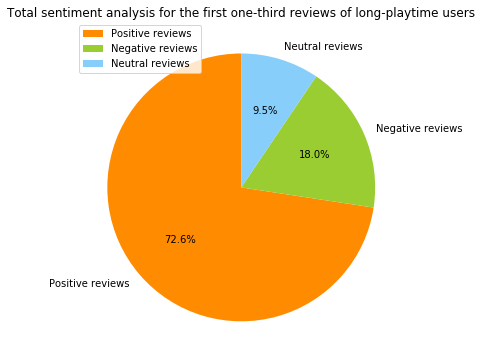

In [436]:

plt.figure(figsize=(6,9))
labels = [u'Positive reviews',u'Negative reviews',u'Neutral reviews']
sizes = [len(Pos_text1),len(Neg_text1),len(Neu_text1)]
colors = ['darkorange','yellowgreen','lightskyblue']
patches,l_text,p_text = plt.pie(sizes,labels=labels,colors=colors,
                                labeldistance = 1.1,autopct = '%3.1f%%',shadow = False,
                                startangle = 90,pctdistance = 0.6)
plt.title('Total sentiment analysis for the first one-third reviews of long-playtime users',va = 'top')
plt.legend()
plt.show()

**From the chart, we can find that the account is similar to the total situation. Positive reviews take more account and negative reviews take less account. Neutral reviews account is nearly that in total reviews. Here are some slight differences. That verified the opinion just now that who play more time for the games would write better review.**

### Part 2( Second one third of the reviews from median play-time players):

In [437]:
Pos_text2 = []
Neg_text2 = []
Neu_text2 = []
for sentence in s2:
    print(sentence)
    ss = sid.polarity_scores(sentence)
    for k in sorted(ss):
        print('{0}: {1}, '.format(k, ss[k]))
    if(ss['compound'] >= 0.0):
        if(ss['compound'] > 0.0):
            Pos_text2.append(sentence)
        else:
            Neu_text2.append(sentence)
    else:
        Neg_text2.append(sentence)

Diplomacy is the best it has ever been, the duel system is very fun and i love the overall stories you can create in this huge sandbox as i have been a huge fan of Total War Warhammer's whole hero system with inventories and items & skills. This is worth the buy and is a solid Total War and Strategy game. My fourth favorite out of the whole series.
compound: 0.9664, 
neg: 0.087, 
neu: 0.566, 
pos: 0.348, 
Cao Cao  approves.
compound: 0.4019, 
neg: 0.0, 
neu: 0.426, 
pos: 0.574, 
Didn't enjoy it as much as warhammer 2, but still a good game.
compound: 0.4653, 
neg: 0.116, 
neu: 0.638, 
pos: 0.246, 
+ Performance.
+ To many new features.
- Good diplomacy system but it broken now.
- Graphic really bad.
compound: -0.8552, 
neg: 0.401, 
neu: 0.515, 
pos: 0.084, 

best duel game 

compound: 0.6369, 
neg: 0.0, 
neu: 0.323, 
pos: 0.677, 
I killed Zheng Jiang's sister, recruited her as a general, adopted her as my daughter and then I married her off to Lu Bu's heir and then I vassalized Lu Bu's

neu: 0.396, 
pos: 0.324, 
Great game
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
This is my favorite historical Total War game to do. I hits all the highs of Shogun 2 alongside a slew of improvements, the best diplomacy in Total War to date and a great take on heroes. The battles lack some of the epic scale and cinematic flair of Warhammer 2 but I'm not sure a historical game could.
compound: 0.0405, 
neg: 0.167, 
neu: 0.664, 
pos: 0.169, 
Total War 3K is the total package. It is a great blend of Romance of The Three Kingdoms, Dynasty Warriors, and Total War. It is an accurate portrayal of the Three Kingdoms Era of China. Most importantly, it is an excellent representation of the Total War Franchise, and my favorite of the series since the first Rome installment, or the second Medieval installment. 

If you’re deeply interested in ancient China, like myself, you can play the “Romance” version of the campaign to fully enjoy all the added elements of politics, family, and his

compound: 0.9751, 
neg: 0.0, 
neu: 0.646, 
pos: 0.354, 
Great game, CA did an excellent job of tuning in on what the players enjoy
compound: 0.9001, 
neg: 0.0, 
neu: 0.522, 
pos: 0.478, 
Most polished Total War game yet. If you're curious romance mode is basically a more polished, less magic historical warhammer

compound: 0.1868, 
neg: 0.16, 
neu: 0.614, 
pos: 0.226, 
This is definitely not a reskin.
This is a proper TW game with so much depth it will actually force you to learn a whole new structure of things.
Great game. Really enjoying it!
Well Done TW
compound: 0.9209, 
neg: 0.0, 
neu: 0.695, 
pos: 0.305, 
This game is awesome
must buy for TW fans !
compound: 0.6588, 
neg: 0.0, 
neu: 0.646, 
pos: 0.354, 
The translation for Cao Cao's poem is awesome! Good job, keep going.
compound: 0.807, 
neg: 0.0, 
neu: 0.578, 
pos: 0.422, 
Very cool thanks dad.
compound: 0.6976, 
neg: 0.0, 
neu: 0.257, 
pos: 0.743, 
This game is great. It is more difficult than Total War Warhammer II. Has great

neg: 0.0, 
neu: 0.67, 
pos: 0.33, 
Dank game 10/10 would speak Chineese again
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Nothing compares to the first Total War: Rome but this one is OKAY. The readability of who your enemy and friend is is a little difficult and since all the banners are in Chinese, many of them look similar. Same thing with the characters names. Pretty easy to mistake them for another. I really wish Total War games would take these single acting generals out that have "powers" or abilities to make your units retreat, become slower, etc... That's just dumb. Overall, I would give the game a 4/10.
compound: 0.1726, 
neg: 0.192, 
neu: 0.603, 
pos: 0.206, 
Awesome addition to the TW franchise. It’s a nice change of pace from Warhammer and it runs really well even on older systems. Great UI, gfx and really well optimised. Go CA! :)

If you like other TW historical titles don’t miss this one, getting the same feels as when Shogun 2 came out.
compound: 0.9718, 
neg: 0.0

compound: 0.0772, 
neg: 0.351, 
neu: 0.27, 
pos: 0.378, 
best total war to date no cap
compound: -0.2263, 
neg: 0.427, 
neu: 0.28, 
pos: 0.294, 
As a player of every single Total War minus Britannia, I can sincerely say that this game has been extremely enjoyable and is befitting to be the next game in the saga. So far, each segment of the game has had slightly different gameplay with the armies getting better through both the characters leading them and the quality of the troops in each, and the diplomatic field changing with alliances forming followed by large wars beginning between each. Diplomacy feels good this time, with a clear explanation of the reasons a deal will go through or not. Tactics are important with a clear reason to fight battles yourself, rather than delegating it to the AI. The economics work well, with the fight between maintaining food or a healthy income weighing on each decision. Overall, I am not quite sure how I have played over two days of this game, but I 

compound: 0.9937, 
neg: 0.126, 
neu: 0.684, 
pos: 0.19, 
This is my first time to play Total War games，so it's just a beginner's view . 
the policy tree is amazing.it's really really a Tree.Beautiful
the portraits are COOL[spoiler] (love Sun Ren)[/spoiler]，though the number is NOT enough（well...dlc）

then the problems...

1. If one side retreats during a fight, it will move some distance, which will prevent the other side from catching up during the round. So the two sides could not fight but only play “catch me if u can” all the time. i  hope this mechanism will improve.
And the time for each round is too long. FIVE rounds= ONE year！！！The march distance is too short by comparison.

2. The recruitment system is a mess. I am LiuBei and I'm able to recruit CaoZhi after killing CaoCao for two years. What's going on man？？？it was ur FATHER.....
And having children is a little difficult... There is also some confusion about succession. Why is it that after SunJian's death, the successor is M

compound: 0.9863, 
neg: 0.035, 
neu: 0.805, 
pos: 0.16, 
Good
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Start a game as Cao Cao.
Offer Vassalization with Guarantee of Autonomy to end a war with a well-landed rival who is starting to lose.
They accept.
Instantly slam that Annex option so hard it causes three wars.
Win all the wars, rule half of China.

Cao Cao / 10, best game 2019
compound: -0.6875, 
neg: 0.261, 
neu: 0.558, 
pos: 0.18, 
so good

compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
One of the best TW entries in the series although Warhammer is still unique with lots of unit diversity, this one takes the franchise into a new direction. Excellent visuals, balanced gameplay, lots of stuff to do and think about, and good old fun. Love the characters, the richness ,the diplomacy so far I am having a ton of fun.
compound: 0.9771, 
neg: 0.0, 
neu: 0.668, 
pos: 0.332, 
First total war game, and im pretty taken aback by how fun it is. If civ is considered the "one m

compound: 0.9439, 
neg: 0.079, 
neu: 0.789, 
pos: 0.132, 
Great game for those interested in the period and the story.
compound: 0.7783, 
neg: 0.0, 
neu: 0.57, 
pos: 0.43, 
10/10 BEST TOTAL WAR EVER
compound: 0.0772, 
neg: 0.369, 
neu: 0.239, 
pos: 0.393, 
I did not pursue Lü Bü 11/10
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Total war come back this time with full force. This game mix everything that works on the previous titles and expands the game with the new generals feature.
compound: -0.5423, 
neg: 0.125, 
neu: 0.831, 
pos: 0.045, 
Nice game

compound: 0.4215, 
neg: 0.0, 
neu: 0.263, 
pos: 0.737, 
its eh goode game
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The most polished Total War game to date
compound: -0.6326, 
neg: 0.373, 
neu: 0.627, 
pos: 0.0, 
The latest installment in the Total War series is a beautiful game that is pretty much a delight to play, though it might offer a bit more of a challenge than previous games in the series; not that it is very hard, b

pos: 0.815, 
Pretty Epic
compound: 0.4939, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
Im here to counter the negative reviews that have been pouring in recently over a few things not related to the product itself.
Do i like the game? Yes.
Is it a good and fresh take on the series? Yes.
Will dlcs later flesh the game out? Probably Yes. It would be silly for CA not to expand upon this most profitable game in the series.

The game brings new life to the Total War gameplay but putting the focus on having generals be borderline gods. At first it sounds dumb and silly, but the game really does it well, so much so that i would argue that playing it this way is the definite way to play the game, in my own humble opinion that is.
It simply fits.

If this is your first game in the Total War series then check it out on youtube first to see if its something you might enjoy.
If you are used to the series get the game during a sale or whenever.
I preordered the game and i feel it was worth the money.
If 

pos: 0.332, 
Awesome. Great game! 

Do wish they gave you more factions and more starting map options. 

The whole bottom of the map is empty which means Wu always takes that free territory. 

I really enjoy how Romance of the three kingdoms lets you play as anyone you want, and gives you multiple starting map options. 

Those are minor complaints to a great and amazing game. My favorite total war series to date and I've pretty much played them all since Medievial
compound: 0.9869, 
neg: 0.075, 
neu: 0.551, 
pos: 0.374, 
If you like both Dynasty Warrior and Total War, you will definitely love this game. You can run the same campaign multiple time and each time it will surprise you. Some of the AI faction can screw you so bad that it make you curse the screen. The diplomacy and the AI interaction works differently compare to other Total War game. The battle works similarly with other Total War series with a feel of mix between Rome and Warhammer.
That is all for the pros, for the cons..

compound: 0.9935, 
neg: 0.052, 
neu: 0.661, 
pos: 0.287, 
Bow down to your new overlord Yuan Shao the Vassalizer
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
A really good Total War game 

Xièxiè
compound: -0.2431, 
neg: 0.367, 
neu: 0.352, 
pos: 0.281, 
Completed campaign only doing around five battles. Diplomacy is all you need. Too easy, no reply value.
compound: 0.128, 
neg: 0.208, 
neu: 0.563, 
pos: 0.229, 
Haven't had this much fun on a total war game since Shogun 2
compound: -0.1531, 
neg: 0.241, 
neu: 0.556, 
pos: 0.204, 
i am having some trouble with the game. when i play my battles there are flashes around may units and in the sky. i have recently installed a new graphics card and re installed the game but the problem continues. can anyone help me
compound: -0.2382, 
neg: 0.152, 
neu: 0.738, 
pos: 0.111, 
great game, can fight entire armies with one man, 10/10
compound: 0.3612, 
neg: 0.177, 
neu: 0.544, 
pos: 0.279, 
Pros :
- Very good diplomatic system, much better than 

neu: 0.82, 
pos: 0.155, 
Probably best game in the series.
compound: 0.6369, 
neg: 0.0, 
neu: 0.543, 
pos: 0.457, 
One of the best, if not the best TW game.  The campaing map now feels a lot more enjoyable than ever before thanks to the expanded diplomacy and spies. The only bad thing I see is the lack of unit variety in some classes but once workshop is released that will be solved by mods.
compound: 0.7904, 
neg: 0.063, 
neu: 0.744, 
pos: 0.193, 
A great game.  I love the 3 Kingdoms lore and this nails it pretty well.  Most importantly you can play this as a historical game without the hero mechanics.
compound: 0.94, 
neg: 0.074, 
neu: 0.456, 
pos: 0.471, 
A great addition to a great franchise. Played around 4 hours or so and the game has been amazing, if not the best total war to date. I have been playing the total war franchise since Rome: Total War and a dedicated fan ever since. Having the option for both a Romance and Records mode is a fantastic idea and was greatly executed. 



neg: 0.165, 
neu: 0.593, 
pos: 0.242, 
三国演义
三让徐州
三顾茅庐
三火破曹
三气周瑜
三分天下

TW3K... ahhhh...
三连射精

Zhuge Liang tribute rap:
https://www.youtube.com/watch?v=kZvAmADnSWI
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
TW Three Kingdoms seems to be an improvement on the Total War series. 

The graphics both look beautiful and the visual engine seems to make better use of computer resources compared to Warhammer 1/2 or Rome/Attila.  A computer that could run Warhammer at better-than-potato settings should be able to run 3K on equal or better settings.

The Battle AI seems a bit more capable as well.  It will actually do more than just form a wide line and march forward.  I have seen useful formation movements and the AI seems to actually remember where your hidden units revealed themselves a moment ago.  There are still some issues.  Sometimes reinforcements are formed up with, other times they are just trickled into the meat grinder.
The campaign AI also seems to lead towards a more enjoyable 

compound: 0.9167, 
neg: 0.099, 
neu: 0.684, 
pos: 0.217, 
This is a really great total war game, very addictive.
Diplomacy and spying is vastly improved compared to the older titles.  You can play the game manipulating other factions around you which is great.
It might be overwhelming at first but after a few hours you really appreciate the depth.
compound: 0.8317, 
neg: 0.074, 
neu: 0.701, 
pos: 0.225, 
Best Total War ever.
compound: 0.0772, 
neg: 0.386, 
neu: 0.198, 
pos: 0.416, 
the game makes me felt my blood pressure
compound: -0.296, 
neg: 0.239, 
neu: 0.761, 
pos: 0.0, 
This game is a great addition to the franchise we all love. 

Gonna have to red thumb it though on one thing.

They all sound fucking American. Where's the Chinese accent!!!!
compound: 0.8877, 
neg: 0.0, 
neu: 0.747, 
pos: 0.253, 
Love the game it is a must have in any total war collection
compound: 0.0772, 
neg: 0.215, 
neu: 0.552, 
pos: 0.232, 
When it works, it really, REALLY works, its fun and fast paced, you

compound: 0.8957, 
neg: 0.0, 
neu: 0.439, 
pos: 0.561, 
recommend
compound: 0.3612, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Do not pursue Lu Bu.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
My favorite Total War to date. A massive upgrade in campaign AI, and a part of history that is full of fascinating characters and events that you get to replay. Creative Assembly have really out done themselves with this installment in the series, it truly embodies a combination of strategy and culture flawlessly.
compound: 0.8481, 
neg: 0.063, 
neu: 0.71, 
pos: 0.227, 
Thank you CA for going with NetEase. Seeing all these Chinese negative reviews cheers me up beyond belief.
compound: 0.2263, 
neg: 0.152, 
neu: 0.617, 
pos: 0.23, 
I like the graphical presentation, the complex game mechanisms and the huge map.
The game could use however an overhauled reform system (the speed of your technological progress cannot be improved at all, you only pick the order of innovations), more scenarios and bigger and

compound: -0.9136, 
neg: 0.188, 
neu: 0.734, 
pos: 0.078, 
One of the best Total Wars for me, only thing I miss are fight animations between units.
compound: -0.3818, 
neg: 0.325, 
neu: 0.5, 
pos: 0.175, 
Fun game with good optimization
compound: 0.8316, 
neg: 0.0, 
neu: 0.185, 
pos: 0.815, 
The campaign and battle layers make what is happening on-screen much more apparent than previous Total War games.
Duel general system that Greats!!!!!

compound: -0.8257, 
neg: 0.267, 
neu: 0.733, 
pos: 0.0, 
Incredible addition to the series. Great new features and improvements from learned mistakes from other titles (i.e ToB).

Might one of the best Total Wars thus far.
compound: 0.6705, 
neg: 0.158, 
neu: 0.568, 
pos: 0.274, 
omg. Best TW game since... I don't even know. Maybe the best ever?
But I feel like battles should be longer but mods will fix it for me personally.
Also the performance is amazing with extreme unit size.
I forgive CA for everything :D
compound: 0.9615, 
neg: 0.032, 
neu: 0.

compound: 0.9818, 
neg: 0.0, 
neu: 0.786, 
pos: 0.214, 
think it is a lovely addition of total war,

compound: -0.0258, 
neg: 0.285, 
neu: 0.438, 
pos: 0.277, 
amazing micro management alongside  epic hard battles, the game is hard and satisfying.
graphics overall are just beautiful, makes you connect to the era that held the blooming landscape and the obscurity of leadership amongst the tyrants of the country
compound: 0.8074, 
neg: 0.108, 
neu: 0.679, 
pos: 0.214, 
fun
compound: 0.5106, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
It's...It's...Lu Bu!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Pretty dope. Best campaign in TW to date.
compound: 0.8126, 
neg: 0.0, 
neu: 0.448, 
pos: 0.552, 
A great direcion TW took here. I like it!
compound: 0.784, 
neg: 0.0, 
neu: 0.42, 
pos: 0.58, 
Good game
compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
I got the game on dayone when they give you the dlc for free(why realese game with dlc... no shame style) but...
1) I didn't receive the yellow

neg: 0.127, 
neu: 0.689, 
pos: 0.184, 
10/10
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
I have not played this a tonne yet but I like it so far. I am a big fan of the total war franchise (though not their DLC policy) and have been playing their games since the beginning. My favourite was always the original Rome and this game reminds me of it more than the others for some reason.
compound: 0.5396, 
neg: 0.104, 
neu: 0.725, 
pos: 0.171, 
A total war game were you dont have to paint the whole map in your color to win. That wins it for me
compound: 0.5574, 
neg: 0.128, 
neu: 0.625, 
pos: 0.247, 
Chinese stuffed chicken.

#whereismydog ?


compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Actually works really well, no obvious bugs currently. Takes the best from previous games in the series (particularly Shogun 2) and blends with China's rich history and lore. Best in the series since Shogun 2.
compound: 0.9172, 
neg: 0.053, 
neu: 0.64, 
pos: 0.307, 
for the price it cost , i wouldn t

compound: 0.8934, 
neg: 0.0, 
neu: 0.435, 
pos: 0.565, 
Love Total War series, I bought all them and this one is the best so far!
compound: 0.6996, 
neg: 0.159, 
neu: 0.488, 
pos: 0.353, 
Wow... what a refreshing surprise this game is. Absolutely fantastic. What else is there to say? CA is on a roll these past few years. 

This game just ticks all the boxes.

Great campaign map.
Awesome story elements. 
Diplomacy has NEVER been better in any TW title. 
Runs even better than TW:WH
Combat is fun and AI is... well it's as good or even better than the last releases. 
Family trees, court, spies all have great new twists and are tons of fun to use and exploit.

I'm a Warhammer fanboy, I play the tabbletop and the TW games very regularly but this game has surpassed my expectations by far. Really happy with this one.
compound: 0.956, 
neg: 0.062, 
neu: 0.733, 
pos: 0.205, 
Best Total War series i can say. New features and gameplay. Worth the price. Highly recommend for Total War lovers.
compou

compound: -0.2625, 
neg: 0.118, 
neu: 0.783, 
pos: 0.099, 
We finally get something most Total war players have been wanting for a very very long time <3
compound: -0.2534, 
neg: 0.187, 
neu: 0.671, 
pos: 0.142, 
Wanted Warhammer Total War III, but you know what, this is good enough to tide me over.
compound: 0.34, 
neg: 0.115, 
neu: 0.704, 
pos: 0.181, 
WARRRRRRRRRRRRR
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
It good game
compound: 0.4404, 
neg: 0.0, 
neu: 0.408, 
pos: 0.592, 
this game is so awesome, i grew up playing Dynasty warriors and loved all the lore in the romance of the three kingdoms, even visited China when i was a kid and learned more about the lore over there, i was truely fascinated by it all.. I also grew up playing a hell of a lot of rome total war and shogun total war, so this game for me is a perfect fit of two things i've always loved, the Han dynasty time of china, and total war. 

Really great game if you like RTS
compound: 0.9592, 
neg: 0.131, 
neu: 0.57

compound: 0.8168, 
neg: 0.053, 
neu: 0.832, 
pos: 0.115, 
Hands down best Total War game so far, now i only got 1 question...
Who's d*ck do i have to suck to get a TW Warhammer game that plays like this??

PS: for all Game of thrones fans: 
-Don't suicide charge your cavalry, 
-Put the artillery BEHIND your army, preferably inside the castle.
-Place troops BEHIND the barricade, not in front.
-Don't light your swords up with fire.
-Don't sleep with your sister/brother/aunt/nephew.
-When facing necromancers, don't hide in a crypt
compound: 0.6083, 
neg: 0.101, 
neu: 0.744, 
pos: 0.155, 
I like kung fu
compound: -0.4939, 
neg: 0.573, 
neu: 0.122, 
pos: 0.305, 
recently joined the pc gaming seen (last week) honestly bought an alien ware laptop simply to play total war. This game is amazing! easy buy.
compound: 0.8172, 
neg: 0.107, 
neu: 0.551, 
pos: 0.341, 
Good, it's nice
compound: 0.6908, 
neg: 0.0, 
neu: 0.149, 
pos: 0.851, 
i fell asleep 3 times trying to go through late game
compound:

neu: 0.725, 
pos: 0.203, 
The trailers gave me Shogun 2 vibes and after playing it, its gonna be one of those game im goona put 3000 hours into. Don't even think twice about purchasing it, it is worth it. There are a lot of things they can do with DLC so looking forward towards the future.
compound: 0.4019, 
neg: 0.0, 
neu: 0.928, 
pos: 0.072, 
You break your reputation in China by yourself co-operating with Netease, CA.
Look at those thumb-downs, that is our answer. Choke on it.

做出点成绩就开始跟网易合作恰烂钱？当中国玩家是傻子？
不推荐，别买！
compound: -0.5423, 
neg: 0.127, 
neu: 0.873, 
pos: 0.0, 
I sneezed on my screen now i cant watch love island.
compound: -0.5216, 
neg: 0.296, 
neu: 0.704, 
pos: 0.0, 
I didn't think this game could be better than total war warhammer, but damn it's amazing. The diplomacy is intricate, campaign is engaging, and the character system makes you super invested in the outcome of your bid for domination. 

10/10 go buy this game
compound: 0.9042, 
neg: 0.122, 
neu: 0.585, 
pos: 0.29

In [438]:
print("The quantity of positive sentiment is",len(Pos_text2))
print("The quantity of neutral sentiment is",len(Neu_text2))
print("The quantity of negative sentiment is",len(Neg_text2))

The quantity of positive sentiment is 2347
The quantity of neutral sentiment is 311
The quantity of negative sentiment is 600


<Figure size 432x648 with 0 Axes>

Text(0.5, 1.0, 'Total sentiment analysis for the second one-third reviews of median-playtime users')

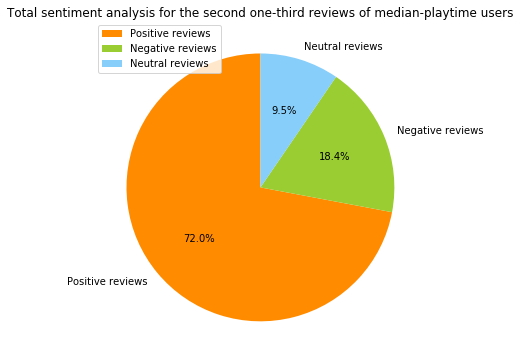

In [439]:
plt.figure(figsize=(6,9))
labels = [u'Positive reviews',u'Negative reviews',u'Neutral reviews']
sizes = [len(Pos_text2),len(Neg_text2),len(Neu_text2)]
colors = ['darkorange','yellowgreen','lightskyblue']
patches,l_text,p_text = plt.pie(sizes,labels=labels,colors=colors,
                                labeldistance = 1.1,autopct = '%3.1f%%',shadow = False,
                                startangle = 90,pctdistance = 0.6)
plt.title('Total sentiment analysis for the second one-third reviews of median-playtime users',va = 'top')
plt.legend()
plt.show()

**From the chart, we can find that comparing with the people who play the game more time, the account of the positive reviews has decreased a little and the account of the negative reviews has increased a little. However, comparing with the total reviews, the account of the positive reviews is still more. Therefore, the most of players who play the game in the median part are also basically satisfied for the game.**

### Part 3( Third one third of the reviews from less play-time players):

In [440]:
Pos_text3 = []
Neg_text3 = []
Neu_text3 = []
for sentence in s3:
    print(sentence)
    ss = sid.polarity_scores(sentence)
    for k in sorted(ss):
        print('{0}: {1}, '.format(k, ss[k]))
    if(ss['compound'] >= 0.0):
        if(ss['compound'] > 0.0):
            Pos_text3.append(sentence)
        else:
            Neu_text3.append(sentence)
    else:
        Neg_text3.append(sentence)

Simply put, the best Total War game since Shogun II.
compound: 0.0772, 
neg: 0.242, 
neu: 0.497, 
pos: 0.261, 
Tremendous fun playing with a friend.
compound: 0.8074, 
neg: 0.0, 
neu: 0.194, 
pos: 0.806, 
It's pretty addictive. Turn after turn, you will spend a lot of time in it.


compound: 0.4939, 
neg: 0.0, 
neu: 0.802, 
pos: 0.198, 
If you are a fan of Total War or a fan of the Three Kingdoms era than this is a must buy. 

However if you are new to the series then i still recommend this game as a great place to jump into the series. 

The only issue with starting the series with this game is how difficult it will be to go back and enjoy previous games in the series because of all the updates and change. 

This game easily has the best diplomacy system we have ever seen in a Total War game, complete with the AI constantly and consistently seeking different diplomatic options and allowing the player to approach the AI with many different options to bolster their income, gain trade ag

pos: 0.524, 
China was okay back in the 100s, and when it was under my rule. Good gaem
compound: 0.5859, 
neg: 0.0, 
neu: 0.745, 
pos: 0.255, 
Perhaps the best and most popular strategic game. Check Total War Rome 2 as well.
compound: 0.6697, 
neg: 0.167, 
neu: 0.429, 
pos: 0.403, 
Its a good total war game. it feels fresh, campaign turns dont take long, battles load and play quickly (though it can feel a bit too arcade like somtimes). The heroes are a good addition, taken well from warhammer total war, but not having to godly skills (though they can kill thousands). it also looks beautiful and runs very smooth.

shout out as well to dynasty mode, I was not sure if it would be fun, but I really enjoy it. Hope they can evolve it and also implement in warhammer total war. personally I would love to see some kind of survival mode, with heroes and maybe unit, just endless waves and see how long you can last.

what does feel as a step back to me is the small unit rooster and the similaritie

compound: -0.8309, 
neg: 0.13, 
neu: 0.845, 
pos: 0.026, 
Mighty DONG
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The amount of Diplomacy that you can undertake with other factions really changes up the traditional total war formula for the better. Definitely recommend this game.
compound: 0.4939, 
neg: 0.115, 
neu: 0.647, 
pos: 0.238, 
Fantastic addition to the total war series.

compound: -0.0772, 
neg: 0.312, 
neu: 0.4, 
pos: 0.288, 
Very fun, well optimized, few bugs, and great developers
compound: 0.9237, 
neg: 0.0, 
neu: 0.273, 
pos: 0.727, 
:)
compound: 0.4588, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great adittion to the Total War franchise, I love the setting and the new addition of retinues, they really add some depth. I like the new way provinces work, they’re now called commandries and each commandry has 1 city and then some farmland for example or a transport or lumberyard. This makes them less of a nuisance to manage and so you don’t need to go around your provinces checki

compound: 0.888, 
neg: 0.074, 
neu: 0.716, 
pos: 0.21, 
THIS IS HOW YOU DO TOTAL WAR!

I was very skeptical of this game from the outset because I am a huge 3K fan and thought CA wouldn't do it justice. I was wrong. Despite the delays and CAs crummy business practices in the past they pulled it off and knocked it out of the park. Ten years ago I always said that CA needed to get like Paradox and figure this stuff out. Now with the release of Imperator (which can only be described as an incredible display of mediocrity) I now firmly believe it's the other way around. Way to go!
compound: -0.8396, 
neg: 0.136, 
neu: 0.8, 
pos: 0.064, 
If you've played Shogun 2, Attila, then there's no reason to buy this.
However, if you love total war, and must see the new game, buy it.

I bought a brand new computer ($1600) to play this.
Should have watched more game play videos, hopefully the MODS will fix it
compound: 0.7906, 
neg: 0.1, 
neu: 0.67, 
pos: 0.23, 
This the good stuff
compound: 0.4404, 
n

compound: -0.0554, 
neg: 0.159, 
neu: 0.706, 
pos: 0.136, 
Just amazing........
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Easily the best total war title in a long time. It's challenging, Dynamic, and each faction has a tonne of unique features beyond minor buffs (Looking at you Atilla). Unit variety is a bit lacking, but this results in a finely balanced and tense game overall.

"Though fierce as tigers soldiers be,
Battles are won by strategy.
A hero comes; he gains renown,
Already destined for a crown."
compound: 0.8885, 
neg: 0.11, 
neu: 0.639, 
pos: 0.251, 
its good.
compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
I own every total war game.  I've played them from the start, and this one is one of my favorite entries despite not knowing much of the history of this entry.  Deep game with rewards for your generals.  Balanced units and fun to watch general duels.  I highly recommend this game, whether it be your first time playing a total war or just adding to your col

compound: 0.924, 
neg: 0.079, 
neu: 0.804, 
pos: 0.117, 
One of the best Total War game that i've ever played,
I love it!
compound: 0.8016, 
neg: 0.163, 
neu: 0.375, 
pos: 0.462, 
Great game!
compound: 0.6588, 
neg: 0.0, 
neu: 0.185, 
pos: 0.815, 
" Among men Lu Bu, among horses Red Hair" Watch Lu Bu get one shotted by Yellow Turban commander. 10/10 would give Red Hair to Guan Yu instead again.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Phenomenally beautiful, brutally strategic. I've been playing Total War since the beginning and this completely takes the cake.
compound: -0.4939, 
neg: 0.286, 
neu: 0.507, 
pos: 0.207, 
Love Total War as a series, each game had it's unique setting and features to avoid it from being to repetitive
compound: -0.4404, 
neg: 0.286, 
neu: 0.565, 
pos: 0.148, 
A Total War game with great optomization. I never thought i'd see the day.
compound: 0.0516, 
neg: 0.217, 
neu: 0.556, 
pos: 0.228, 
People crying way too much over silly things.

Game is good, "

compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
An okay game, but still falls short of expectations and i dont like the new unit layout
compound: -0.2993, 
neg: 0.147, 
neu: 0.773, 
pos: 0.08, 
Total War goes back to its historical roots, bringing all the improvements they made in the Warhammer series with it. and Romance Mode adds a delightful twist on the usual formula.
compound: 0.7003, 
neg: 0.098, 
neu: 0.657, 
pos: 0.245, 
Chinese Generals: Gotta catch 'em all!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
This is so trash...The game keep crash...
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
I am absolutely loving the game. It has a nice focus on the improved diplomacy system and not all battles are fought on the field. Last I had a chance to play, I binged for 8 hours and only stopped because I nearly fell asleep playing!
compound: 0.927, 
neg: 0.079, 
neu: 0.566, 
pos: 0.354, 
the game is really fun tbh, a new system, love the duels, the game is pretty fun, i would reco

pos: 0.12, 
10/10 Would China again
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
wait a few month to buy this game. learn about history while playing a game. battle mode looks epic.
compound: -0.2023, 
neg: 0.134, 
neu: 0.773, 
pos: 0.093, 
11/10
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
LEGENDARY
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
No More.
compound: -0.296, 
neg: 0.688, 
neu: 0.312, 
pos: 0.0, 
its a fun game
compound: 0.5106, 
neg: 0.0, 
neu: 0.377, 
pos: 0.623, 
They to patch the game for now, and I hope they continue to do so.

It is a fun game with a friend, but the AI has it's issue many times during fights and what the other characters in the game does. 

They already released 3 dlc's over 2 months, which is absurd when you already pay $60 dollars for this game. Should have more content to please the community. If the community is pleased, new people will join in the game.
compound: 0.88, 
neg: 0.057, 
neu: 0.763, 
pos: 0.18, 
The best historical TW yet.

compound: -0.1831, 
neg: 0.165, 
neu: 0.689, 
pos: 0.146, 
zheng jiang tribute p good tbh

SUN REN
compound: 0.4404, 
neg: 0.0, 
neu: 0.674, 
pos: 0.326, 
rip total war...  prob next game will look like dota 2 ...
compound: 0.3612, 
neg: 0.0, 
neu: 0.8, 
pos: 0.2, 
100% recommend
compound: 0.3612, 
neg: 0.0, 
neu: 0.286, 
pos: 0.714, 
Great game! only thing I find semi annoying is the flags of each country tend to be kinda similar  which causes me diplomatic confusion at times but really this isn't a big issue.
compound: 0.1007, 
neg: 0.109, 
neu: 0.817, 
pos: 0.074, 
This is now considered my favourite Total War game to date, Shogun 2 being the second one, though I held Shogun 2 in such high regard that Three Kingdoms and Shogun 2 are almost neck-in-neck for me since they both offer something really enjoyable in their own way.

This is like Chinese Game of Thrones the Total War game. Diplomacy plays a much larger role in this where characters have some sort of nemesis/loyal system whe

compound: 0.9905, 
neg: 0.045, 
neu: 0.674, 
pos: 0.281, 
 Very well optimized, Looking forward to TW: WH3 on a just as smooth loading times.
compound: 0.688, 
neg: 0.0, 
neu: 0.679, 
pos: 0.321, 
f
compound: 0.0, 
neg: 0.0, 
neu: 0.0, 
pos: 0.0, 
zhao yun is cute
compound: 0.4588, 
neg: 0.0, 
neu: 0.5, 
pos: 0.5, 

the best Total war  for a long time
compound: 0.0772, 
neg: 0.298, 
neu: 0.382, 
pos: 0.321, 
Some of the most fun I've ever had in a Total War game. Diplomacy is deeper, the new romance mode is a nice change of pace, and the setting is a fun change from Europe.
compound: 0.8653, 
neg: 0.088, 
neu: 0.607, 
pos: 0.305, 
Great game finally fixed the damn diplomacy that got messed up during the atrocious Rome 2 and Attila total war Combat is solid i could write more but fuck it just buy the game
compound: -0.8409, 
neg: 0.308, 
neu: 0.599, 
pos: 0.092, 
Really Fun Total war game 
Ps. writing this review to complete Qualifier Tasks but i do totally love this game
compound: 0.78

compound: 0.7351, 
neg: 0.062, 
neu: 0.84, 
pos: 0.098, 
- Banished my son and heir.
- Adopted a 30 year old.
- Made him my heir.
- And my wife hates me..................

Good game
compound: 0.0, 
neg: 0.122, 
neu: 0.756, 
pos: 0.122, 
I was expecting much more detailed campaign mod at least better than shogun2 but in this game just the story different you can not differ the mechanism from other total  war games. So after many years, There must be some different mechanism that may you enjoy so that this reason make the play very short.
compound: 0.4588, 
neg: 0.083, 
neu: 0.773, 
pos: 0.145, 
Good game but bad DLC policy 3 in 3 months
compound: -0.5859, 
neg: 0.374, 
neu: 0.472, 
pos: 0.154, 
this game is good
compound: 0.4404, 
neg: 0.0, 
neu: 0.508, 
pos: 0.492, 
I like the diplomacy aspect a lot because I like the speech aspect of a lot of games and this game seems to have a greater focus on it than others so good. Jolly good job m8s!
compound: 0.9575, 
neg: 0.0, 
neu: 0.58, 
pos: 

compound: 0.99, 
neg: 0.04, 
neu: 0.721, 
pos: 0.239, 
Good work CA. Very good. I weep and commend you for finally being the one god damned company who copied and improved the dueling system from Warhammer Mark of Chaos. And me, being the only person alive ebullient enough to congratulate you on this STILL have to ask you; without askance. Are you able to sleep at night knowing it was from THAT game you copied!?

I just want you to know, there are people here who care for you and are willing to talk about your troubles. But most importantly, willing to forgive your vulgar transgression!

With Love
That One Person Who Liked That One Warhammer Game.
compound: 0.9661, 
neg: 0.095, 
neu: 0.64, 
pos: 0.264, 
First impressions are absurdly positive. I'm really impressed with this one. There's so much stuff in this game, and it's all so well presented and well put together.

This really feels like a whole new level of grand strategy games, setting the bar higher than ever.
compound: 0.9593, 


compound: 0.9804, 
neg: 0.039, 
neu: 0.818, 
pos: 0.143, 
Monty Mole approved
compound: 0.4215, 
neg: 0.0, 
neu: 0.417, 
pos: 0.583, 
this game so fking good
compound: 0.4902, 
neg: 0.0, 
neu: 0.557, 
pos: 0.443, 
A very interesting take on the total war formula. Although the campaign map is land only, the map is beautiful and with a wide variety of battlegrounds.

Units are organised into colours and their specialty and generals are too.

If there was one con I can think of, it would be that the campaign feels rather easy this time around on normal, though this could be alleviated through just using the difficulty slider.
compound: 0.4391, 
neg: 0.097, 
neu: 0.783, 
pos: 0.12, 
The first thing that I have to say is that I highly recommend this game if you like Total War. 
It has great graphics, it runs great, the battles are highly entertaining and it has the best diplomacy in the franchise.
This is also one of my favorites alongside Shogun 2 and Rome 2.
compound: 0.953, 
neg: 0.09, 


neu: 0.625, 
pos: 0.375, 
Never have I been so invested in a total war game until I played this one.

Ive played countless other Total Wars like Shogun 2, Rome 2, Warhammer 1and 2; now finally Three kingdoms and from what ive experienced so far this is my favorite.

If you've played the Total War series before and enjoy it you'll be right at home, combat pacing is good, armys die at a reasonable rate compared to Shogun 2(things die to quick) and Rome (units can fight for a long time) its right in the middle they survive pretty well depending on how fresh they are and the morale from there general. 

If your unaware they added a new system For this game called Romance which adds some myth to the generals in the game, they are to be approached with caution and can change the tide of battle singlehandedly. I personally love this setting over the classic general system where they have an escort.

Lastly while I have played many Total Wars, due to the timing of my recent purchase things lik

compound: -0.8988, 
neg: 0.183, 
neu: 0.759, 
pos: 0.059, 
Thats alright
compound: 0.25, 
neg: 0.0, 
neu: 0.333, 
pos: 0.667, 
Unfinished and clumsy. Clearly needs a few GBs of updates and dozens of overpriced DLC to make it playable.
compound: 0.4019, 
neg: 0.0, 
neu: 0.863, 
pos: 0.137, 
good
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Main quest asked me to destroy Yuan Shao then i became military alliance with Yuan Shao, took over half Chinese with Yuan Shao... no further main quest given. 10/10 would reunite Chinese again <3
compound: -0.4215, 
neg: 0.148, 
neu: 0.777, 
pos: 0.075, 
Just needs blood
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
One of the most dull total war games to date.
compound: -0.7996, 
neg: 0.472, 
neu: 0.528, 
pos: 0.0, 
Fun
compound: 0.5106, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Not as good as Warhammer 2 but still a very good game regardless. Campaign mechanics are good but battles are just nowhere near as good as Warhammer 1 and 2.
compound: -0.9

compound: -0.727, 
neg: 0.125, 
neu: 0.818, 
pos: 0.057, 
Previus total war reskined with a few new mechanics.
compound: -0.5994, 
neg: 0.358, 
neu: 0.642, 
pos: 0.0, 
OOOOOOhhhh my god boys and girls the only thing this game is missing is Jackie Chan...
compound: -0.0258, 
neg: 0.12, 
neu: 0.765, 
pos: 0.115, 
A bunch of content, good combat, amazing optimization? A++
compound: 0.7845, 
neg: 0.153, 
neu: 0.255, 
pos: 0.592, 
This game has broken my $4000 gaming pc, the download file of this product has corrupted my pc and ruined all of my games. I have reached out to steam and MSI to address the issue as CA has shown zero support.
compound: -0.4767, 
neg: 0.131, 
neu: 0.782, 
pos: 0.087, 
boring, slow, did not pull me in
compound: -0.3182, 
neg: 0.277, 
neu: 0.723, 
pos: 0.0, 
Very well polished and indepth, best of both worlds with romance mode and records, the normal historical mode people are accustomed too. New features with duels and finally a working diplomancy. Overall great re

compound: 0.9919, 
neg: 0.135, 
neu: 0.608, 
pos: 0.256, 
I have not been able to play too much since purchasing, as you can see. However, I quite enjoy the game, as I do for most of the Total War games. I can definitely recommend the game to anyone who is a interested or a fan of the Total War series.
compound: 0.7425, 
neg: 0.128, 
neu: 0.608, 
pos: 0.264, 
I am a total newbie when it comes total war and have only played shogun 2 and it was a fucking awesome game! Not easy to learn but you can get behind it and have a lot of fun while mastering the different mechanics.
Three Kingdoms is absolutlety trash. There is zero explanation for anything, there is not nearly enough help to get a basic understanding of every fucking shit which is in the game. Seriously, my batchelor is way easier than understanding this shithole of a game. Maybe if you invest the first 20 hours in youtube videos and toturials on google but thats not the way i want to play a game. If i have to invest 10+ hours to

compound: -0.9843, 
neg: 0.156, 
neu: 0.723, 
pos: 0.121, 
sick game
compound: -0.5106, 
neg: 0.767, 
neu: 0.233, 
pos: 0.0, 
Bland, with some improvents (mainly in diplomacy), but far from enough to justify playing this instead of previous games. Not really a fan of the setting either and the game never explore the characters anyhow. Spend you money elsewere! (Might improve in the future)
compound: 0.5535, 
neg: 0.056, 
neu: 0.814, 
pos: 0.129, 
The best Three Kingdoms game i ever played.
compound: 0.765, 
neg: 0.0, 
neu: 0.431, 
pos: 0.569, 
It's been over 2 weeks since the launch of this game and I still can't get a campaign going. The game just crashes on the load screen every time. I'm glad I wasted $90 on this. Does anyone know how I can inquire about a refund? 

Edit: It's nothing to do with my hardware. I'm still running other Total War titles, with no problems at all. As well as other games, that aren't apart of the TW series, again with no problems at all.

Hardware I'm runni

compound: 0.4291, 
neg: 0.127, 
neu: 0.711, 
pos: 0.162, 
Literally only 2 hours in and I am blown away by all the changes, and all the options. It is the most accessible the series has been; newcomers and veterans have everything they need to be able to enjoy the game, and the way they want! This is the best TW since Shogun 2, and it took all the amazing RPG elements from Warhammer 1 and 2 to create something new for the series, but also offering the option to turn all that off and play it like a historical strategy sim (like a normal TW).
compound: 0.901, 
neg: 0.0, 
neu: 0.847, 
pos: 0.153, 
Just couldnt get into this one idk why but would rather play more of any of the previous total war games.
compound: -0.5346, 
neg: 0.237, 
neu: 0.651, 
pos: 0.112, 
Three Kingdom looks interesting at the beginning, but it gets boring pretty fast. 

The game has 0 replayability and it lacks many things which made Total War games great in the long run.
compound: 0.5423, 
neg: 0.176, 
neu: 0.573, 


compound: 0.8063, 
neg: 0.111, 
neu: 0.737, 
pos: 0.152, 
I cant load the game and i dont know why. i have tried multiple methods and nothing is working
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Could not start with my desktop. My desktop has 8G RAM and GTX1080 graphic card, configuration should not be a problem, anyone could help on this?!
compound: 0.6428, 
neg: 0.0, 
neu: 0.814, 
pos: 0.186, 
i really wanted to like it, but something about the graphics and the battles... also one building at a time construction brings less depth to the game.. just my opinion.
compound: 0.222, 
neg: 0.0, 
neu: 0.935, 
pos: 0.065, 
BEST GAME !!
compound: 0.7592, 
neg: 0.0, 
neu: 0.266, 
pos: 0.734, 
Its fun and all but can get very boring
compound: -0.3048, 
neg: 0.27, 
neu: 0.558, 
pos: 0.171, 
Terrible, just terrible...what happened to the total war seires?
Broken AI and diplomacy, where your ally with 100+ reputation/relationship just randomly backstabs you for no reason. 
The battles are bo

neg: 0.183, 
neu: 0.817, 
pos: 0.0, 
If you are looking for the classic Total War experience; steer clear.
compound: -0.3182, 
neg: 0.236, 
neu: 0.606, 
pos: 0.158, 
Write a review.... Certainly , if i ever manage to pass the start screen.
It's unbelievable. I dont have words for this. I can't even get mad at this. I just received my Collectors Edition, activated the game , waited for the download to occur , i never use the CD's, i noticed it also dowloaded the 1.0.2 patch , pressed the launch button and!!!!! ...here i am , unable to even launch the game. Speechless...
Gendlemen in the CA, have mercy on us.

PS  Now i must choose "recommend" or "not recommend". I dont want to give a "red hand" since i havent try it. But i will only give the "blue hand" because i have to choose one of the two.
compound: 0.9438, 
neg: 0.0, 
neu: 0.843, 
pos: 0.157, 
It's Three Kingdoms , no need to ask.
compound: -0.296, 
neg: 0.268, 
neu: 0.732, 
pos: 0.0, 
Unfortunately, I am unable to even play the ga

compound: 0.8764, 
neg: 0.097, 
neu: 0.743, 
pos: 0.16, 
Still better shogun totalwar 2/ warhammer 2
compound: 0.4404, 
neg: 0.0, 
neu: 0.633, 
pos: 0.367, 
Loading time to long.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
I was really looking forward to this game but like EVERY TW title since Med 2, CA has not made it possible to scale the UI in a significant way. Even at 200 % unit scaling I can barely read any of the text. My monitor is only three feet from my face and I have to bury my head against the monitor just to read the small text.

Now not all of you are gonna have this issue, I've seen some people that have. 

Otherwise, from game play I've seen, it's phenomenal. 

However, for me; totally unplayable. 

This has got to get fixed, CA.
compound: 0.8201, 
neg: 0.0, 
neu: 0.919, 
pos: 0.081, 
Games audio never wants to work. Have music playing while i start it to see if it cuts out all audio but no, just the game. When I find a fix ill actually try the game out.

compound

In [441]:
print("The quantity of positive sentiment is",len(Pos_text3))
print("The quantity of neutral sentiment is",len(Neu_text3))
print("The quantity of negative sentiment is",len(Neg_text3))

The quantity of positive sentiment is 2117
The quantity of neutral sentiment is 316
The quantity of negative sentiment is 824


<Figure size 432x648 with 0 Axes>

Text(0.5, 1.0, 'Total sentiment analysis for the last one-third reviews of short-playtime users')

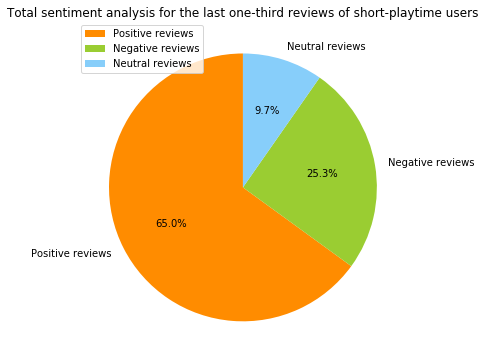

In [442]:
plt.figure(figsize=(6,9))
labels = [u'Positive reviews',u'Negative reviews',u'Neutral reviews']
sizes = [len(Pos_text3),len(Neg_text3),len(Neu_text3)]
colors = ['darkorange','yellowgreen','lightskyblue']
patches,l_text,p_text = plt.pie(sizes,labels=labels,colors=colors,
                                labeldistance = 1.1,autopct = '%3.1f%%',shadow = False,
                                startangle = 90,pctdistance = 0.6)
plt.title('Total sentiment analysis for the last one-third reviews of short-playtime users',va = 'top')
plt.legend()
plt.show()

**From the chart, we can find that the account of the positive reviews decreased more clearly comparing with that of the more play-time players and the median play-time players. And similarly, the negative reviews account increased more clearly than in those charts. Therefore, it could show that the players who play less time are not satisfied with the game so that they will give worse review. **

# 6. Analysis with topic model 

## 6.1 Split the data basing on vote_up
- #### The aim in this process is to extract information from different group of people
- #### Remind that: 
 - voted_up -  true means it was a positive recommendation
- #### Split the whole people into two group: 
 - Group1 - 'voted_up' == True
 - Group2 - 'voted_up' == False

In [104]:
df_raw['voted_up'].value_counts()

True     8309
False    1464
Name: voted_up, dtype: int64

From the above we see that among all 9773 reviews. 8309 hold positive recommendation, 1464 hold negative

In [234]:
# Divide the people into two group
# Group1 - 'voted_up' == True
# Group2 - 'voted_up' == False
df_voteup_True = df_raw[df_raw['voted_up'] == True]
df_voteup_False = df_raw[df_raw['voted_up'] == False]
text_voteup_true = df_voteup_True['review']
text_voteup_false = df_voteup_False['review']

## 6.2 Use LDA to find topic

### 6.2.1 For Group1 with 'voted_up' == True
####  Find the number of topics ($K$)
- Perplexity may be one way for you to find the number of topics
    - Typically, the best number of topics should be around the **lowest perplexity**
- However, in practice, a few factors need to be considered:
  - It is usually difficult for human to understand or visulaize a big number of topics
  - We manually scan the data to figure out possible topics in the data
  - Usually, after LDA, we need manually inspect each discovered topic, merge or trim topics to get semantically coherent but distinguishable topics

In [443]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf2 = TfidfVectorizer(max_df=0.05,min_df=30, stop_words='english')
re = tfidf2.fit_transform(text_voteup_true)
# split dataset into train (90%) and test sets (10%)
# the test sets will be used to evaluate proplexity of topic modeling
#X_train_1, X_test_1 = train_test_split(re, test_size=0.1, random_state=0)
X_train_1 = re
tf_feature_names = tfidf2.get_feature_names()

2 971.5341721708966
3 1201.4409443288378
4 1375.7945845470463
5 1487.6325537822102
6 1656.2702353264494
7 1851.8203353989313
8 2082.942578016727
9 2175.6081813548612
10 2521.3675761684385
11 2543.065225605583
12 2686.2317377603063
13 2653.746065570394
14 2739.4754795316126
15 3009.210468785763
16 2550.856751607957
17 2937.9402823274645
18 2746.259194313057
19 2883.3266656386763
20 3463.3286411405093
21 3643.0213490226997
22 3927.592031229128
23 4045.549209358576
24 4594.7247457648145


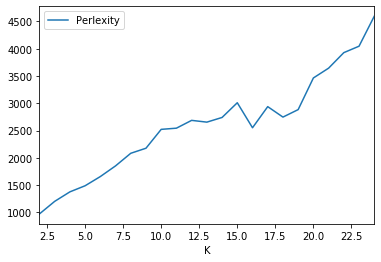

In [396]:
import numpy as np
import matplotlib.pyplot as plt

result=[]
for num_topics in range(2,25):
    lda = LatentDirichletAllocation(n_components=num_topics, \
                                learning_method='online', \
                                max_iter=10,verbose=0, n_jobs=1,
                                random_state=0).fit(X_train_1)
    p=lda.perplexity(X_train_1)
    result.append([num_topics,p])
    print(num_topics, p)


import pandas as pd
pd.DataFrame(result, columns=["K", "Perlexity"]).plot.line(x='K',y="Perlexity");
plt.show();



####  Realize the LDA model
- From the perplexity we choose the number of topic as 16

In [444]:
# LDA to discover topics 
from sklearn.decomposition import LatentDirichletAllocation
num_topics = 16
# Run LDA
# max_iter control the number of iterations 
# evaluate_every determines how often the perplexity is calculated
# n_jobs is the number of parallel threads
lda = LatentDirichletAllocation(n_components=num_topics, \
                                max_iter=25,verbose=1,
                                evaluate_every=1, n_jobs=1,
                                random_state=0).fit(X_train_1)

iteration: 1 of max_iter: 25, perplexity: 8456.8436
iteration: 2 of max_iter: 25, perplexity: 6306.7435
iteration: 3 of max_iter: 25, perplexity: 5229.8137
iteration: 4 of max_iter: 25, perplexity: 4565.7180
iteration: 5 of max_iter: 25, perplexity: 4117.7118
iteration: 6 of max_iter: 25, perplexity: 3813.5449
iteration: 7 of max_iter: 25, perplexity: 3595.5967
iteration: 8 of max_iter: 25, perplexity: 3447.9416
iteration: 9 of max_iter: 25, perplexity: 3358.4817
iteration: 10 of max_iter: 25, perplexity: 3300.0088
iteration: 11 of max_iter: 25, perplexity: 3256.5274
iteration: 12 of max_iter: 25, perplexity: 3223.6577
iteration: 13 of max_iter: 25, perplexity: 3198.4533
iteration: 14 of max_iter: 25, perplexity: 3179.2393
iteration: 15 of max_iter: 25, perplexity: 3163.5243
iteration: 16 of max_iter: 25, perplexity: 3150.1354
iteration: 17 of max_iter: 25, perplexity: 3138.5825
iteration: 18 of max_iter: 25, perplexity: 3127.2528
iteration: 19 of max_iter: 25, perplexity: 3115.2849
it

In [445]:
# Check topic and word distribution per topic

num_top_words = 10

# lda.components_ returns a KxN matrix
# for word distribution in each topic.
# Each row consists of 
# probability (counts) of each word in the feature space

for topic_idx, topic in enumerate(lda.components_):
    print ("Topic %d:" % (topic_idx))
    # print out top 20 words per topic 
    words=[(tf_feature_names[i],topic[i]) \
           for i in topic.argsort()[::-1][0:num_top_words]]
    print(words)
    print("\n")

Topic 0:
[('strategy', 41.963425489039714), ('fantastic', 38.11606291106211), ('long', 34.88380574020764), ('graphics', 22.656805679215093), ('release', 17.488618784445862), ('100', 17.321750448460914), ('gameplay', 16.99852158113086), ('style', 16.82540760909814), ('art', 16.275736165813797), ('forward', 14.967766732714761)]


Topic 1:
[('epic', 26.52328259280747), ('simply', 20.186462703958014), ('story', 17.84728686153461), ('easily', 14.998722208508017), ('era', 13.950685915085664), ('yeah', 12.693566946767909), ('day', 11.886225911107319), ('works', 11.554022058977438), ('disappointed', 11.441568456844816), ('brings', 11.069431615716361)]


Topic 2:
[('finally', 24.84276111228602), ('shit', 22.178559218665686), ('job', 21.934862287396903), ('koei', 18.7195067181397), ('medieval', 17.54397483826273), ('opinion', 13.914395250571749), ('did', 12.869927961980089), ('stuff', 12.790852566440687), ('incredible', 12.782053211914645), ('wow', 12.194682924242183)]


Topic 3:
[('probably', 3

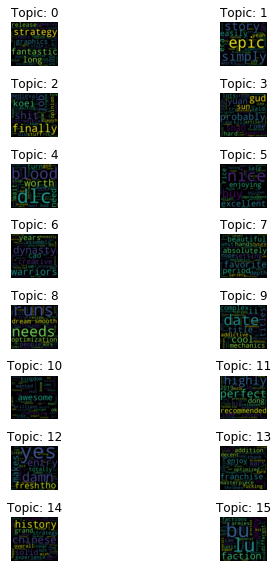

In [257]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import math

num_top_words=50
f, axarr = plt.subplots(8, 2, figsize=(8, 8));

for topic_idx, topic in enumerate(lda.components_):
    # create a dataframe with two columns (word, weight) for each topic
    
    # create a word:count dictionary
    f={tf_feature_names[i]:topic[i] for i in topic.argsort()[::-1][0:num_top_words]}
    
    # generate wordcloud in subplots
    wordcloud = WordCloud(width=480, height=450, margin=0, background_color="black");
    _ = wordcloud.generate_from_frequencies(frequencies=f);
    
    _ = axarr[math.floor(topic_idx/2), topic_idx%2].imshow(wordcloud, interpolation="bilinear");
    _ = axarr[math.floor(topic_idx/2), topic_idx%2].set_title("Topic: "+str(topic_idx));
    _ = axarr[math.floor(topic_idx/2), topic_idx%2].axis('off')

plt.tight_layout()
plt.show()

#### Generate the Document-topic matrix
- There would be 8309 rows, each row represents a document

In [258]:
# Predict the topic distribution of each document in training set and
# select the topic with highest probability.
topic_assign = lda.transform(X_train_1)
test_topic = pd.DataFrame(topic_assign)
test_topic

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,0.018177,0.018177,0.392601,0.018177,0.352924,0.018177,0.018177,0.018177,0.018177,0.018177,0.018177,0.018177,0.018177,0.018177,0.018177,0.018177
1,0.013388,0.013388,0.013388,0.013388,0.013388,0.013388,0.013388,0.013388,0.191546,0.013388,0.013388,0.013388,0.013388,0.013388,0.013388,0.621028
2,0.031250,0.031250,0.031250,0.031250,0.031250,0.531250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250
3,0.727737,0.018151,0.018151,0.018151,0.018151,0.018151,0.018151,0.018151,0.018151,0.018151,0.018151,0.018151,0.018151,0.018151,0.018151,0.018151
4,0.031250,0.531250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8304,0.020888,0.192327,0.020888,0.020888,0.020888,0.020888,0.020888,0.020889,0.020888,0.515235,0.020888,0.020888,0.020888,0.020888,0.020889,0.020888
8305,0.031250,0.031250,0.531250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250
8306,0.062500,0.062500,0.062500,0.062500,0.062500,0.062500,0.062500,0.062500,0.062500,0.062500,0.062500,0.062500,0.062500,0.062500,0.062500,0.062500
8307,0.031250,0.031250,0.031250,0.531250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250,0.031250


#### Combine the topic to document 
- Creat a dataframe with two column
- The 'text' column represent the reviews
- The 'topic' column represent in which topic of the such document

In [268]:
# Make prediction on test sample
predicted_lda = test_topic.idxmax(axis=1, skipna=True).values
text_topic_1 = pd.DataFrame({'text':text_voteup_true.values, 'topic':predicted_lda})
text_topic_1

,text,topic
0,"A good back to form for total war, so far a ga...",2
1,"Awesome game , but my only problem is the camp...",15
2,nice,5
3,better than every Total war game i have played...,0
4,I Love Three Kingdoms Story,1
...,...,...
8304,The most engaging Total War game yet. I hope t...,9
8305,incredible,2
8306,A very elaborate game,0
8307,gud,3


#### Draw the histogram of the topic

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x127565f60>]],
      dtype=object)

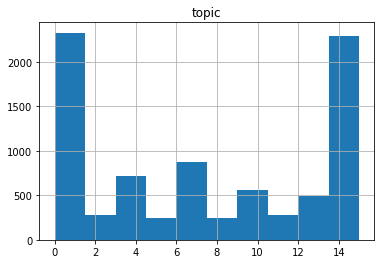

In [269]:
text_topic_1.hist('topic')

#### Find the typical documents for each topic
- From the Document-topic matrix, the value represents the percentage of the topic in such document
- We find the top 10 in each topic and see the reviews

In [347]:
def find_top3(topic):
    df = test_topic.sort_values(by = [topic], ascending = [False])
    top10_id = df.head(10).index
    df_result = text_topic_1.iloc[top10_id,:]
    for i in df_result['text']:
        print('The top 10 review from topic ' + str(topic) + ':')
        print(i)
        print('\n')
    print('End for topic '+ str(topic))
    print('\n\n')

In [348]:
for i in np.arange(16):
    find_top3(i)

The top 10 review from topic 0:
after playing total war warhammer for so long, the load times and turn times seem to be super quick, everything runs smoothly and the game itself looks visually stunning, i love this game as a great alternative to the fantasy total war and CA have nailed this, was worth the wait and the delay for them to get it spot on


The top 10 review from topic 0:
Over all if you like Total War anything then this game is for you. But holy hell are the load times long. They aren't Anthem long or frequent but when they show up they are long. Entering battle is my biggest gripe. Initial load in? Sure, I get that one being a bit long. Loading into battle has taken 10+ minutes several times and no, its not my computer.


The top 10 review from topic 0:
I have not played this a tonne yet but I like it so far. I am a big fan of the total war franchise (though not their DLC policy) and have been playing their games since the beginning. My favourite was always the original R

### 6.2.1 For Group1 with 'voted_up' == False
#### We follow the same process as above

In [426]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf3 = TfidfVectorizer(stop_words='english',max_df=0.03,min_df=5)
ref = tfidf3.fit_transform(text_voteup_false)
# split dataset into train (90%) and test sets (10%)
# the test sets will be used to evaluate proplexity of topic modeling
#X_train_2, X_test_2 = train_test_split(ref, test_size=0.1, random_state=0)
X_train_2 = ref
tf_feature_names = tfidf3.get_feature_names()

2 2969.9860381514886
3 3967.191077922604
4 5058.385322863464
5 5570.641757214348
6 6439.161158395345
7 6966.779054132588
8 7564.833060667023
9 9481.083516784178
10 10710.720482091245
11 9306.62844255792
12 9723.61669093668
13 10309.461077294898
14 10777.57626458026
15 11492.178475643472
16 12273.839267410178
17 12445.718553170755
18 13138.749818642566
19 14830.026345772989
20 14315.435811179066
21 14439.234508126001
22 17473.302419289597
23 16339.587062740473
24 24904.455741492307


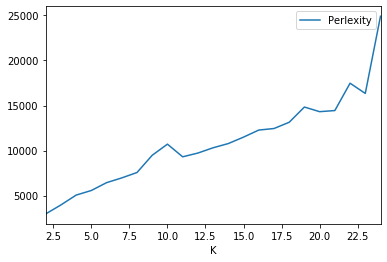

In [427]:
import numpy as np
import matplotlib.pyplot as plt

result=[]
for num_topics in range(2,25):
    lda = LatentDirichletAllocation(n_components=num_topics, \
                                learning_method='online', \
                                max_iter=10,verbose=0, n_jobs=1,
                                random_state=0).fit(X_train_2)
    p=lda.perplexity(X_train_2)
    result.append([num_topics,p])
    print(num_topics, p)


import pandas as pd
pd.DataFrame(result, columns=["K", "Perlexity"]).plot.line(x='K',y="Perlexity");
plt.show();




In [428]:
# LDA to discover topics 
from sklearn.decomposition import LatentDirichletAllocation
num_topics = 4
# Run LDA
# max_iter control the number of iterations 
# evaluate_every determines how often the perplexity is calculated
# n_jobs is the number of parallel threads
lda_2 = LatentDirichletAllocation(n_components=num_topics, \
                                max_iter=25,verbose=1,
                                evaluate_every=1, n_jobs=1,
                                random_state=0).fit(X_train_2)

iteration: 1 of max_iter: 25, perplexity: 7179.2802
iteration: 2 of max_iter: 25, perplexity: 6791.3699
iteration: 3 of max_iter: 25, perplexity: 6501.3768
iteration: 4 of max_iter: 25, perplexity: 6227.9627
iteration: 5 of max_iter: 25, perplexity: 5949.8938
iteration: 6 of max_iter: 25, perplexity: 5672.9501
iteration: 7 of max_iter: 25, perplexity: 5473.7776
iteration: 8 of max_iter: 25, perplexity: 5332.4669
iteration: 9 of max_iter: 25, perplexity: 5222.2904
iteration: 10 of max_iter: 25, perplexity: 5140.0261
iteration: 11 of max_iter: 25, perplexity: 5089.7121
iteration: 12 of max_iter: 25, perplexity: 5067.2769
iteration: 13 of max_iter: 25, perplexity: 5049.1592
iteration: 14 of max_iter: 25, perplexity: 5034.7121
iteration: 15 of max_iter: 25, perplexity: 5025.2241
iteration: 16 of max_iter: 25, perplexity: 5014.6387
iteration: 17 of max_iter: 25, perplexity: 5007.4563
iteration: 18 of max_iter: 25, perplexity: 5003.6637
iteration: 19 of max_iter: 25, perplexity: 5000.1845
it

In [429]:
# Check topic and word distribution per topic

num_top_words = 10

# lda.components_ returns a KxN matrix
# for word distribution in each topic.
# Each row consists of 
# probability (counts) of each word in the feature space

for topic_idx, topic in enumerate(lda_2.components_):
    print ("Topic %d:" % (topic_idx))
    # print out top 20 words per topic 
    words=[(tf_feature_names[i],topic[i]) \
           for i in topic.argsort()[::-1][0:num_top_words]]
    print(words)
    print("\n")

Topic 0:
[('sale', 8.60916113180274), ('negative', 8.229582948563916), ('diversity', 8.189723048132425), ('quickly', 8.037046758750055), ('step', 7.8323067818078504), ('reviews', 7.799226115860938), ('bland', 7.733778460545213), ('style', 7.573187212319218), ('base', 7.357653057070072), ('horrible', 7.23431616665337)]


Topic 1:
[('unplayable', 9.609854961765036), ('fuck', 9.45743985388559), ('refunded', 6.253663893523959), ('censorship', 6.187523616078877), ('trash', 5.9886105330778125), ('policy', 4.961448612418783), ('launcher', 4.644232380864038), ('drm', 4.042872921289739), ('text', 3.9572492404632325), ('waited', 3.695524332186118)]


Topic 2:
[('crashing', 8.709674489457079), ('crash', 8.64485528726209), ('load', 6.242042399676977), ('damn', 5.685498832679443), ('patch', 5.20686063127545), ('keeps', 4.764745016754615), ('working', 4.423377639013047), ('fucking', 4.121079708218993), ('minutes', 4.10632915457768), ('stop', 4.096002041221054)]


Topic 3:
[('sega', 6.430503769671124

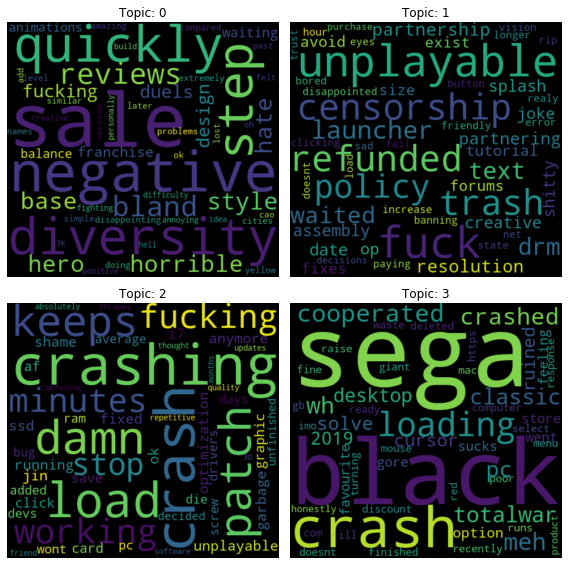

In [380]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import math

num_top_words=50
f, axarr = plt.subplots(2, 2, figsize=(8, 8));

for topic_idx, topic in enumerate(lda_2.components_):
    # create a dataframe with two columns (word, weight) for each topic
    
    # create a word:count dictionary
    f={tf_feature_names[i]:topic[i] for i in topic.argsort()[::-1][0:num_top_words]}
    
    # generate wordcloud in subplots
    wordcloud = WordCloud(width=480, height=450, margin=0, background_color="black");
    _ = wordcloud.generate_from_frequencies(frequencies=f);
    
    _ = axarr[math.floor(topic_idx/2), topic_idx%2].imshow(wordcloud, interpolation="bilinear");
    _ = axarr[math.floor(topic_idx/2), topic_idx%2].set_title("Topic: "+str(topic_idx));
    _ = axarr[math.floor(topic_idx/2), topic_idx%2].axis('off')

plt.tight_layout()
plt.show()

In [381]:
# Predict the topic distribution of each document in training set and
# select the topic with highest probability.
topic_assign_2 = lda_2.transform(X_train_2)
test_topic_2 = pd.DataFrame(topic_assign_2)
test_topic_2

,0,1,2,3
0,0.817818,0.060528,0.061301,0.060353
1,0.250000,0.250000,0.250000,0.250000
2,0.081019,0.074509,0.074021,0.770450
3,0.730751,0.040453,0.038860,0.189936
4,0.872042,0.042230,0.042494,0.043234
...,...,...,...,...
1459,0.093052,0.714652,0.100592,0.091704
1460,0.078132,0.779198,0.072175,0.070495
1461,0.715148,0.100750,0.092216,0.091886
1462,0.828454,0.056990,0.057864,0.056692


In [382]:
# Make prediction on test sample
predicted_lda_2 = test_topic_2.idxmax(axis=1, skipna=True).values
text_topic_2 = pd.DataFrame({'text':text_voteup_false.values, 'topic':predicted_lda_2})
text_topic_2

,text,topic
0,"For the first few hours, the game awes you wit...",0
1,Don't buy this if you like Total War.,0
2,Would be great for once that if they made game...,3
3,https://www.youtube.com/watch?v=29-iFOEOgIM\n\...,0
4,"Compared to Warhammer 1 & 2, and Rome 2, this ...",0
...,...,...
1459,"It takes to long to load, into the game, into ...",1
1460,Already bored with this total war title after ...,1
1461,Very confusing. Doesnt give enough time to rea...,0
1462,A lot of new functions and mechanics create a ...,0


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x164f91be0>]],
      dtype=object)

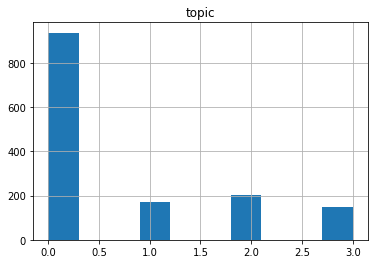

In [383]:
# Draw the hist
text_topic_2.hist('topic')

In [384]:
def topic_rep(topic):
    df = text_topic_2[text_topic_2['topic'] == topic]
    for i in df['text']:
        print('From topic ' + str(topic) + ':')
        print(i)
        print('\n')
    print('End for topic '+ str(topic))

In [385]:
for i in np.arange(0,4):
    topic_rep(i)

From topic 0:
For the first few hours, the game awes you with seemingly deep mechanics on the campaign map.

But it's still the same confusing system introduced with Shogun 2. Produce food, specialize some settlements, struggle with money, watch the AI churn out twice as many armies as you...

Total war games are tedious to play. 3 kingdoms is no different.


From topic 0:
Don't buy this if you like Total War.


From topic 0:
https://www.youtube.com/watch?v=29-iFOEOgIM


They spend too much time trying to be Romance of the Three Kingdoms (in fact, just buy that instead). The UI is an evolutionary step in the wrong direction--brings the above video to mind--and I can barely even figure out what is going on half the time. The General abilities are dog shit. The cities are cookie cutter. The battles are legitimately not fun. In previous Total War games I felt affinity for individual units and even went so far as to give them unique names. Now, I feel like I'm throwing paper airplanes at t


From topic 0:
For any fans who read the book multiple times and played most of the games associated with the Three Kingdoms period including myself, the lack of unique characters is the biggest complaint and disappointment that one can personally have about this game. Generic officers with ridiculous names (especially the female characters) almost made the Three Kingdoms period a stranger to me.

Many popular figures and colourful characters in the book like Guo Jia, Huang Gai, Xun Yu, Xun You, Pang Tong, Jia Xu, Ling Tong, Cheng Pu (just to name a few) felt like mere expendables and the lack of late game unique characters like Lu Xun made the game after 100 turns felt like Medieval Chinese Battle Royale than Three Kingdoms. There were no familiar faces, nothing. Three Kingdoms without its characters loses all its flavor in its entirety.

The whole point of ROTK is its larger than life characters, the severe lack of unique characters ruined the immersion and made the game felt like a 

From topic 3:
Would be great for once that if they made games such as this and the Warhammer franchise more compatible with a more general standard of  systems requirements , not just for the high res five percent ; methinks of going back to the likes of Shogun 2 and the such...it didn't say fu@k!ng engaged on the door!!


From topic 3:
Just like Thrones of Britannia the game is boring imo, Why are CA taking their historical games down the fast paced game play fantasy road?




From topic 3:
I bought this game and then just went back to TW: Warhammer. Is this the first total war game I will put less than 10 hours into?  BORING!!!!


From topic 3:
You are seriously making me pay for blood effects? 
Give me one good explanation or piss off!


From topic 3:
Crashes every time on loading screen. Waste of money all around.


From topic 3:
1. <b>Half a game... for this price...</b>
2. Mouse cursor not aligned - can't select elements...






From topic 3:
not nearly as good as previous games

## 6.3 Use BTM to discover topics

In [386]:
# Divide the people into two group
# Group1 - 'voted_up' == True
# Group2 - 'voted_up' == False
df_voteup_True = df_raw[df_raw['voted_up'] == True]
df_voteup_False = df_raw[df_raw['voted_up'] == False]
text_voteup_true = df_voteup_True['review']
text_voteup_false = df_voteup_False['review']

In [391]:
import numpy as np
import pyLDAvis
from biterm.cbtm import oBTM 
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from biterm.utility import vec_to_biterms, topic_summuary # helper functions

if __name__ == "__main__":

    texts = text_voteup_false

    # vectorize texts
    vec = TfidfVectorizer(max_df=0.03,min_df=3,stop_words='english')
    X = vec.fit_transform(texts).toarray()

    # get vocabulary
    vocab = np.array(vec.get_feature_names())

    # get biterms
    biterms = vec_to_biterms(X)

    # create btm
    btm = oBTM(num_topics=16, V=vocab)

    print("\n\n Train Online BTM ..")
    for i in range(0, len(biterms), 10): # prozess chunk of 200 texts
        biterms_chunk = biterms[i:i + 10]
        btm.fit(biterms_chunk, iterations=10)
    topics = btm.transform(biterms)

    print("\n\n Topic coherence ..")
    topic_summuary(btm.phi_wz.T, X, vocab, 10)

    print("\n\n Texts & Topics ..")
    for i in range(len(texts)):
        print("{} (topic: {})".format(texts[i], topics[i].argmax()))







  0%|          | 0/10 [00:00<?, ?it/s]



 Train Online BTM ..








 10%|█         | 1/10 [00:00<00:04,  1.86it/s]





 20%|██        | 2/10 [00:01<00:04,  1.91it/s]





 30%|███       | 3/10 [00:01<00:03,  1.88it/s]





 40%|████      | 4/10 [00:02<00:03,  1.88it/s]





 50%|█████     | 5/10 [00:02<00:02,  1.87it/s]





 60%|██████    | 6/10 [00:03<00:02,  1.86it/s]





 70%|███████   | 7/10 [00:03<00:01,  1.88it/s]





 80%|████████  | 8/10 [00:04<00:01,  1.91it/s]





 90%|█████████ | 9/10 [00:04<00:00,  1.87it/s]





100%|██████████| 10/10 [00:05<00:00,  1.88it/s]






100%|██████████| 10/10 [00:00<00:00, 109.66it/s][A






  0%|          | 0/10 [00:00<?, ?it/s]





 10%|█         | 1/10 [00:00<00:04,  2.22it/s]





 20%|██        | 2/10 [00:00<00:03,  2.18it/s]





 30%|███       | 3/10 [00:01<00:03,  2.20it/s]





 40%|████      | 4/10 [00:01<00:02,  2.16it/s]





 50%|█████     | 5/10 [00:02<00:02,  2.18it/s]





 60%|██████    | 6/10 [00:02<00:01,  2.13it/s]





 70%|███████   | 7/10 [00:03<00:01,  2.15it/s]





 80%|██

100%|██████████| 10/10 [00:00<00:00, 10.13it/s][A






100%|██████████| 10/10 [00:00<00:00, 180.63it/s][A






  0%|          | 0/10 [00:00<?, ?it/s]





 10%|█         | 1/10 [00:00<00:05,  1.72it/s]





 20%|██        | 2/10 [00:01<00:04,  1.72it/s]





 30%|███       | 3/10 [00:01<00:04,  1.72it/s]





 40%|████      | 4/10 [00:02<00:03,  1.72it/s]





 50%|█████     | 5/10 [00:02<00:02,  1.72it/s]





 60%|██████    | 6/10 [00:03<00:02,  1.72it/s]





 70%|███████   | 7/10 [00:04<00:01,  1.72it/s]





 80%|████████  | 8/10 [00:04<00:01,  1.72it/s]





 90%|█████████ | 9/10 [00:05<00:00,  1.72it/s]





100%|██████████| 10/10 [00:05<00:00,  1.72it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





 20%|██        | 2/10 [00:00<00:00, 14.04it/s]





 40%|████      | 4/10 [00:00<00:00, 13.99it/s]





 60%|██████    | 6/10 [00:00<00:00, 13.93it/s]





 80%|████████  | 8/10 [00:00<00:00, 13.90it/s]





100%|██████████| 10/10 [00:00<00:00, 13.78it/s]






  0%|          

 20%|██        | 2/10 [00:01<00:05,  1.47it/s]





 30%|███       | 3/10 [00:01<00:04,  1.61it/s]





 40%|████      | 4/10 [00:02<00:03,  1.69it/s]





 50%|█████     | 5/10 [00:02<00:02,  1.75it/s]





 60%|██████    | 6/10 [00:03<00:02,  1.78it/s]





 70%|███████   | 7/10 [00:03<00:01,  1.84it/s]





 80%|████████  | 8/10 [00:04<00:01,  1.43it/s]





 90%|█████████ | 9/10 [00:06<00:01,  1.06s/it]





100%|██████████| 10/10 [00:08<00:00,  1.19it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





 10%|█         | 1/10 [00:00<00:01,  4.65it/s]





 20%|██        | 2/10 [00:00<00:01,  4.45it/s]





 30%|███       | 3/10 [00:00<00:01,  4.24it/s]





 40%|████      | 4/10 [00:00<00:01,  4.26it/s]





 50%|█████     | 5/10 [00:01<00:01,  4.44it/s]





 60%|██████    | 6/10 [00:01<00:00,  4.59it/s]





 70%|███████   | 7/10 [00:01<00:00,  4.70it/s]





 80%|████████  | 8/10 [00:01<00:00,  4.73it/s]





 90%|█████████ | 9/10 [00:01<00:00,  4.67it/s]





100%|██████████| 1

 30%|███       | 3/10 [00:01<00:02,  2.67it/s]





 40%|████      | 4/10 [00:01<00:02,  2.67it/s]





 50%|█████     | 5/10 [00:01<00:01,  2.66it/s]





 60%|██████    | 6/10 [00:02<00:01,  2.67it/s]





 70%|███████   | 7/10 [00:02<00:01,  2.65it/s]





 80%|████████  | 8/10 [00:03<00:00,  2.64it/s]





 90%|█████████ | 9/10 [00:03<00:00,  2.42it/s]





100%|██████████| 10/10 [00:03<00:00,  2.56it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





 10%|█         | 1/10 [00:00<00:02,  3.64it/s]





 20%|██        | 2/10 [00:00<00:02,  3.65it/s]





 30%|███       | 3/10 [00:00<00:01,  3.62it/s]





 40%|████      | 4/10 [00:01<00:01,  3.53it/s]





 50%|█████     | 5/10 [00:01<00:01,  3.52it/s]





 60%|██████    | 6/10 [00:01<00:01,  3.57it/s]





 70%|███████   | 7/10 [00:01<00:00,  3.58it/s]





 80%|████████  | 8/10 [00:02<00:00,  3.61it/s]





 90%|█████████ | 9/10 [00:02<00:00,  3.59it/s]





100%|██████████| 10/10 [00:02<00:00,  3.57it/s]






  0%|          |

100%|██████████| 10/10 [00:02<00:00,  4.45it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





 10%|█         | 1/10 [00:00<00:04,  2.04it/s]





 20%|██        | 2/10 [00:00<00:03,  2.16it/s]





 30%|███       | 3/10 [00:01<00:03,  2.25it/s]





 40%|████      | 4/10 [00:01<00:02,  2.33it/s]





 50%|█████     | 5/10 [00:02<00:02,  2.36it/s]





 60%|██████    | 6/10 [00:02<00:01,  2.38it/s]





 70%|███████   | 7/10 [00:02<00:01,  2.43it/s]





 80%|████████  | 8/10 [00:03<00:00,  2.46it/s]





 90%|█████████ | 9/10 [00:03<00:00,  2.51it/s]





100%|██████████| 10/10 [00:04<00:00,  2.46it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





 20%|██        | 2/10 [00:00<00:00, 12.15it/s]





 40%|████      | 4/10 [00:00<00:00, 12.50it/s]





 60%|██████    | 6/10 [00:00<00:00, 13.38it/s]





 80%|████████  | 8/10 [00:00<00:00, 13.87it/s]





100%|██████████| 10/10 [00:00<00:00, 14.52it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





 10%|█         | 1/10 [00:00<0

 40%|████      | 4/10 [00:00<00:01,  4.89it/s]





 50%|█████     | 5/10 [00:01<00:01,  4.84it/s]





 60%|██████    | 6/10 [00:01<00:00,  4.85it/s]





 70%|███████   | 7/10 [00:01<00:00,  4.73it/s]





 80%|████████  | 8/10 [00:01<00:00,  4.79it/s]





 90%|█████████ | 9/10 [00:01<00:00,  4.87it/s]





100%|██████████| 10/10 [00:02<00:00,  4.68it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





 10%|█         | 1/10 [00:00<00:01,  7.16it/s]





 20%|██        | 2/10 [00:00<00:01,  7.05it/s]





 30%|███       | 3/10 [00:00<00:01,  6.95it/s]





 40%|████      | 4/10 [00:00<00:00,  6.82it/s]





 50%|█████     | 5/10 [00:00<00:00,  7.00it/s]





 60%|██████    | 6/10 [00:00<00:00,  7.07it/s]





 70%|███████   | 7/10 [00:01<00:00,  7.05it/s]





 80%|████████  | 8/10 [00:01<00:00,  7.06it/s]





 90%|█████████ | 9/10 [00:01<00:00,  7.02it/s]





100%|██████████| 10/10 [00:01<00:00,  6.99it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





 10%|█         | 1/10 [0

 10%|█         | 1/10 [00:00<00:06,  1.50it/s]





 20%|██        | 2/10 [00:01<00:05,  1.56it/s]





 30%|███       | 3/10 [00:01<00:04,  1.61it/s]





 40%|████      | 4/10 [00:02<00:03,  1.66it/s]





 50%|█████     | 5/10 [00:02<00:02,  1.69it/s]





 60%|██████    | 6/10 [00:03<00:02,  1.72it/s]





 70%|███████   | 7/10 [00:04<00:01,  1.75it/s]





 80%|████████  | 8/10 [00:04<00:01,  1.71it/s]





 90%|█████████ | 9/10 [00:05<00:00,  1.72it/s]





100%|██████████| 10/10 [00:05<00:00,  1.72it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





 10%|█         | 1/10 [00:00<00:02,  3.61it/s]





 20%|██        | 2/10 [00:00<00:02,  3.56it/s]





 30%|███       | 3/10 [00:00<00:01,  3.57it/s]





 40%|████      | 4/10 [00:01<00:01,  3.52it/s]





 50%|█████     | 5/10 [00:01<00:01,  3.48it/s]





 60%|██████    | 6/10 [00:01<00:01,  3.44it/s]





 70%|███████   | 7/10 [00:02<00:00,  3.48it/s]





 80%|████████  | 8/10 [00:02<00:00,  3.51it/s]





 90%|█████████ | 9

 10%|█         | 1/10 [00:00<00:01,  5.27it/s]





 20%|██        | 2/10 [00:00<00:01,  5.27it/s]





 30%|███       | 3/10 [00:00<00:01,  5.28it/s]





 40%|████      | 4/10 [00:00<00:01,  5.27it/s]





 50%|█████     | 5/10 [00:00<00:00,  5.25it/s]





 60%|██████    | 6/10 [00:01<00:00,  5.22it/s]





 70%|███████   | 7/10 [00:01<00:00,  5.24it/s]





 80%|████████  | 8/10 [00:01<00:00,  5.23it/s]





 90%|█████████ | 9/10 [00:01<00:00,  5.21it/s]





100%|██████████| 10/10 [00:01<00:00,  5.23it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





 10%|█         | 1/10 [00:01<00:09,  1.11s/it]





 20%|██        | 2/10 [00:02<00:08,  1.09s/it]





 30%|███       | 3/10 [00:03<00:07,  1.07s/it]





 40%|████      | 4/10 [00:04<00:06,  1.08s/it]





 50%|█████     | 5/10 [00:05<00:05,  1.08s/it]





 60%|██████    | 6/10 [00:06<00:04,  1.07s/it]





 70%|███████   | 7/10 [00:07<00:03,  1.06s/it]





 80%|████████  | 8/10 [00:08<00:02,  1.06s/it]





 90%|█████████ | 9

 80%|████████  | 8/10 [00:01<00:00,  4.72it/s]





 90%|█████████ | 9/10 [00:01<00:00,  4.77it/s]





100%|██████████| 10/10 [00:02<00:00,  4.69it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





 10%|█         | 1/10 [00:00<00:05,  1.54it/s]





 20%|██        | 2/10 [00:01<00:05,  1.54it/s]





 30%|███       | 3/10 [00:01<00:04,  1.54it/s]





 40%|████      | 4/10 [00:02<00:04,  1.50it/s]





 50%|█████     | 5/10 [00:03<00:03,  1.51it/s]





 60%|██████    | 6/10 [00:03<00:02,  1.51it/s]





 70%|███████   | 7/10 [00:04<00:01,  1.52it/s]





 80%|████████  | 8/10 [00:05<00:01,  1.53it/s]





 90%|█████████ | 9/10 [00:05<00:00,  1.53it/s]





100%|██████████| 10/10 [00:06<00:00,  1.51it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





 10%|█         | 1/10 [00:00<00:04,  2.07it/s]





 20%|██        | 2/10 [00:00<00:03,  2.07it/s]





 30%|███       | 3/10 [00:01<00:03,  2.08it/s]





 40%|████      | 4/10 [00:01<00:02,  2.08it/s]





 50%|█████     | 5/10 [0

 10%|█         | 1/10 [00:00<00:02,  3.23it/s]





 20%|██        | 2/10 [00:00<00:02,  3.19it/s]





 30%|███       | 3/10 [00:00<00:02,  3.15it/s]





 40%|████      | 4/10 [00:01<00:01,  3.10it/s]





 50%|█████     | 5/10 [00:01<00:01,  3.17it/s]





 60%|██████    | 6/10 [00:01<00:01,  3.04it/s]





 70%|███████   | 7/10 [00:02<00:00,  3.23it/s]





 80%|████████  | 8/10 [00:02<00:00,  2.87it/s]





 90%|█████████ | 9/10 [00:02<00:00,  2.94it/s]





100%|██████████| 10/10 [00:03<00:00,  3.07it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





 10%|█         | 1/10 [00:00<00:04,  1.86it/s]





 20%|██        | 2/10 [00:01<00:04,  1.83it/s]





 30%|███       | 3/10 [00:01<00:03,  1.85it/s]





 40%|████      | 4/10 [00:02<00:03,  1.79it/s]





 50%|█████     | 5/10 [00:02<00:02,  1.82it/s]





 60%|██████    | 6/10 [00:03<00:02,  1.85it/s]





 70%|███████   | 7/10 [00:03<00:01,  1.88it/s]





 80%|████████  | 8/10 [00:04<00:01,  1.90it/s]





 90%|█████████ | 9

 80%|████████  | 8/10 [00:01<00:00,  4.17it/s]





 90%|█████████ | 9/10 [00:02<00:00,  4.23it/s]





100%|██████████| 10/10 [00:02<00:00,  4.28it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





 10%|█         | 1/10 [00:00<00:01,  5.71it/s]





 20%|██        | 2/10 [00:00<00:01,  5.68it/s]





 30%|███       | 3/10 [00:00<00:01,  5.60it/s]





 40%|████      | 4/10 [00:00<00:01,  5.61it/s]





 50%|█████     | 5/10 [00:00<00:00,  5.59it/s]





 60%|██████    | 6/10 [00:01<00:00,  5.55it/s]





 70%|███████   | 7/10 [00:01<00:00,  5.57it/s]





 80%|████████  | 8/10 [00:01<00:00,  5.57it/s]





 90%|█████████ | 9/10 [00:01<00:00,  5.59it/s]





100%|██████████| 10/10 [00:01<00:00,  5.57it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





 20%|██        | 2/10 [00:00<00:00, 11.88it/s]





 40%|████      | 4/10 [00:00<00:00, 11.87it/s]





 60%|██████    | 6/10 [00:00<00:00, 11.83it/s]





 80%|████████  | 8/10 [00:00<00:00, 11.83it/s]





100%|██████████| 10/10 [

 60%|██████    | 6/10 [00:00<00:00,  7.15it/s]





 70%|███████   | 7/10 [00:00<00:00,  7.18it/s]





 80%|████████  | 8/10 [00:01<00:00,  7.19it/s]





 90%|█████████ | 9/10 [00:01<00:00,  7.17it/s]





100%|██████████| 10/10 [00:01<00:00,  7.16it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





 10%|█         | 1/10 [00:00<00:01,  5.43it/s]





 20%|██        | 2/10 [00:00<00:01,  5.41it/s]





 30%|███       | 3/10 [00:00<00:01,  5.39it/s]





 40%|████      | 4/10 [00:00<00:01,  5.38it/s]





 50%|█████     | 5/10 [00:00<00:00,  5.39it/s]





 60%|██████    | 6/10 [00:01<00:00,  5.38it/s]





 70%|███████   | 7/10 [00:01<00:00,  5.37it/s]





 80%|████████  | 8/10 [00:01<00:00,  5.38it/s]





 90%|█████████ | 9/10 [00:01<00:00,  5.39it/s]





100%|██████████| 10/10 [00:01<00:00,  5.36it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





 10%|█         | 1/10 [00:00<00:02,  3.93it/s]





 20%|██        | 2/10 [00:00<00:01,  4.20it/s]





 30%|███       | 3/10 [0

 50%|█████     | 5/10 [00:03<00:03,  1.33it/s]





 60%|██████    | 6/10 [00:04<00:03,  1.33it/s]





 70%|███████   | 7/10 [00:05<00:02,  1.33it/s]





 80%|████████  | 8/10 [00:05<00:01,  1.35it/s]





 90%|█████████ | 9/10 [00:06<00:00,  1.33it/s]





100%|██████████| 10/10 [00:07<00:00,  1.34it/s]






  0%|          | 0/10 [00:00<?, ?it/s]





100%|██████████| 10/10 [00:00<00:00, 63.41it/s][A
/Users/lilinsen/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in true_divide




 Topic coherence ..
Topic 0 | Coherence=-77.61 | Top words= trade annoying field place order infantry build late level difficulty
Topic 1 | Coherence=-89.97 | Top words= sense recruitment management doing family create militia beautiful example gone
Topic 2 | Coherence=-91.49 | Top words= cities lose finally difficult losing non sense problems extremely level
Topic 3 | Coherence=-91.49 | Top words= lose level high entire fast quickly normal siege fighting ridiculous
Topic 4 | Coherence=-96.92 | Top words= doing simple lose force dumb case thought vassal massive major
Topic 5 | Coherence=-111.19 | Top words= reviews finally read runs design comes age difference updates forward
Topic 6 | Coherence=-105.28 | Top words= useless positive difference 15 sense amazing reasons economy ago market
Topic 7 | Coherence=-89.27 | Top words= duels certain works special ones towers command joke abilities morale
Topic 8 | Coherence=-91.09 | Top words= aren quickly tactics fighting means using field ne

KeyError: 2

In [389]:
print("\n\n Topic coherence ..")
topic_summuary(btm.phi_wz.T, X, vocab, 10)





 Topic coherence ..
Topic 0 | Coherence=-69.94 | Top words= reduce industry conflict defensive pool aggression hire technology proxy marriages
Topic 1 | Coherence=-91.40 | Top words= forever spears cluttered 300 watched orders surface tldr pieces defeated
Topic 2 | Coherence=-100.30 | Top words= neighbors agreement knowing counter ended grows qol collapse launched begin
Topic 3 | Coherence=-94.67 | Top words= brother dark kids isnt ranks odd souls maintain reputation potato
Topic 4 | Coherence=-98.20 | Top words= ambush march chasing increase agreements catch numbers everybody comparison majority
Topic 5 | Coherence=-108.70 | Top words= cav admit increase newer forth visual dragons customization room gripes
Topic 6 | Coherence=-101.16 | Top words= charges strategist classes defensive recruited tend assignments nobles everybody attacked
Topic 7 | Coherence=-95.97 | Top words= leads beautifully greater colors reasons confused menus heroic frame inspired
Topic 8 | Coherence=-95.95 | Top

{'coherence': [-69.94350443615242,
  -91.40494861952146,
  -100.29992377633347,
  -94.66659717324353,
  -98.20434764294401,
  -108.70166485822527,
  -101.16301595675043,
  -95.96538357508072,
  -95.95294005615912,
  -101.12663235578898,
  -72.6803290257132,
  -108.3445355079947,
  -92.2991991016743,
  -86.64349259076849,
  -75.9534176884099,
  -55.06062595710547],
 'top_words': [array(['reduce', 'industry', 'conflict', 'defensive', 'pool',
         'aggression', 'hire', 'technology', 'proxy', 'marriages'],
        dtype='<U15'),
  array(['forever', 'spears', 'cluttered', '300', 'watched', 'orders',
         'surface', 'tldr', 'pieces', 'defeated'], dtype='<U15'),
  array(['neighbors', 'agreement', 'knowing', 'counter', 'ended', 'grows',
         'qol', 'collapse', 'launched', 'begin'], dtype='<U15'),
  array(['brother', 'dark', 'kids', 'isnt', 'ranks', 'odd', 'souls',
         'maintain', 'reputation', 'potato'], dtype='<U15'),
  array(['ambush', 'march', 'chasing', 'increase', 'agreem

### We meet the problem that it took too much time to run the BTM model. Before the deaaline we still can't figure it out. So we cut off this part. 